In [1]:
colab = True
if colab:
    !git clone https://github.com/mdrs-thiago/PUC_Redes_Neurais
    import os
    os.chdir('/content/PUC_Redes_Neurais/pos_grad/lista 1')

Cloning into 'PUC_Redes_Neurais'...
remote: Enumerating objects: 302, done.
remote: Counting objects: 100% (302/302), done.
remote: Compressing objects: 100% (236/236), done.
remote: Total 302 (delta 114), reused 233 (delta 45), pack-reused 0
Receiving objects: 100% (302/302), 3.98 MiB | 10.26 MiB/s, done.
Resolving deltas: 100% (114/114), done.


# Redes Neurais
## 1ª Lista de Exercícios - Classificação de padrões


Estudante: Gustavo Melo

Base de dados: wine_quality

### Para cada item da lista de exercício, não esqueça de fazer uma análise pertinente dos resultados obtidos.

<h1> Importante! </h1>

1. Fique atento com os hiperparâmetros iniciais desta lista. Dependendo do problema, os valores podem mudar. Para encontrar um conjunto de parâmetros razoáveis, siga o seguinte roteiro: 

        1. Rode os itens 2.1 e 3.1 com os parâmetros iniciais. Se os dois resultados foram igualmente ruins, modifique os parâmetros do item 3.1 até que o resultado seja relativamente melhor que o 2.1.

        2. Após obter esses melhores parâmetros iniciais, rode novamente o item 2.1 com os mesmos hiperparâmetros para uma comparação mais justa. 

2. O resultado de um modelo de Redes Neurais geralmente depende da inicialização de seus pesos. Portanto, para cada questão, obtenha um resultado médio de pelo menos 10 rodadas.

In [2]:
import numpy as np 
import pandas as pd 
import json
import matplotlib.pyplot as plt 
import seaborn as sns 
from time import sleep
import requests

import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader 

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score, KFold, train_test_split
from sklearn.metrics import classification_report, confusion_matrix

from utils import CustomDataset, transform_data, plot_confusion_matrix
from model_utils import train


In [3]:
class NeuralNetwork(torch.nn.Module):
  '''
  Objeto criado para facilitar o desenvolvimento dos scripts das aulas práticas.
  Opção alternativa à criação externa fdo modelo. Basicamente serve como um 
  'agregador'  de trechos comuns para a criação do modelo. Por exemplo, ao invés
  de gastar n+1 linhas para a criação de um modelo com n camadas, podemos criar 
  o mesmo modelo com apenas uma linha.
  
  Parâmetros de entrada: 
  - hidden_neurons: Lista com a quantidade de neurônios na camada escondida. 
  - hidden_activation: Função de ativação para cada camada escondida. Aceita 
  como parâmetro string ou lista. Caso o parâmetro receba string, então a mesma
  função de ativação é utilizada para todas as camadas escondidas. Caso seja uma 
  lista, cada camada terá sua propria função de ativação definida pela lista.
  - output_activation: Função de ativação para a camada de saída.
  - lr: Taxa de aprendizado
  - n_input: Tamanho do vetor de entrada.
  - n_output: Saída do modelo.
  '''
  def __init__(self,hidden_neurons = 4, hidden_activation = 'relu', output_activation='softmax', lr = 0.05, n_input = 1, n_output = 1):
    # create model
    super(NeuralNetwork, self).__init__()

    self.activations = {'relu': nn.ReLU(), 'sigmoid':nn.Sigmoid(), 'softmax':nn.Softmax()}

    self.fc1 = nn.Linear(n_input, hidden_neurons)
    self.ha = self.activations[hidden_activation]
    self.fc2 = nn.Linear(hidden_neurons, n_output)
    #self.out = self.activations[output_activation]
    
    #self.out = nn.Sigmoid() #Para o caso binário
  def forward(self,x):
    h = self.fc1(x)
    h1 = self.ha(h) 
    y = self.fc2(h1) 
    #y = self.out(h2)
    return y

  def predict(self, x, binary=True):
    y_hat = self.forward(x)

    if binary:
      y_pred = torch.round(torch.sigmoid(y_hat))
      y_pred = y_pred.detach().numpy()
    else:
      y_pred = torch.argmax(y_hat, dim=1)

    return y_pred

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Preparação dos dados

Não esqueça de verificar o path para a pasta. Mude também o filename, de acordo com a base de dados.

In [5]:
dataset_name = 'wine_quality'
dataset_path = f'https://raw.githubusercontent.com/mdrs-thiago/PUC_Redes_Neurais/main/datasets/c_{dataset_name}.csv'
info_path = f'https://raw.githubusercontent.com/mdrs-thiago/PUC_Redes_Neurais/main/datasets/data_info/{dataset_name}/data_info.json'
dataset = pd.read_csv(dataset_path)

In [6]:
resp = requests.get(info_path)
info = json.loads(resp.text)

In [9]:
for col, k in info.items():
    if k == 'categorical':
        dataset[col] = dataset[col].astype(object)

In [10]:
for i in dataset.dtypes.items():
    print(i)

('fixed acidity', dtype('float64'))
('volatile acidity', dtype('float64'))
('citric acid', dtype('float64'))
('residual sugar', dtype('float64'))
('chlorides', dtype('float64'))
('free sulfur dioxide', dtype('float64'))
('total sulfur dioxide', dtype('float64'))
('density', dtype('float64'))
('pH', dtype('float64'))
('sulphates', dtype('float64'))
('alcohol', dtype('float64'))
('target', dtype('int64'))


## Parte I - Compreensão do problema e análise de variáveis

Total: 2,0 pts.


### 1)	Observe a base de dados do problema. Existem variáveis que podem ser eliminadas do dataset? Justifique.

#### Rascunho

In [11]:
dataset.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
target                  0
dtype: int64

In [12]:
dataset['target'].value_counts()

0    744
1    638
2    217
Name: target, dtype: int64

In [13]:
dataset.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,0.670419
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.701915
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,0.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,0.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,1.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,1.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,2.000000


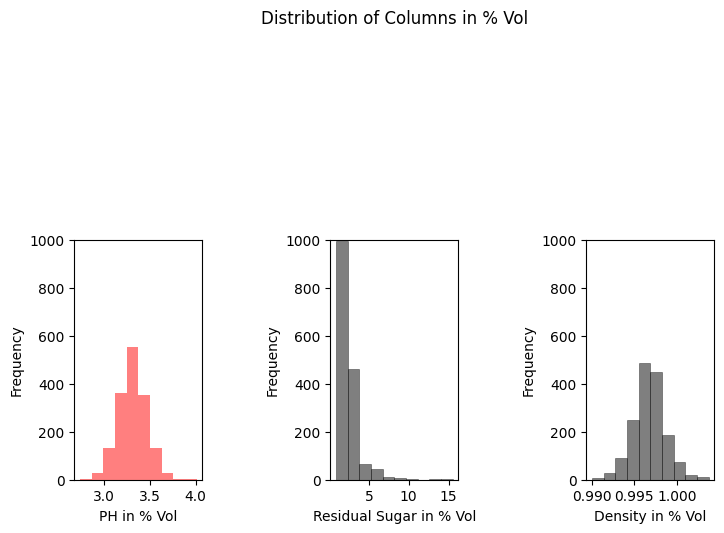

In [14]:
# Create Histogram
fig, ax = plt.subplots(1, 3)
 
ax[0].hist(dataset.pH, 10, facecolor ='red',alpha = 0.5)
 
ax[1].hist(dataset['residual sugar'], 10, facecolor ='black',
            ec ="black", lw = 0.5, alpha = 0.5)

ax[2].hist(dataset.density, 10, facecolor ='black',
           ec ="black", lw = 0.5, alpha = 0.5)
 
fig.subplots_adjust(left = 0, right = 1, bottom = 0,
               top = 0.5, hspace = 0.05, wspace = 1)
 
ax[0].set_ylim([0, 1000])
ax[0].set_xlabel("PH in % Vol")
ax[0].set_ylabel("Frequency")
ax[1].set_ylim([0, 1000])
ax[1].set_xlabel("Residual Sugar in % Vol")
ax[1].set_ylabel("Frequency")
ax[2].set_ylim([0, 1000])
ax[2].set_xlabel("Density in % Vol")
ax[2].set_ylabel("Frequency")

fig.suptitle("Distribution of Columns in % Vol")
plt.show()

#### Resposta

In [15]:
dataset.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
target                  0
dtype: int64

In [16]:
dataset.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,0.670419
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.701915
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,0.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,0.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,1.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,1.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,2.000000


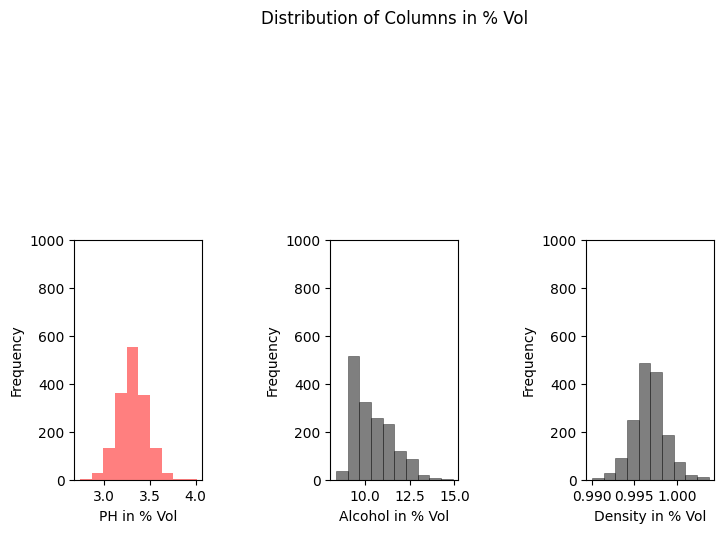

In [17]:
# Create Histogram
fig, ax = plt.subplots(1, 3)
 
ax[0].hist(dataset.pH, 10, facecolor ='red',alpha = 0.5)
 
ax[1].hist(dataset.alcohol, 10, facecolor ='black',
            ec ="black", lw = 0.5, alpha = 0.5)

ax[2].hist(dataset.density, 10, facecolor ='black',
           ec ="black", lw = 0.5, alpha = 0.5)
 
fig.subplots_adjust(left = 0, right = 1, bottom = 0,
               top = 0.5, hspace = 0.05, wspace = 1)
 
ax[0].set_ylim([0, 1000])
ax[0].set_xlabel("PH in % Vol")
ax[0].set_ylabel("Frequency")
ax[1].set_ylim([0, 1000])
ax[1].set_xlabel("Alcohol in % Vol")
ax[1].set_ylabel("Frequency")
ax[2].set_ylim([0, 1000])
ax[2].set_xlabel("Density in % Vol")
ax[2].set_ylabel("Frequency")

fig.suptitle("Distribution of Columns in % Vol")
plt.show()


**Não há a necessidade da exclusão de colunas por conta que não há valores em branco nas colunas e nessa primeira análise não foi verificado nenhuma coluna que seja excessiva para as análises feitas no modelo pq há uma regularidade dos valores incluidos nos dados e uma boa distribuição a ser feita.**

### 2)	Implemente técnicas de visualização de dados e seleção de variáveis para extrair características importantes sobre a base de dados. Explique a motivação destas técnicas e o que é possível inferir dos resultados obtidos.

#### Rascunho

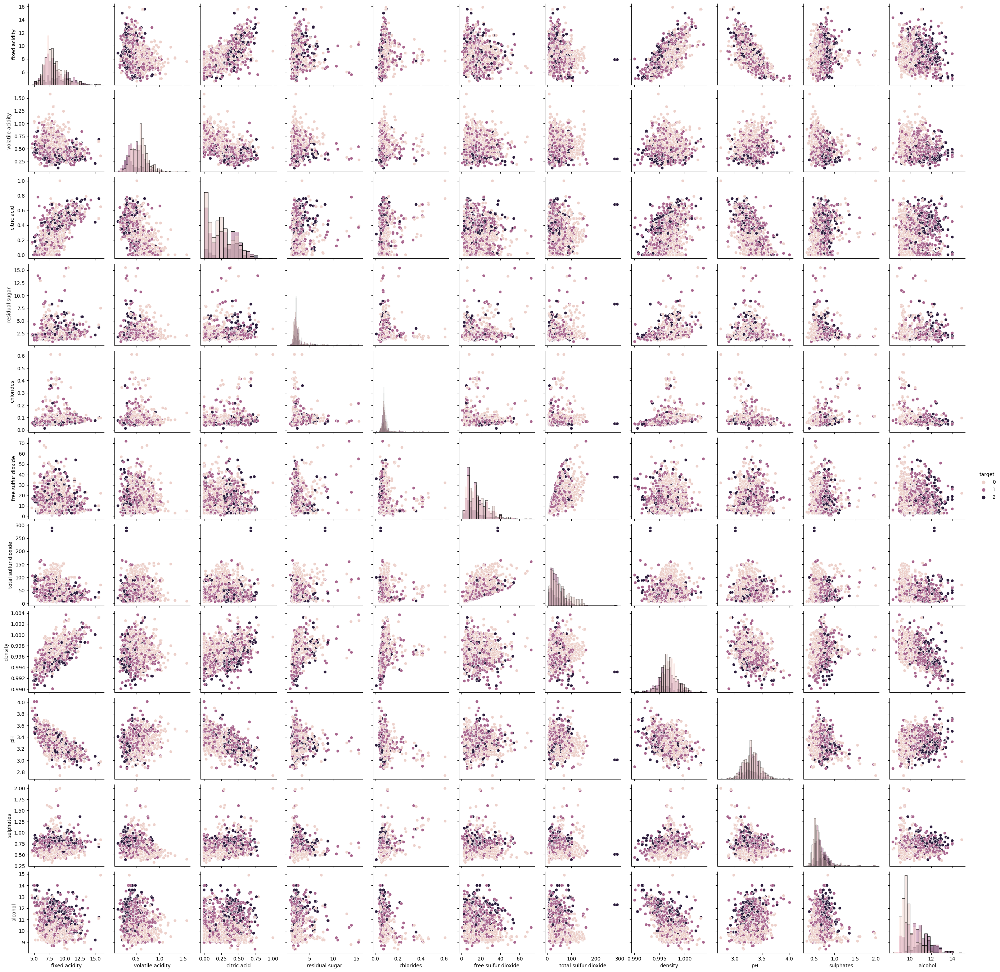

In [18]:
sns.pairplot(dataset, hue="target", diag_kind="hist")

In [19]:
dataset_wine = dataset.drop(['target'],axis=1)

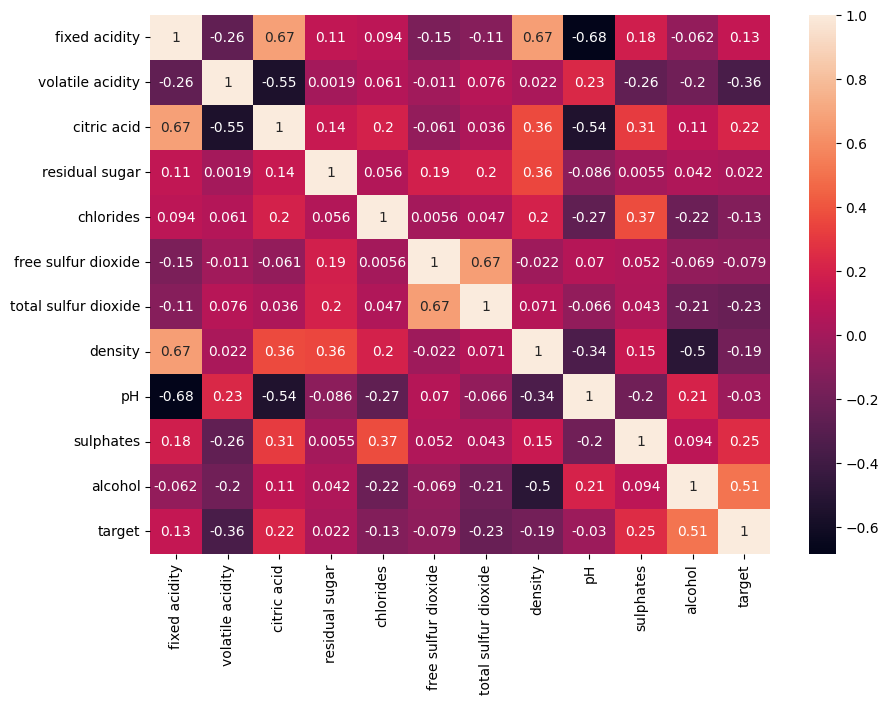

In [20]:
fig , ax = plt.subplots(figsize = (10,7))
sns.heatmap(dataset.corr() , annot = True , ax = ax)
plt.show()

<Axes: xlabel='fixed acidity', ylabel='density'>

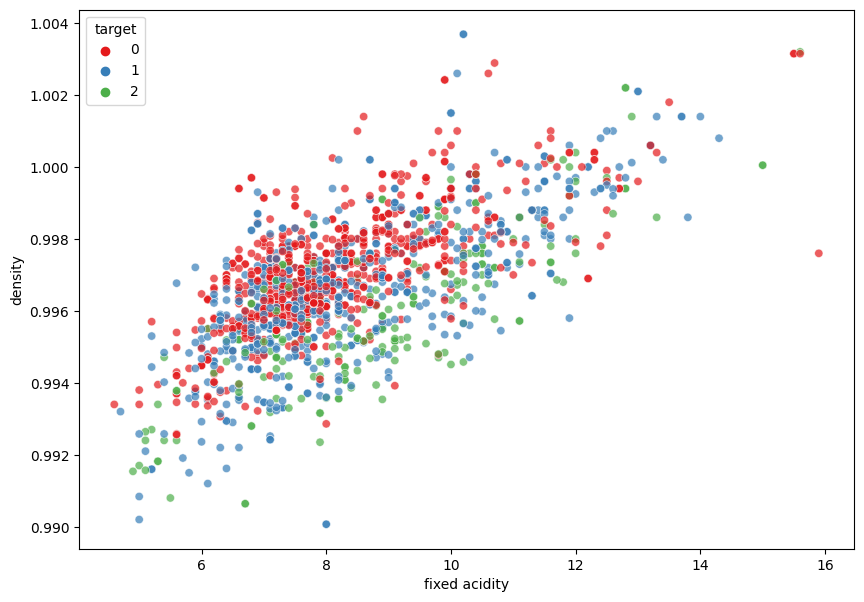

In [21]:
plt.figure(figsize = (10 , 7))
sns.scatterplot(x = "fixed acidity", y = "density", hue = "target",data = dataset, alpha = 0.7, palette = "Set1")

<Axes: xlabel='pH', ylabel='alcohol'>

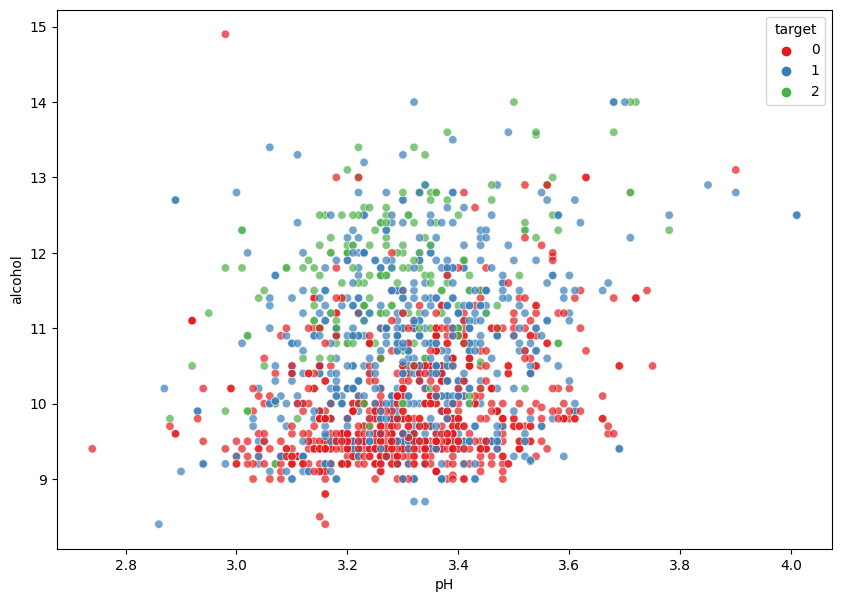

In [22]:
plt.figure(figsize = (10 , 7))
sns.scatterplot(x = "pH", y = "alcohol", hue = "target",data = dataset, alpha = 0.7, palette = "Set1")

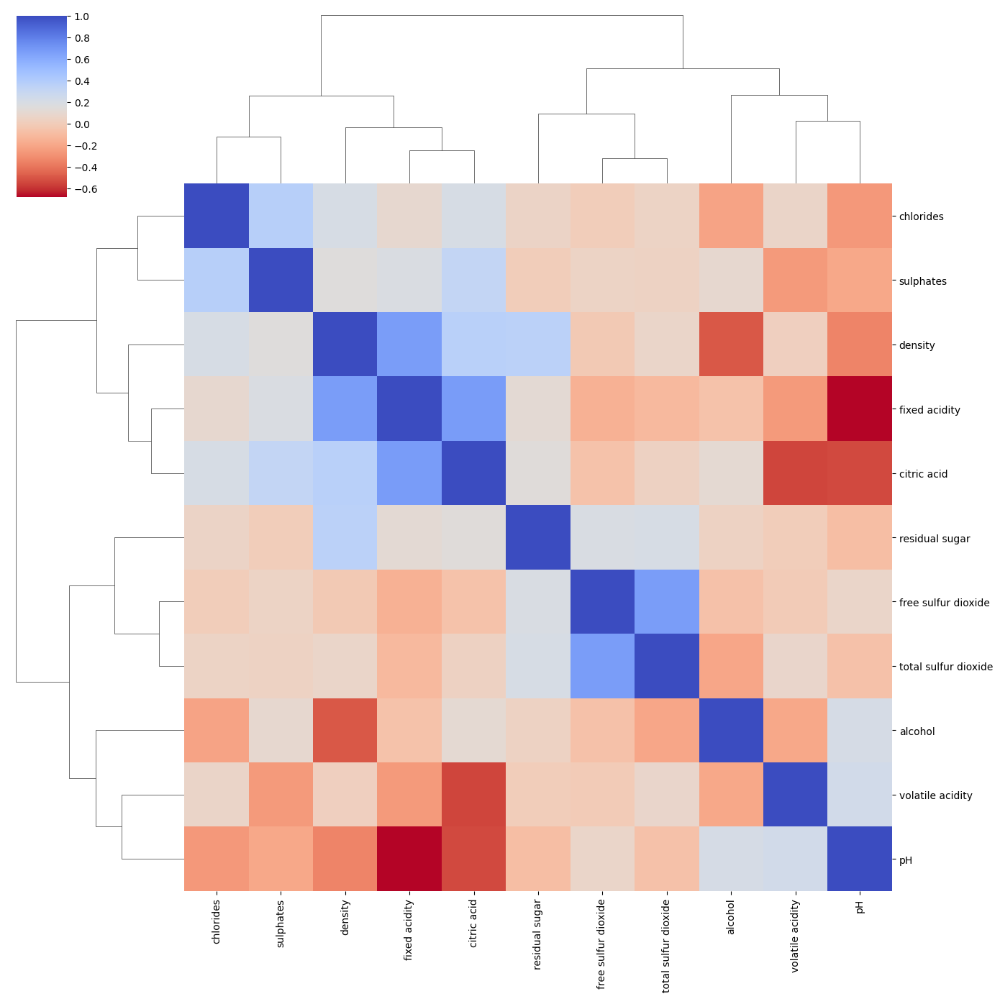

In [23]:
sns.clustermap(dataset_wine.corr(), figsize=(14, 14), method="ward", cmap="coolwarm_r")

<Axes: xlabel='target', ylabel='alcohol'>

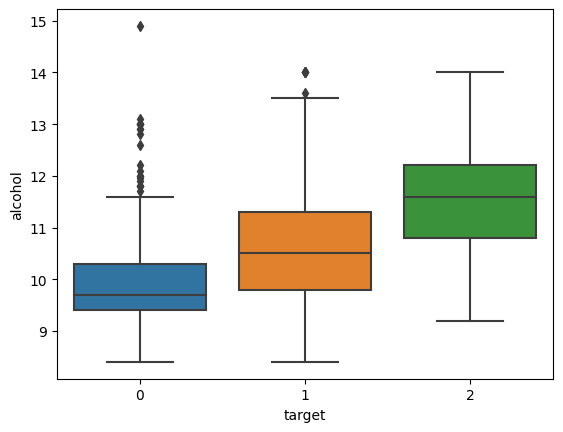

In [24]:
sns.boxplot(x=dataset['target'], y=dataset['alcohol'])

<Axes: xlabel='target', ylabel='volatile acidity'>

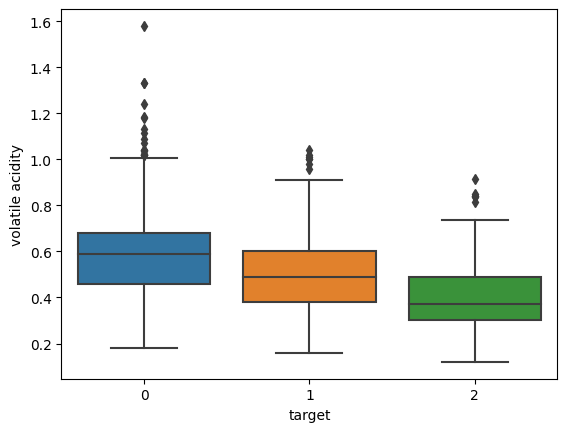

In [25]:
sns.boxplot(x=dataset['target'], y=dataset['volatile acidity'])

<Axes: xlabel='target', ylabel='citric acid'>

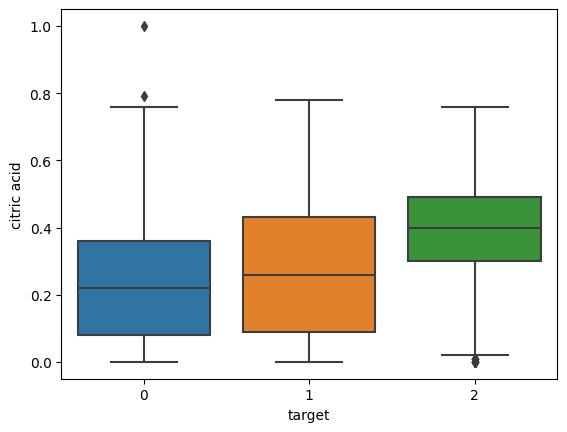

In [26]:
sns.boxplot(x=dataset['target'], y=dataset['citric acid'])

<Axes: xlabel='target', ylabel='sulphates'>

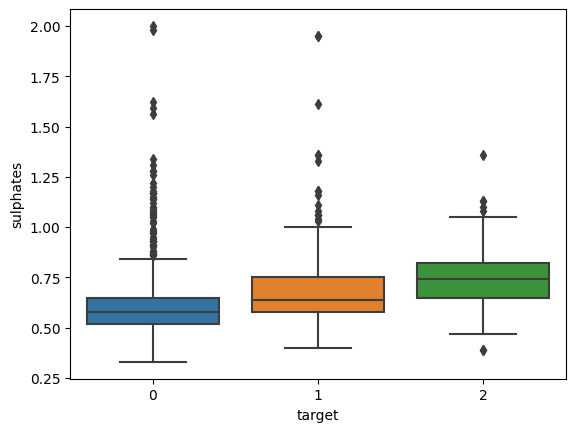

In [27]:
sns.boxplot(x=dataset['target'], y=dataset['sulphates'])

In [28]:
dataset.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'target'],
      dtype='object')

In [29]:
dataset['target'].value_counts()

0    744
1    638
2    217
Name: target, dtype: int64

#### Resposta

A primeira análise feita é a classificação da qualidade do vinho que de acordo com a apresentação do dataset, onde:

Target: 
*   0 - Qualidade Ruim
*   1 - Qualidade Boa
*   2 - Qualidade Ótima


In [30]:
dataset['target'].value_counts()

0    744
1    638
2    217
Name: target, dtype: int64

No mapa de correlação vemos similaridades importantes e principalmente correlação a algumas colunas e principalmente entre a quantidade de alcool, sulphates e ácido citrico e temos o ácido volatil onde podemos ver pouca correlação entre a qualidade.
Outra análise possivel de ser feita é a forte correlação ácido citrico e ácido fixo e pouca relação entre a densidade do vinho e a quantidade de álcool.

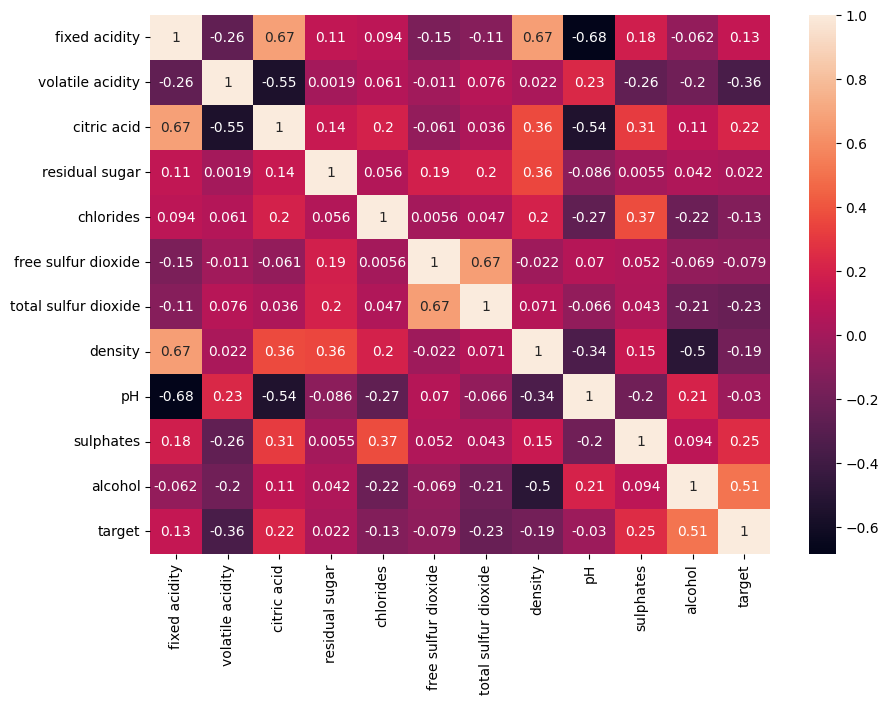

In [31]:
fig , ax = plt.subplots(figsize = (10,7))
sns.heatmap(dataset.corr() , annot = True , ax = ax)
plt.show()

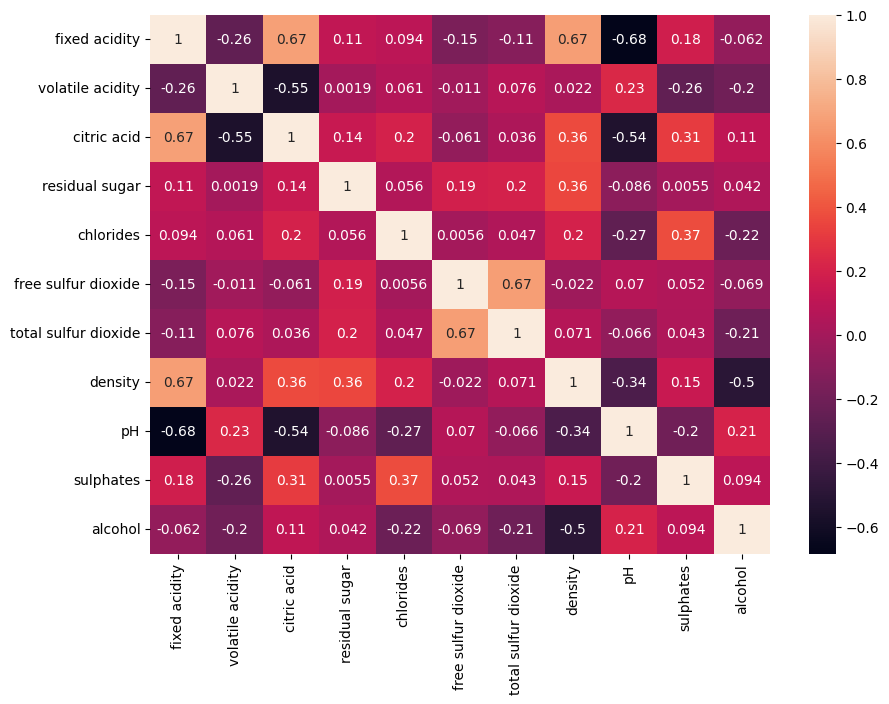

In [32]:
fig , ax = plt.subplots(figsize = (10,7))
sns.heatmap(dataset_wine.corr() , annot = True , ax = ax)
plt.show()

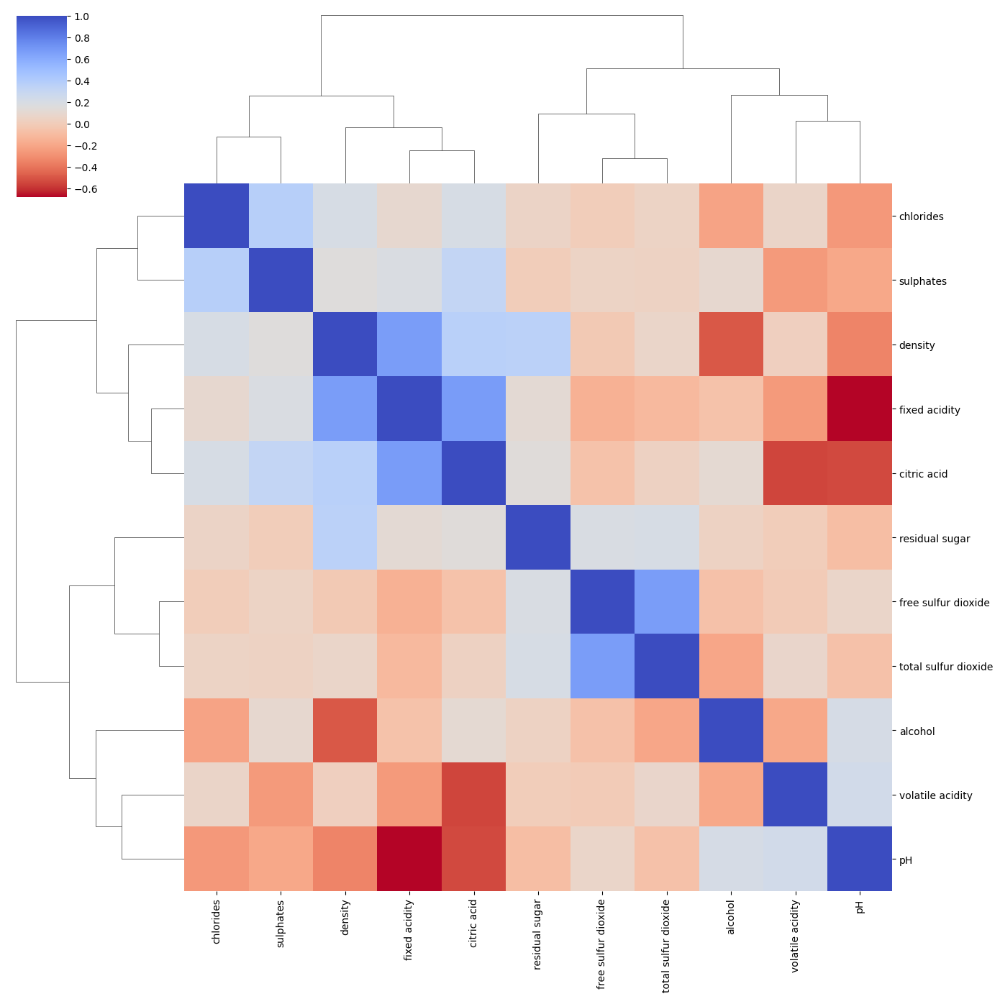

In [33]:
sns.clustermap(dataset_wine.corr(), figsize=(14, 14), method="ward", cmap="coolwarm_r")

Quando há forte correlação entre as colunas podemos ver que é mais fácil a separação entre as qualidades dos vinhos e  quando há pouca correlação essa separação é feita de maneira mais dificil entre os dados

<Axes: xlabel='alcohol', ylabel='density'>

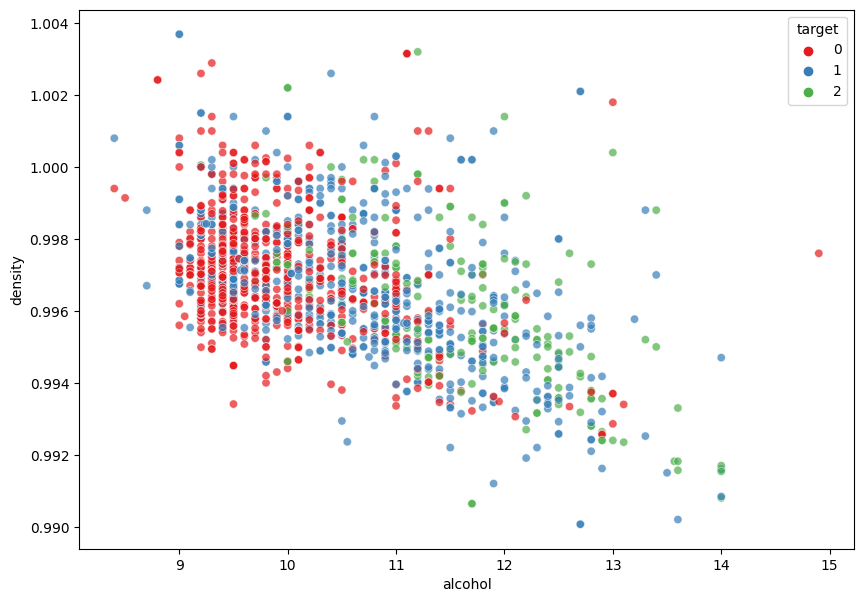

In [34]:
plt.figure(figsize = (10 , 7))
sns.scatterplot(x = "alcohol", y = "density", hue = "target",data = dataset, alpha = 0.7, palette = "Set1")

<Axes: xlabel='alcohol', ylabel='sulphates'>

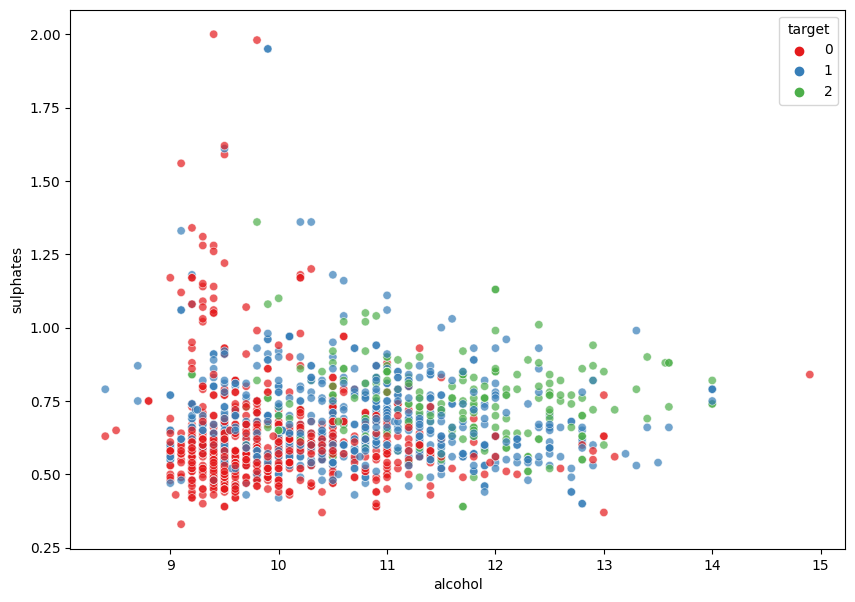

In [35]:
plt.figure(figsize = (10 , 7))
sns.scatterplot(x = "alcohol", y = "sulphates", hue = "target",data = dataset, alpha = 0.7, palette = "Set1")

<Axes: xlabel='fixed acidity', ylabel='citric acid'>

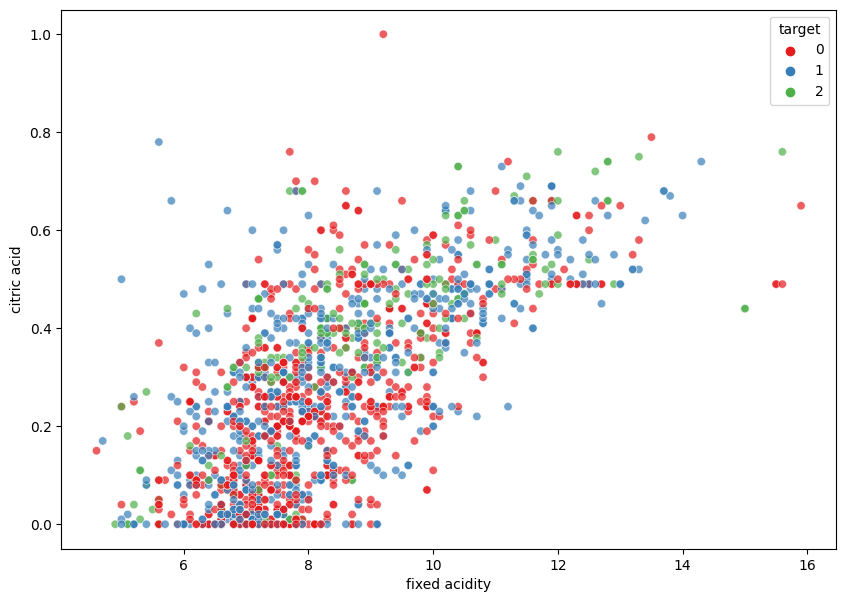

In [36]:
plt.figure(figsize = (10 , 7))
sns.scatterplot(x = "fixed acidity", y = "citric acid", hue = "target",data = dataset, alpha = 0.7, palette = "Set1")

*   Quanto mais alcool em média maior é a qualidade do vinho mas caso há um exagero a qualidade do vinho não passa a ser tão boa 
*   Quanto menor o ácido volátil melhor é a qualidade do vinho, pesquisando posteriormente pude ver que o ácido volatil é o responsável pela criação do azeite
*   O ácido citrico o quanto maior , melhor é a qualidade do vin ho
*   Quanto maior o sulfato melhor a qualidade do vinho entretanto quando é exagerado o sulfato passa a ser ruim
*   No PH podemos achar pouca resolução para a verificação da qualidade do vinho

<Axes: xlabel='target', ylabel='alcohol'>

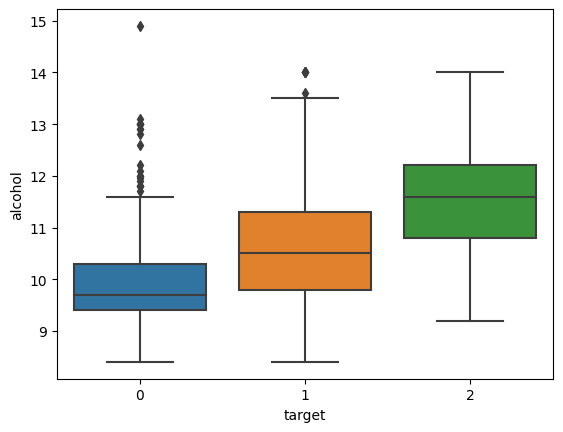

In [37]:
sns.boxplot(x=dataset['target'], y=dataset['alcohol'])

<Axes: xlabel='target', ylabel='volatile acidity'>

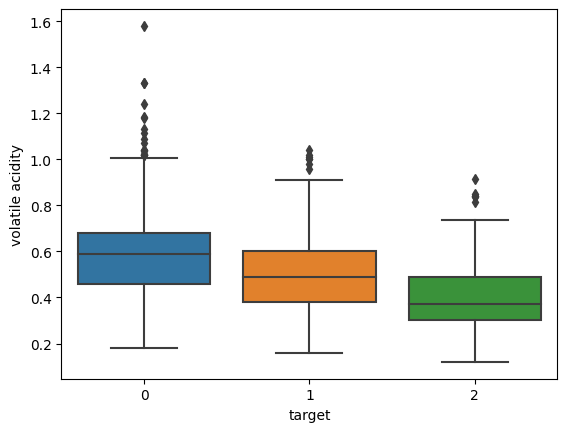

In [38]:
sns.boxplot(x=dataset['target'], y=dataset['volatile acidity'])

<Axes: xlabel='target', ylabel='citric acid'>

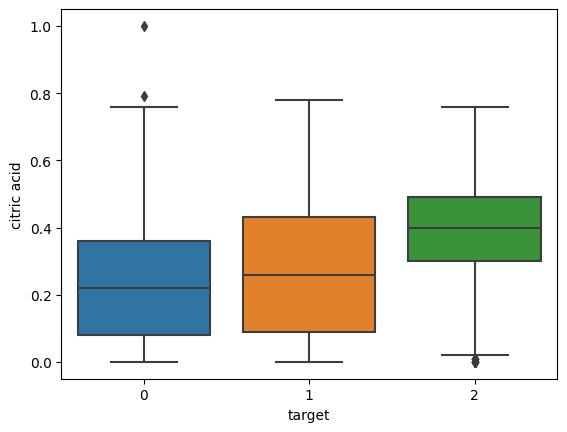

In [39]:
sns.boxplot(x=dataset['target'], y=dataset['citric acid'])

<Axes: xlabel='target', ylabel='sulphates'>

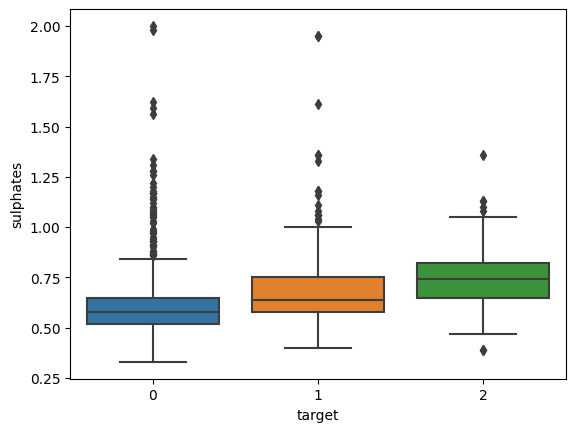

In [40]:
sns.boxplot(x=dataset['target'], y=dataset['sulphates'])

<Axes: xlabel='target', ylabel='pH'>

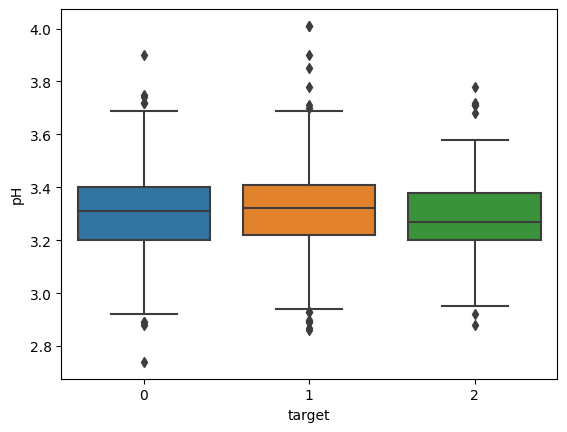

In [41]:
sns.boxplot(x=dataset['target'], y=dataset['pH'])

## Parte II. Treinamento do modelo de Rede Neural - Baseline 

Total: 1,0 pts.

### 1)	Com as configurações do modelo MLP previamente definidas no script, faça o treinamento da Rede Neural sem normalizar os atributos numéricos. Comente o resultado obtido, baseado nas métricas de avaliação disponíveis (acurácia, precision, recall, F1-Score, Matriz de confusão, etc.)

#### Rascunho

In [42]:
new_df = transform_data(dataset, normalize=False)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0


In [43]:
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0


In [44]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

if np.unique(y).shape[0] <= 2:
  print('Binary classification')
  n_output = 1
  binary = True
else:
  print('Multiclass classification')
  n_output = len(encoder.classes_)
  binary = False
  #y = np.eye(n_output)[y]

Multiclass classification


In [45]:
batch_size = 32 
epochs = 170

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

In [47]:
#Para o caso binário
if binary:
    train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).float().unsqueeze(1))
    val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).float().unsqueeze(1))
    test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).float().unsqueeze(1))
else:
    train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
    val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
    test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

In [48]:
train_dataset.X_data

tensor([[ 7.7000,  0.5800,  0.1000,  ...,  3.0800,  0.4900,  9.8000],
        [11.9000,  0.3800,  0.4900,  ...,  3.1600,  0.6100, 10.3000],
        [ 9.8000,  0.5000,  0.4900,  ...,  3.3100,  0.7900, 10.7000],
        ...,
        [12.8000,  0.3000,  0.7400,  ...,  3.2000,  0.7700, 10.8000],
        [ 7.5000,  0.6850,  0.0700,  ...,  3.3800,  0.5500, 10.9000],
        [ 6.5000,  0.6150,  0.0000,  ...,  3.4600,  0.6500,  9.2000]])

In [49]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')

In [50]:
lr = 0.01
epochs = 250

history, y_hat = train(model, train_loader, val_dataset, epochs=epochs, lr=lr, device=device, binary=binary)

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.146 | Val Loss: 1.0875 | Train Acc: 41.3750| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.100 | Val Loss: 1.0568 | Train Acc: 44.5625| Val Acc: 55.0000
Epoch 003: | Train Loss: 1.078 | Val Loss: 1.0323 | Train Acc: 47.8125| Val Acc: 59.0000
Epoch 004: | Train Loss: 1.059 | Val Loss: 1.0108 | Train Acc: 49.2500| Val Acc: 59.0000
Epoch 005: | Train Loss: 1.040 | Val Loss: 0.9939 | Train Acc: 50.9062| Val Acc: 58.0000
Epoch 006: | Train Loss: 1.027 | Val Loss: 0.9819 | Train Acc: 50.2188| Val Acc: 56.0000
Epoch 007: | Train Loss: 1.017 | Val Loss: 0.9727 | Train Acc: 50.5625| Val Acc: 58.0000
Epoch 008: | Train Loss: 1.010 | Val Loss: 0.9662 | Train Acc: 50.5938| Val Acc: 59.0000
Epoch 009: | Train Loss: 1.005 | Val Loss: 0.9612 | Train Acc: 50.3750| Val Acc: 58.0000
Epoch 010: | Train Loss: 1.002 | Val Loss: 0.9574 | Train Acc: 50.5938| Val Acc: 57.0000
Epoch 011: | Train Loss: 1.000 | Val Loss: 0.9547 | Train Acc: 50.5000| Val Acc: 58.0000
Epoch 012: | Train Lo

In [51]:
y_pred = model.predict(test_dataset.X_data, binary=binary)

              precision    recall  f1-score   support

           0       0.60      0.70      0.65       141
           1       0.46      0.54      0.50       132
           2       0.40      0.04      0.08        47

    accuracy                           0.53       320
   macro avg       0.49      0.43      0.41       320
weighted avg       0.52      0.53      0.50       320



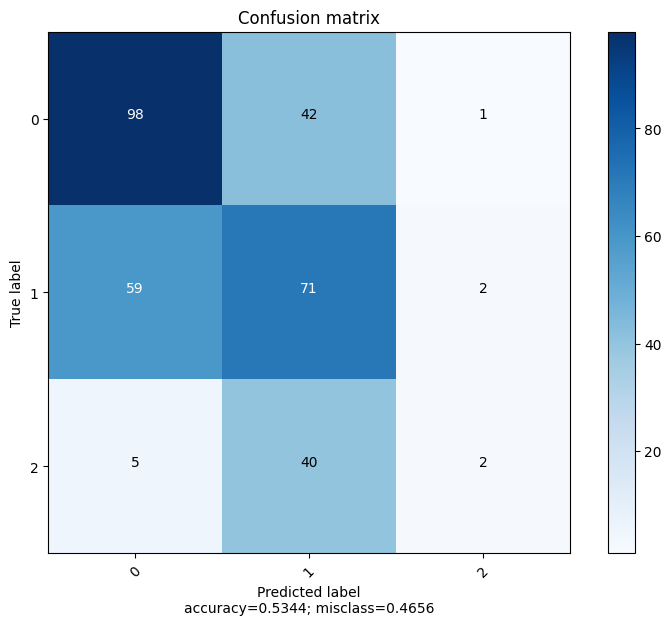

In [52]:
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(cm)

In [53]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [54]:
accuracy_score(y_test, y_pred)

0.534375

In [55]:
recall_score(y_test, y_pred, average='macro')

0.42515581345368586

In [56]:
precision_score(y_test, y_pred, average='macro')

0.4896635197288792

In [57]:
f1_score(y_test, y_pred, average='macro')

0.4073444591422705

#### Resposta

A principio foi feita a mudança dos datasets sem normalizar os dados de entrada.

In [58]:
new_df = transform_data(dataset, normalize=False)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0


*   Como no dataset é utilizada uma multiclassificação de dados foi selecionado o código abaixo para ser feito os itens da classificação.
*   A principio foi selecionado o valor de batch como 32 e foram utilizadas 200 épocas para serem testados
*   Em seguida foi dividida a base de dados com 20% para os testes da base de dados



In [59]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]
n_output = len(encoder.classes_)
binary = False

In [60]:
batch_size = 32 

In [530]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

In [531]:
train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)


*   Nesse momento os dados foram treinados em 250 épocas para que tenhamos o melhor resultado possivel para os dados não normalizados colocados em questão



In [63]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')

In [64]:
epochs = 250

history, y_hat = train(model, train_loader, val_dataset, epochs=epochs, lr=lr, device=device, binary=binary)

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.130 | Val Loss: 1.1042 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 002: | Train Loss: 1.077 | Val Loss: 1.0834 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 003: | Train Loss: 1.063 | Val Loss: 1.0658 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 004: | Train Loss: 1.052 | Val Loss: 1.0510 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 005: | Train Loss: 1.043 | Val Loss: 1.0385 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 006: | Train Loss: 1.035 | Val Loss: 1.0278 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 007: | Train Loss: 1.029 | Val Loss: 1.0187 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 008: | Train Loss: 1.024 | Val Loss: 1.0110 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 009: | Train Loss: 1.020 | Val Loss: 1.0043 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 010: | Train Loss: 1.016 | Val Loss: 0.9987 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 011: | Train Loss: 1.013 | Val Loss: 0.9939 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 012: | Train Lo

In [65]:
y_pred = model.predict(test_dataset.X_data, binary=binary)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.44      0.99      0.61       141
           1       0.50      0.01      0.01       132
           2       0.00      0.00      0.00        47

    accuracy                           0.44       320
   macro avg       0.31      0.33      0.21       320
weighted avg       0.40      0.44      0.27       320



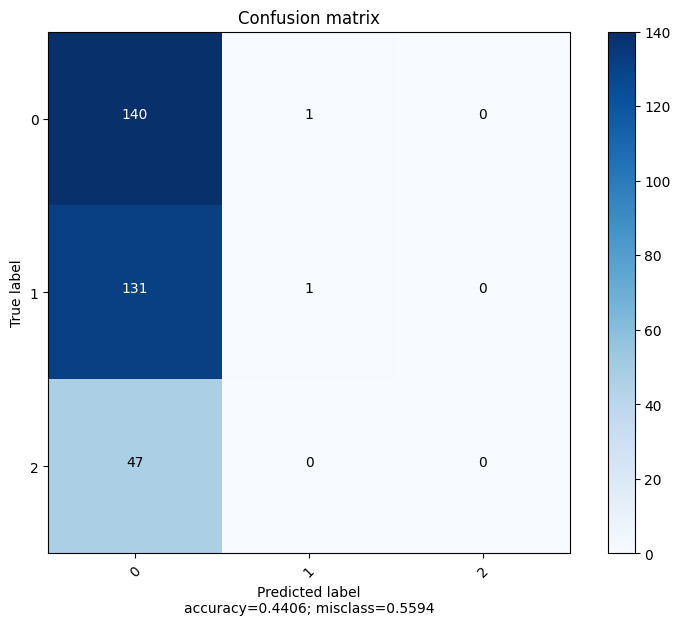

In [66]:
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(cm)

*   Considerando que uma acurácia ruim em uma situação de multi-classificacão como a citada no dataset seria 33% , a acurácia feita pelo modelo ficou bastante próximo chegando a no máximo em 52,5%
*   A Precisão também foi bem abaixo não deixando muita assertividade no modelo testado chegando a no máximo 52%
*   O Recall chegou a no máximo 53% fazendo com que a assertividade do modelo destacado seja bem falho em relação aos esperado pelo modelo
*   F1-Score é a média harmonica de Recall e precisão e portanto o valor encontrado foi bastante ruim assim como o destacado na precisão e no recall




## Parte III - Mudança de configurações do modelo

Total: 5,0 pts.

### 1)	Agora normalize os dados de entrada e treine novamente o modelo MLP. Avalie os resultados obtidos e comente o efeito da normalização no treinamento da Rede Neural.

#### Rascunho

In [67]:
new_df = transform_data(dataset, normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [68]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

if np.unique(y).shape[0] <= 2:
  print('Binary classification')
  n_output = 1

else:
  print('Multiclass classification')
  #y = to_categorical(y)
  n_output = encoder.classes_.shape[0]


X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

Multiclass classification


In [69]:
if binary:
    train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).float().unsqueeze(1))
    val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).float().unsqueeze(1))
    test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).float().unsqueeze(1))
else:
    train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
    val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
    test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

In [70]:
lr = 0.75
epochs=500

In [71]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')
history, y_hat = train(model, train_loader, val_dataset, epochs=epochs, lr=lr, device=device, binary=binary)

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.007 | Val Loss: 0.9588 | Train Acc: 45.9062| Val Acc: 55.0000
Epoch 002: | Train Loss: 0.967 | Val Loss: 0.8920 | Train Acc: 51.8750| Val Acc: 57.0000
Epoch 003: | Train Loss: 0.890 | Val Loss: 0.8228 | Train Acc: 54.2812| Val Acc: 61.0000
Epoch 004: | Train Loss: 0.855 | Val Loss: 0.7984 | Train Acc: 55.1250| Val Acc: 64.0000
Epoch 005: | Train Loss: 0.839 | Val Loss: 0.7899 | Train Acc: 57.4062| Val Acc: 66.0000
Epoch 006: | Train Loss: 0.825 | Val Loss: 0.7854 | Train Acc: 57.8125| Val Acc: 67.0000
Epoch 007: | Train Loss: 0.816 | Val Loss: 0.7852 | Train Acc: 58.0000| Val Acc: 68.0000
Epoch 008: | Train Loss: 0.807 | Val Loss: 0.7845 | Train Acc: 60.1562| Val Acc: 68.0000
Epoch 009: | Train Loss: 0.803 | Val Loss: 0.7833 | Train Acc: 60.8750| Val Acc: 67.0000
Epoch 010: | Train Loss: 0.796 | Val Loss: 0.7834 | Train Acc: 61.7812| Val Acc: 68.0000
Epoch 011: | Train Loss: 0.794 | Val Loss: 0.7835 | Train Acc: 62.0625| Val Acc: 68.0000
Epoch 012: | Train Lo

In [72]:
y_pred = model.predict(test_dataset.X_data,binary=binary)

              precision    recall  f1-score   support

           0       0.74      0.72      0.73       141
           1       0.56      0.71      0.62       132
           2       0.73      0.23      0.35        47

    accuracy                           0.64       320
   macro avg       0.68      0.55      0.57       320
weighted avg       0.66      0.64      0.63       320



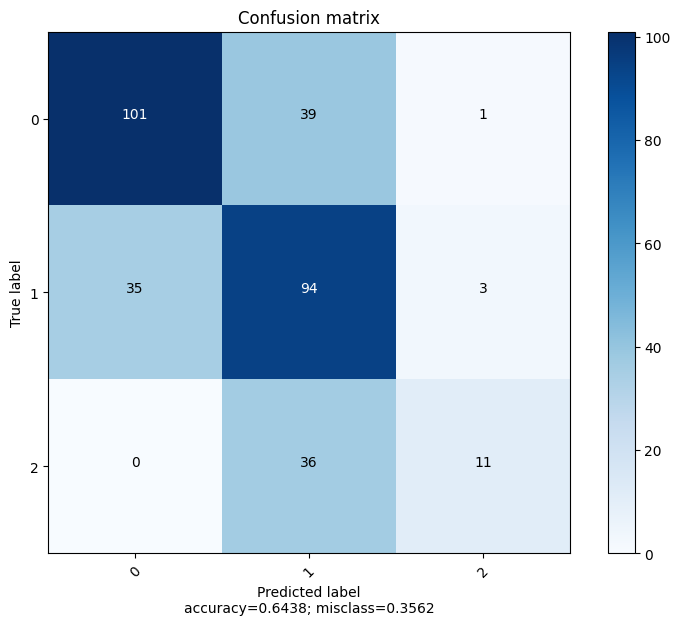

In [73]:
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(cm)

#### Resposta

Foi feita a transformação dos dados com a normalização da base conforme solicitado

In [74]:
new_df = transform_data(dataset, normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


Em seguida foi feita a classificação e divisão da base de dados conforme solicitado

In [480]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

print('Multiclass classification')
n_output = encoder.classes_.shape[0]

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

Multiclass classification


In [481]:
train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

Foram feitos diversos testes para a modificação do LR e das épocas com o intuito de obter o melhor resultado da assertividade dos dados

In [77]:
lr = 0.75
epochs=500

In [457]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')
history, y_hat = train(model, train_loader, val_dataset, epochs=epochs, lr=lr, device=device, binary=binary)

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.080 | Val Loss: 1.0644 | Train Acc: 40.4062| Val Acc: 38.0000
Epoch 002: | Train Loss: 1.058 | Val Loss: 1.0404 | Train Acc: 41.0938| Val Acc: 41.0000
Epoch 003: | Train Loss: 1.042 | Val Loss: 1.0221 | Train Acc: 41.4375| Val Acc: 43.0000
Epoch 004: | Train Loss: 1.031 | Val Loss: 1.0081 | Train Acc: 41.9375| Val Acc: 48.0000
Epoch 005: | Train Loss: 1.022 | Val Loss: 0.9975 | Train Acc: 47.5000| Val Acc: 54.0000
Epoch 006: | Train Loss: 1.016 | Val Loss: 0.9894 | Train Acc: 50.0625| Val Acc: 58.0000
Epoch 007: | Train Loss: 1.012 | Val Loss: 0.9832 | Train Acc: 50.2188| Val Acc: 59.0000
Epoch 008: | Train Loss: 1.009 | Val Loss: 0.9784 | Train Acc: 49.2500| Val Acc: 58.0000
Epoch 009: | Train Loss: 1.007 | Val Loss: 0.9746 | Train Acc: 47.9688| Val Acc: 58.0000
Epoch 010: | Train Loss: 1.005 | Val Loss: 0.9717 | Train Acc: 47.9062| Val Acc: 57.0000
Epoch 011: | Train Loss: 1.004 | Val Loss: 0.9693 | Train Acc: 47.6250| Val Acc: 56.0000
Epoch 012: | Train Lo

In [79]:
y_pred = model.predict(test_dataset.X_data,binary=binary)

              precision    recall  f1-score   support

           0       0.70      0.77      0.73       141
           1       0.53      0.61      0.57       132
           2       0.50      0.15      0.23        47

    accuracy                           0.61       320
   macro avg       0.58      0.51      0.51       320
weighted avg       0.60      0.61      0.59       320



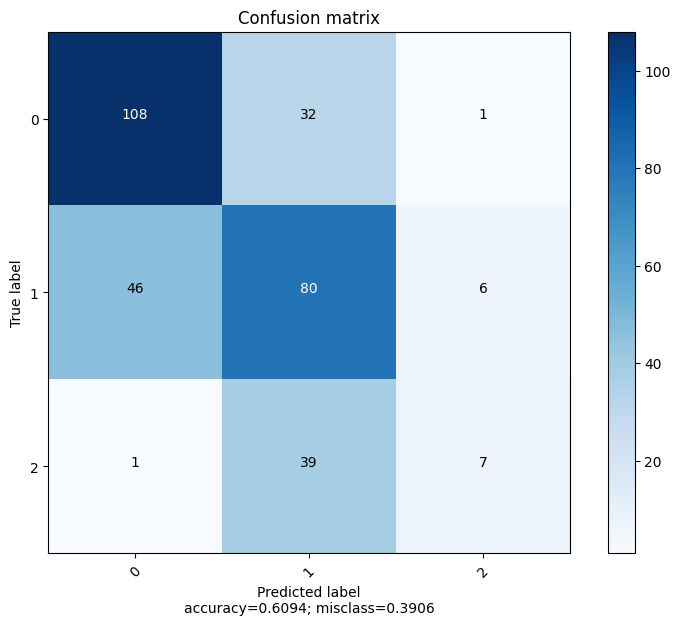

In [80]:
  print(classification_report(y_test, y_pred))

  cm = confusion_matrix(y_test, y_pred)

  plot_confusion_matrix(cm)

Com os dados normalizados obtemos os seguintes resultados
*   Acurácia: 61% (Sem Normalização: 44%)
*   Precisão : 60% (Sem Normalização: 40%)
*   Recall : 61% (Sem Normalização: 44%)
*   F1-Score : 59% (Sem Normalização: 27%)

Obteve-se  dados com uma melhoria com cerca de 15 a 20% melhor que os dados sem estarem normalizados, portanto a normalização demonstra ser eficiente e útil na assertividade dos dados

### 2)	Modifique o tempo de treinamento (épocas) da Rede Neural. Escolha valores distintos (e.g. 1 e 1000 épocas) e avalie os resultados.

#### Rascunho

In [81]:
new_df = transform_data(dataset, normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [82]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

print('Multiclass classification')
n_output = encoder.classes_.shape[0]

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

Multiclass classification


In [83]:
train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

In [84]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')

In [161]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

In [86]:
epochs = [1,10,25,50,75,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
#epochs = [1,10]
accuracy = []
precision = []
f1score = []
recall = []
#lr = 0.7
for x in range(0,len(epochs)):
  history, y_hat = train(model, train_loader, val_dataset, epochs=epochs[x], lr=lr, device=device, binary=binary)
  y_pred = model.predict(test_dataset.X_data,binary=binary)
  accuracy.append(accuracy_score(y_test, y_pred))
  precision.append(precision_score(y_test, y_pred,average='weighted'))
  f1score.append(f1_score(y_test, y_pred,average='weighted'))
  recall.append(recall_score(y_test, y_pred,average='weighted'))

resultado = dict(epoch = epochs,
                   accuracy = accuracy,
                   precision = precision,
                   f1score = f1score,
                   recall = recall)
resultado_df = pd.DataFrame(data=resultado)
  

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.990 | Val Loss: 0.9204 | Train Acc: 48.3438| Val Acc: 57.0000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.919 | Val Loss: 0.8424 | Train Acc: 53.5312| Val Acc: 60.0000
Epoch 002: | Train Loss: 0.860 | Val Loss: 0.8174 | Train Acc: 55.0312| Val Acc: 63.0000
Epoch 003: | Train Loss: 0.840 | Val Loss: 0.7978 | Train Acc: 57.0000| Val Acc: 66.0000
Epoch 004: | Train Loss: 0.825 | Val Loss: 0.7943 | Train Acc: 59.2812| Val Acc: 67.0000
Epoch 005: | Train Loss: 0.816 | Val Loss: 0.7902 | Train Acc: 59.5938| Val Acc: 67.0000
Epoch 006: | Train Loss: 0.809 | Val Loss: 0.7894 | Train Acc: 59.9062| Val Acc: 66.0000
Epoch 007: | Train Loss: 0.807 | Val Loss: 0.7839 | Train Acc: 60.0312| Val Acc: 67.0000
Epoch 008: | Train Loss: 0.800 | Val Loss: 0.7861 | Train Acc: 59.8750| Val Acc: 67.0000
Epoch 009: | Train Loss: 0.795 | Val Loss: 0.7857 | Train Acc: 61.1250| Val Acc: 66.0000
Epoch 010: | Train Loss: 0.794 | Val Loss: 0.7870 | Train Acc: 61.3125| Val Acc: 65.0000


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.789 | Val Loss: 0.7897 | Train Acc: 62.1562| Val Acc: 66.0000
Epoch 002: | Train Loss: 0.787 | Val Loss: 0.7886 | Train Acc: 61.8125| Val Acc: 66.0000
Epoch 003: | Train Loss: 0.788 | Val Loss: 0.7898 | Train Acc: 61.9062| Val Acc: 66.0000
Epoch 004: | Train Loss: 0.787 | Val Loss: 0.7917 | Train Acc: 61.9375| Val Acc: 66.0000
Epoch 005: | Train Loss: 0.786 | Val Loss: 0.7925 | Train Acc: 62.0312| Val Acc: 66.0000
Epoch 006: | Train Loss: 0.784 | Val Loss: 0.7944 | Train Acc: 61.9688| Val Acc: 66.0000
Epoch 007: | Train Loss: 0.784 | Val Loss: 0.7960 | Train Acc: 61.5000| Val Acc: 67.0000
Epoch 008: | Train Loss: 0.784 | Val Loss: 0.7929 | Train Acc: 61.6562| Val Acc: 66.0000
Epoch 009: | Train Loss: 0.783 | Val Loss: 0.7935 | Train Acc: 61.0625| Val Acc: 65.0000
Epoch 010: | Train Loss: 0.782 | Val Loss: 0.7945 | Train Acc: 61.6875| Val Acc: 66.0000
Epoch 011: | Train Loss: 0.782 | Val Loss: 0.7978 | Train Acc: 61.6250| Val Acc: 67.0000
Epoch 012: | Train Lo

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.772 | Val Loss: 0.8093 | Train Acc: 63.5000| Val Acc: 68.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8101 | Train Acc: 63.3125| Val Acc: 68.0000
Epoch 003: | Train Loss: 0.770 | Val Loss: 0.8083 | Train Acc: 63.0000| Val Acc: 68.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8105 | Train Acc: 63.1250| Val Acc: 67.0000
Epoch 005: | Train Loss: 0.770 | Val Loss: 0.8136 | Train Acc: 62.6250| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.770 | Val Loss: 0.8097 | Train Acc: 63.0312| Val Acc: 68.0000
Epoch 007: | Train Loss: 0.770 | Val Loss: 0.8102 | Train Acc: 62.9062| Val Acc: 68.0000
Epoch 008: | Train Loss: 0.769 | Val Loss: 0.8136 | Train Acc: 63.3125| Val Acc: 68.0000
Epoch 009: | Train Loss: 0.768 | Val Loss: 0.8144 | Train Acc: 63.0000| Val Acc: 68.0000
Epoch 010: | Train Loss: 0.768 | Val Loss: 0.8112 | Train Acc: 63.0625| Val Acc: 68.0000
Epoch 011: | Train Loss: 0.767 | Val Loss: 0.8131 | Train Acc: 63.0312| Val Acc: 68.0000
Epoch 012: | Train Lo

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.750 | Val Loss: 0.8101 | Train Acc: 65.1250| Val Acc: 68.0000
Epoch 002: | Train Loss: 0.749 | Val Loss: 0.8153 | Train Acc: 65.5625| Val Acc: 67.0000
Epoch 003: | Train Loss: 0.749 | Val Loss: 0.8156 | Train Acc: 65.5312| Val Acc: 68.0000
Epoch 004: | Train Loss: 0.748 | Val Loss: 0.8198 | Train Acc: 65.4375| Val Acc: 68.0000
Epoch 005: | Train Loss: 0.747 | Val Loss: 0.8173 | Train Acc: 65.3438| Val Acc: 68.0000
Epoch 006: | Train Loss: 0.747 | Val Loss: 0.8155 | Train Acc: 65.1250| Val Acc: 66.0000
Epoch 007: | Train Loss: 0.747 | Val Loss: 0.8197 | Train Acc: 65.5000| Val Acc: 68.0000
Epoch 008: | Train Loss: 0.746 | Val Loss: 0.8161 | Train Acc: 65.2812| Val Acc: 67.0000
Epoch 009: | Train Loss: 0.745 | Val Loss: 0.8160 | Train Acc: 65.9062| Val Acc: 66.0000
Epoch 010: | Train Loss: 0.744 | Val Loss: 0.8284 | Train Acc: 65.8125| Val Acc: 66.0000
Epoch 011: | Train Loss: 0.745 | Val Loss: 0.8200 | Train Acc: 65.0312| Val Acc: 67.0000
Epoch 012: | Train Lo

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.736 | Val Loss: 0.8535 | Train Acc: 65.9062| Val Acc: 65.0000
Epoch 002: | Train Loss: 0.737 | Val Loss: 0.8552 | Train Acc: 65.9062| Val Acc: 64.0000
Epoch 003: | Train Loss: 0.736 | Val Loss: 0.8622 | Train Acc: 65.7188| Val Acc: 64.0000
Epoch 004: | Train Loss: 0.736 | Val Loss: 0.8554 | Train Acc: 65.6250| Val Acc: 64.0000
Epoch 005: | Train Loss: 0.736 | Val Loss: 0.8614 | Train Acc: 66.2188| Val Acc: 64.0000
Epoch 006: | Train Loss: 0.736 | Val Loss: 0.8553 | Train Acc: 65.9375| Val Acc: 64.0000
Epoch 007: | Train Loss: 0.736 | Val Loss: 0.8595 | Train Acc: 65.5938| Val Acc: 65.0000
Epoch 008: | Train Loss: 0.736 | Val Loss: 0.8621 | Train Acc: 65.9062| Val Acc: 64.0000
Epoch 009: | Train Loss: 0.735 | Val Loss: 0.8460 | Train Acc: 65.6875| Val Acc: 66.0000
Epoch 010: | Train Loss: 0.735 | Val Loss: 0.8614 | Train Acc: 65.5312| Val Acc: 64.0000
Epoch 011: | Train Loss: 0.734 | Val Loss: 0.8561 | Train Acc: 65.5938| Val Acc: 64.0000
Epoch 012: | Train Lo

  0%|          | 0/150 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.727 | Val Loss: 0.8555 | Train Acc: 66.1250| Val Acc: 65.0000
Epoch 002: | Train Loss: 0.727 | Val Loss: 0.8586 | Train Acc: 66.3750| Val Acc: 65.0000
Epoch 003: | Train Loss: 0.727 | Val Loss: 0.8567 | Train Acc: 66.5000| Val Acc: 64.0000
Epoch 004: | Train Loss: 0.728 | Val Loss: 0.8575 | Train Acc: 66.5938| Val Acc: 63.0000
Epoch 005: | Train Loss: 0.728 | Val Loss: 0.8566 | Train Acc: 66.2188| Val Acc: 64.0000
Epoch 006: | Train Loss: 0.727 | Val Loss: 0.8588 | Train Acc: 66.5000| Val Acc: 65.0000
Epoch 007: | Train Loss: 0.727 | Val Loss: 0.8575 | Train Acc: 66.7812| Val Acc: 65.0000
Epoch 008: | Train Loss: 0.727 | Val Loss: 0.8587 | Train Acc: 66.2812| Val Acc: 65.0000
Epoch 009: | Train Loss: 0.727 | Val Loss: 0.8555 | Train Acc: 66.6875| Val Acc: 64.0000
Epoch 010: | Train Loss: 0.727 | Val Loss: 0.8572 | Train Acc: 66.4062| Val Acc: 63.0000
Epoch 011: | Train Loss: 0.728 | Val Loss: 0.8560 | Train Acc: 66.4062| Val Acc: 64.0000
Epoch 012: | Train Lo

  0%|          | 0/200 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.726 | Val Loss: 0.8725 | Train Acc: 66.1875| Val Acc: 63.0000
Epoch 002: | Train Loss: 0.726 | Val Loss: 0.8677 | Train Acc: 66.2500| Val Acc: 63.0000
Epoch 003: | Train Loss: 0.725 | Val Loss: 0.8662 | Train Acc: 66.0312| Val Acc: 64.0000
Epoch 004: | Train Loss: 0.726 | Val Loss: 0.8744 | Train Acc: 66.0000| Val Acc: 63.0000
Epoch 005: | Train Loss: 0.725 | Val Loss: 0.8725 | Train Acc: 66.0938| Val Acc: 63.0000
Epoch 006: | Train Loss: 0.725 | Val Loss: 0.8736 | Train Acc: 66.3125| Val Acc: 63.0000
Epoch 007: | Train Loss: 0.726 | Val Loss: 0.8738 | Train Acc: 66.2812| Val Acc: 63.0000
Epoch 008: | Train Loss: 0.726 | Val Loss: 0.8734 | Train Acc: 66.1875| Val Acc: 63.0000
Epoch 009: | Train Loss: 0.727 | Val Loss: 0.8688 | Train Acc: 65.7812| Val Acc: 63.0000
Epoch 010: | Train Loss: 0.726 | Val Loss: 0.8675 | Train Acc: 65.8125| Val Acc: 64.0000
Epoch 011: | Train Loss: 0.726 | Val Loss: 0.8751 | Train Acc: 66.1875| Val Acc: 63.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.722 | Val Loss: 0.8796 | Train Acc: 65.9375| Val Acc: 64.0000
Epoch 002: | Train Loss: 0.722 | Val Loss: 0.8797 | Train Acc: 65.8750| Val Acc: 64.0000
Epoch 003: | Train Loss: 0.723 | Val Loss: 0.8802 | Train Acc: 65.8750| Val Acc: 64.0000
Epoch 004: | Train Loss: 0.722 | Val Loss: 0.8794 | Train Acc: 65.8750| Val Acc: 64.0000
Epoch 005: | Train Loss: 0.722 | Val Loss: 0.8801 | Train Acc: 66.1562| Val Acc: 64.0000
Epoch 006: | Train Loss: 0.722 | Val Loss: 0.8795 | Train Acc: 65.7500| Val Acc: 64.0000
Epoch 007: | Train Loss: 0.723 | Val Loss: 0.8799 | Train Acc: 65.8750| Val Acc: 64.0000
Epoch 008: | Train Loss: 0.723 | Val Loss: 0.8796 | Train Acc: 65.8438| Val Acc: 65.0000
Epoch 009: | Train Loss: 0.722 | Val Loss: 0.8799 | Train Acc: 65.9375| Val Acc: 64.0000
Epoch 010: | Train Loss: 0.722 | Val Loss: 0.8789 | Train Acc: 66.0625| Val Acc: 64.0000
Epoch 011: | Train Loss: 0.722 | Val Loss: 0.8776 | Train Acc: 66.0625| Val Acc: 64.0000
Epoch 012: | Train Lo

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.721 | Val Loss: 0.8894 | Train Acc: 65.7500| Val Acc: 62.0000
Epoch 002: | Train Loss: 0.721 | Val Loss: 0.8918 | Train Acc: 65.7188| Val Acc: 63.0000
Epoch 003: | Train Loss: 0.721 | Val Loss: 0.8900 | Train Acc: 65.6562| Val Acc: 62.0000
Epoch 004: | Train Loss: 0.721 | Val Loss: 0.8911 | Train Acc: 65.9062| Val Acc: 62.0000
Epoch 005: | Train Loss: 0.722 | Val Loss: 0.8910 | Train Acc: 65.4688| Val Acc: 62.0000
Epoch 006: | Train Loss: 0.721 | Val Loss: 0.8901 | Train Acc: 65.6562| Val Acc: 62.0000
Epoch 007: | Train Loss: 0.721 | Val Loss: 0.8917 | Train Acc: 65.7188| Val Acc: 62.0000
Epoch 008: | Train Loss: 0.721 | Val Loss: 0.8903 | Train Acc: 65.6562| Val Acc: 62.0000
Epoch 009: | Train Loss: 0.721 | Val Loss: 0.8923 | Train Acc: 65.7188| Val Acc: 62.0000
Epoch 010: | Train Loss: 0.721 | Val Loss: 0.8905 | Train Acc: 65.5625| Val Acc: 62.0000
Epoch 011: | Train Loss: 0.721 | Val Loss: 0.8916 | Train Acc: 65.8125| Val Acc: 62.0000
Epoch 012: | Train Lo

  0%|          | 0/350 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.720 | Val Loss: 0.8988 | Train Acc: 65.6562| Val Acc: 66.0000
Epoch 002: | Train Loss: 0.720 | Val Loss: 0.8982 | Train Acc: 65.4688| Val Acc: 66.0000
Epoch 003: | Train Loss: 0.720 | Val Loss: 0.8978 | Train Acc: 65.6562| Val Acc: 66.0000
Epoch 004: | Train Loss: 0.720 | Val Loss: 0.9005 | Train Acc: 65.6562| Val Acc: 66.0000
Epoch 005: | Train Loss: 0.720 | Val Loss: 0.8987 | Train Acc: 65.6562| Val Acc: 66.0000
Epoch 006: | Train Loss: 0.720 | Val Loss: 0.8989 | Train Acc: 65.6250| Val Acc: 66.0000
Epoch 007: | Train Loss: 0.720 | Val Loss: 0.8993 | Train Acc: 65.6562| Val Acc: 66.0000
Epoch 008: | Train Loss: 0.720 | Val Loss: 0.9014 | Train Acc: 65.6562| Val Acc: 64.0000
Epoch 009: | Train Loss: 0.720 | Val Loss: 0.8984 | Train Acc: 65.6250| Val Acc: 66.0000
Epoch 010: | Train Loss: 0.720 | Val Loss: 0.8978 | Train Acc: 65.4375| Val Acc: 66.0000
Epoch 011: | Train Loss: 0.720 | Val Loss: 0.8987 | Train Acc: 65.7500| Val Acc: 66.0000
Epoch 012: | Train Lo

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.719 | Val Loss: 0.9246 | Train Acc: 65.8438| Val Acc: 66.0000
Epoch 002: | Train Loss: 0.719 | Val Loss: 0.9291 | Train Acc: 65.9375| Val Acc: 66.0000
Epoch 003: | Train Loss: 0.719 | Val Loss: 0.9288 | Train Acc: 65.9375| Val Acc: 66.0000
Epoch 004: | Train Loss: 0.719 | Val Loss: 0.9285 | Train Acc: 66.0312| Val Acc: 65.0000
Epoch 005: | Train Loss: 0.719 | Val Loss: 0.9282 | Train Acc: 66.0625| Val Acc: 65.0000
Epoch 006: | Train Loss: 0.719 | Val Loss: 0.9298 | Train Acc: 65.9688| Val Acc: 65.0000
Epoch 007: | Train Loss: 0.719 | Val Loss: 0.9263 | Train Acc: 66.0312| Val Acc: 66.0000
Epoch 008: | Train Loss: 0.719 | Val Loss: 0.9279 | Train Acc: 65.9375| Val Acc: 66.0000
Epoch 009: | Train Loss: 0.719 | Val Loss: 0.9281 | Train Acc: 66.0312| Val Acc: 66.0000
Epoch 010: | Train Loss: 0.720 | Val Loss: 0.9232 | Train Acc: 65.9375| Val Acc: 66.0000
Epoch 011: | Train Loss: 0.720 | Val Loss: 0.9263 | Train Acc: 66.0312| Val Acc: 64.0000
Epoch 012: | Train Lo

  0%|          | 0/450 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.719 | Val Loss: 0.9426 | Train Acc: 66.2188| Val Acc: 62.0000
Epoch 002: | Train Loss: 0.719 | Val Loss: 0.9433 | Train Acc: 66.1250| Val Acc: 61.0000
Epoch 003: | Train Loss: 0.720 | Val Loss: 0.9434 | Train Acc: 66.2188| Val Acc: 62.0000
Epoch 004: | Train Loss: 0.719 | Val Loss: 0.9390 | Train Acc: 66.3125| Val Acc: 62.0000
Epoch 005: | Train Loss: 0.718 | Val Loss: 0.9439 | Train Acc: 66.4062| Val Acc: 61.0000
Epoch 006: | Train Loss: 0.719 | Val Loss: 0.9451 | Train Acc: 66.4062| Val Acc: 62.0000
Epoch 007: | Train Loss: 0.719 | Val Loss: 0.9383 | Train Acc: 66.1250| Val Acc: 62.0000
Epoch 008: | Train Loss: 0.719 | Val Loss: 0.9380 | Train Acc: 66.3125| Val Acc: 62.0000
Epoch 009: | Train Loss: 0.719 | Val Loss: 0.9433 | Train Acc: 66.4062| Val Acc: 62.0000
Epoch 010: | Train Loss: 0.719 | Val Loss: 0.9442 | Train Acc: 66.2188| Val Acc: 62.0000
Epoch 011: | Train Loss: 0.720 | Val Loss: 0.9386 | Train Acc: 66.0312| Val Acc: 62.0000
Epoch 012: | Train Lo

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.719 | Val Loss: 0.9447 | Train Acc: 66.0000| Val Acc: 62.0000
Epoch 002: | Train Loss: 0.718 | Val Loss: 0.9386 | Train Acc: 65.8438| Val Acc: 62.0000
Epoch 003: | Train Loss: 0.717 | Val Loss: 0.9387 | Train Acc: 65.9375| Val Acc: 64.0000
Epoch 004: | Train Loss: 0.718 | Val Loss: 0.9448 | Train Acc: 65.9375| Val Acc: 62.0000
Epoch 005: | Train Loss: 0.719 | Val Loss: 0.9410 | Train Acc: 65.9375| Val Acc: 62.0000
Epoch 006: | Train Loss: 0.718 | Val Loss: 0.9527 | Train Acc: 66.1250| Val Acc: 62.0000
Epoch 007: | Train Loss: 0.718 | Val Loss: 0.9501 | Train Acc: 65.9062| Val Acc: 64.0000
Epoch 008: | Train Loss: 0.719 | Val Loss: 0.9476 | Train Acc: 65.9062| Val Acc: 62.0000
Epoch 009: | Train Loss: 0.718 | Val Loss: 0.9386 | Train Acc: 65.9375| Val Acc: 64.0000
Epoch 010: | Train Loss: 0.718 | Val Loss: 0.9436 | Train Acc: 66.2188| Val Acc: 64.0000
Epoch 011: | Train Loss: 0.719 | Val Loss: 0.9398 | Train Acc: 65.9062| Val Acc: 62.0000
Epoch 012: | Train Lo

  0%|          | 0/550 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.719 | Val Loss: 0.9439 | Train Acc: 66.0938| Val Acc: 64.0000
Epoch 002: | Train Loss: 0.718 | Val Loss: 0.9505 | Train Acc: 66.1875| Val Acc: 62.0000
Epoch 003: | Train Loss: 0.718 | Val Loss: 0.9459 | Train Acc: 66.0938| Val Acc: 62.0000
Epoch 004: | Train Loss: 0.719 | Val Loss: 0.9443 | Train Acc: 65.6250| Val Acc: 64.0000
Epoch 005: | Train Loss: 0.718 | Val Loss: 0.9419 | Train Acc: 66.2812| Val Acc: 65.0000
Epoch 006: | Train Loss: 0.719 | Val Loss: 0.9401 | Train Acc: 65.9062| Val Acc: 62.0000
Epoch 007: | Train Loss: 0.717 | Val Loss: 0.9455 | Train Acc: 65.9062| Val Acc: 64.0000
Epoch 008: | Train Loss: 0.719 | Val Loss: 0.9468 | Train Acc: 66.0938| Val Acc: 62.0000
Epoch 009: | Train Loss: 0.718 | Val Loss: 0.9393 | Train Acc: 65.9062| Val Acc: 65.0000
Epoch 010: | Train Loss: 0.718 | Val Loss: 0.9437 | Train Acc: 65.9062| Val Acc: 64.0000
Epoch 011: | Train Loss: 0.719 | Val Loss: 0.9471 | Train Acc: 65.7188| Val Acc: 64.0000
Epoch 012: | Train Lo

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.717 | Val Loss: 0.9454 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 002: | Train Loss: 0.718 | Val Loss: 0.9434 | Train Acc: 65.9062| Val Acc: 65.0000
Epoch 003: | Train Loss: 0.717 | Val Loss: 0.9467 | Train Acc: 66.2812| Val Acc: 62.0000
Epoch 004: | Train Loss: 0.718 | Val Loss: 0.9447 | Train Acc: 65.9062| Val Acc: 65.0000
Epoch 005: | Train Loss: 0.718 | Val Loss: 0.9501 | Train Acc: 66.3750| Val Acc: 62.0000
Epoch 006: | Train Loss: 0.718 | Val Loss: 0.9440 | Train Acc: 66.0312| Val Acc: 65.0000
Epoch 007: | Train Loss: 0.717 | Val Loss: 0.9451 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 008: | Train Loss: 0.719 | Val Loss: 0.9453 | Train Acc: 66.0000| Val Acc: 63.0000
Epoch 009: | Train Loss: 0.718 | Val Loss: 0.9436 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 010: | Train Loss: 0.718 | Val Loss: 0.9383 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 011: | Train Loss: 0.718 | Val Loss: 0.9438 | Train Acc: 65.7812| Val Acc: 64.0000
Epoch 012: | Train Lo

  0%|          | 0/650 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.718 | Val Loss: 0.9436 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 002: | Train Loss: 0.718 | Val Loss: 0.9459 | Train Acc: 66.1875| Val Acc: 62.0000
Epoch 003: | Train Loss: 0.718 | Val Loss: 0.9439 | Train Acc: 65.9062| Val Acc: 64.0000
Epoch 004: | Train Loss: 0.718 | Val Loss: 0.9426 | Train Acc: 66.2812| Val Acc: 64.0000
Epoch 005: | Train Loss: 0.718 | Val Loss: 0.9437 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 006: | Train Loss: 0.718 | Val Loss: 0.9436 | Train Acc: 66.0938| Val Acc: 64.0000
Epoch 007: | Train Loss: 0.718 | Val Loss: 0.9439 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 008: | Train Loss: 0.718 | Val Loss: 0.9497 | Train Acc: 66.3750| Val Acc: 62.0000
Epoch 009: | Train Loss: 0.718 | Val Loss: 0.9441 | Train Acc: 65.9062| Val Acc: 65.0000
Epoch 010: | Train Loss: 0.718 | Val Loss: 0.9435 | Train Acc: 65.9062| Val Acc: 65.0000
Epoch 011: | Train Loss: 0.718 | Val Loss: 0.9435 | Train Acc: 65.8125| Val Acc: 65.0000
Epoch 012: | Train Lo

  0%|          | 0/700 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.718 | Val Loss: 0.9439 | Train Acc: 66.1875| Val Acc: 65.0000
Epoch 002: | Train Loss: 0.718 | Val Loss: 0.9459 | Train Acc: 66.0938| Val Acc: 62.0000
Epoch 003: | Train Loss: 0.718 | Val Loss: 0.9446 | Train Acc: 65.9062| Val Acc: 64.0000
Epoch 004: | Train Loss: 0.718 | Val Loss: 0.9465 | Train Acc: 66.2812| Val Acc: 62.0000
Epoch 005: | Train Loss: 0.718 | Val Loss: 0.9447 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 006: | Train Loss: 0.718 | Val Loss: 0.9356 | Train Acc: 65.8125| Val Acc: 66.0000
Epoch 007: | Train Loss: 0.717 | Val Loss: 0.9463 | Train Acc: 65.9062| Val Acc: 65.0000
Epoch 008: | Train Loss: 0.719 | Val Loss: 0.9469 | Train Acc: 65.9062| Val Acc: 62.0000
Epoch 009: | Train Loss: 0.718 | Val Loss: 0.9454 | Train Acc: 65.9062| Val Acc: 65.0000
Epoch 010: | Train Loss: 0.717 | Val Loss: 0.9423 | Train Acc: 66.0000| Val Acc: 66.0000
Epoch 011: | Train Loss: 0.718 | Val Loss: 0.9483 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 012: | Train Lo

  0%|          | 0/750 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.718 | Val Loss: 0.9455 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 002: | Train Loss: 0.718 | Val Loss: 0.9447 | Train Acc: 66.0625| Val Acc: 65.0000
Epoch 003: | Train Loss: 0.718 | Val Loss: 0.9447 | Train Acc: 66.1875| Val Acc: 65.0000
Epoch 004: | Train Loss: 0.718 | Val Loss: 0.9483 | Train Acc: 66.1875| Val Acc: 65.0000
Epoch 005: | Train Loss: 0.718 | Val Loss: 0.9446 | Train Acc: 66.0938| Val Acc: 64.0000
Epoch 006: | Train Loss: 0.718 | Val Loss: 0.9517 | Train Acc: 66.0938| Val Acc: 62.0000
Epoch 007: | Train Loss: 0.718 | Val Loss: 0.9462 | Train Acc: 65.8125| Val Acc: 62.0000
Epoch 008: | Train Loss: 0.717 | Val Loss: 0.9517 | Train Acc: 66.1875| Val Acc: 64.0000
Epoch 009: | Train Loss: 0.719 | Val Loss: 0.9439 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 010: | Train Loss: 0.718 | Val Loss: 0.9444 | Train Acc: 66.0000| Val Acc: 65.0000
Epoch 011: | Train Loss: 0.718 | Val Loss: 0.9539 | Train Acc: 66.3125| Val Acc: 62.0000
Epoch 012: | Train Lo

  0%|          | 0/800 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.718 | Val Loss: 0.9468 | Train Acc: 65.9062| Val Acc: 62.0000
Epoch 002: | Train Loss: 0.717 | Val Loss: 0.9488 | Train Acc: 66.0938| Val Acc: 62.0000
Epoch 003: | Train Loss: 0.718 | Val Loss: 0.9461 | Train Acc: 66.0312| Val Acc: 64.0000
Epoch 004: | Train Loss: 0.718 | Val Loss: 0.9513 | Train Acc: 66.2812| Val Acc: 65.0000
Epoch 005: | Train Loss: 0.717 | Val Loss: 0.9452 | Train Acc: 66.0000| Val Acc: 65.0000
Epoch 006: | Train Loss: 0.718 | Val Loss: 0.9520 | Train Acc: 66.0938| Val Acc: 62.0000
Epoch 007: | Train Loss: 0.718 | Val Loss: 0.9513 | Train Acc: 66.0938| Val Acc: 62.0000
Epoch 008: | Train Loss: 0.718 | Val Loss: 0.9506 | Train Acc: 66.2188| Val Acc: 64.0000
Epoch 009: | Train Loss: 0.718 | Val Loss: 0.9468 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 010: | Train Loss: 0.718 | Val Loss: 0.9448 | Train Acc: 66.1875| Val Acc: 65.0000
Epoch 011: | Train Loss: 0.718 | Val Loss: 0.9510 | Train Acc: 66.4062| Val Acc: 62.0000
Epoch 012: | Train Lo

  0%|          | 0/850 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.718 | Val Loss: 0.9464 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 002: | Train Loss: 0.718 | Val Loss: 0.9522 | Train Acc: 66.5000| Val Acc: 62.0000
Epoch 003: | Train Loss: 0.718 | Val Loss: 0.9456 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 004: | Train Loss: 0.718 | Val Loss: 0.9501 | Train Acc: 65.8750| Val Acc: 65.0000
Epoch 005: | Train Loss: 0.717 | Val Loss: 0.9524 | Train Acc: 66.2812| Val Acc: 65.0000
Epoch 006: | Train Loss: 0.718 | Val Loss: 0.9495 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 007: | Train Loss: 0.717 | Val Loss: 0.9495 | Train Acc: 66.0000| Val Acc: 62.0000
Epoch 008: | Train Loss: 0.718 | Val Loss: 0.9466 | Train Acc: 65.9062| Val Acc: 65.0000
Epoch 009: | Train Loss: 0.718 | Val Loss: 0.9473 | Train Acc: 66.1875| Val Acc: 62.0000
Epoch 010: | Train Loss: 0.717 | Val Loss: 0.9493 | Train Acc: 66.0938| Val Acc: 64.0000
Epoch 011: | Train Loss: 0.719 | Val Loss: 0.9525 | Train Acc: 66.2188| Val Acc: 62.0000
Epoch 012: | Train Lo

  0%|          | 0/900 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.718 | Val Loss: 0.9463 | Train Acc: 65.9062| Val Acc: 64.0000
Epoch 002: | Train Loss: 0.718 | Val Loss: 0.9530 | Train Acc: 66.1250| Val Acc: 62.0000
Epoch 003: | Train Loss: 0.718 | Val Loss: 0.9469 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 004: | Train Loss: 0.718 | Val Loss: 0.9482 | Train Acc: 66.0938| Val Acc: 62.0000
Epoch 005: | Train Loss: 0.718 | Val Loss: 0.9528 | Train Acc: 66.0000| Val Acc: 65.0000
Epoch 006: | Train Loss: 0.719 | Val Loss: 0.9452 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 007: | Train Loss: 0.718 | Val Loss: 0.9524 | Train Acc: 66.0938| Val Acc: 62.0000
Epoch 008: | Train Loss: 0.717 | Val Loss: 0.9478 | Train Acc: 66.0938| Val Acc: 64.0000
Epoch 009: | Train Loss: 0.718 | Val Loss: 0.9480 | Train Acc: 65.9062| Val Acc: 62.0000
Epoch 010: | Train Loss: 0.718 | Val Loss: 0.9460 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 011: | Train Loss: 0.717 | Val Loss: 0.9533 | Train Acc: 66.0938| Val Acc: 64.0000
Epoch 012: | Train Lo

  0%|          | 0/950 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.718 | Val Loss: 0.9471 | Train Acc: 66.0000| Val Acc: 65.0000
Epoch 002: | Train Loss: 0.718 | Val Loss: 0.9462 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 003: | Train Loss: 0.717 | Val Loss: 0.9531 | Train Acc: 66.2812| Val Acc: 65.0000
Epoch 004: | Train Loss: 0.717 | Val Loss: 0.9533 | Train Acc: 66.0000| Val Acc: 65.0000
Epoch 005: | Train Loss: 0.718 | Val Loss: 0.9524 | Train Acc: 66.0938| Val Acc: 62.0000
Epoch 006: | Train Loss: 0.718 | Val Loss: 0.9473 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 007: | Train Loss: 0.719 | Val Loss: 0.9485 | Train Acc: 66.3125| Val Acc: 62.0000
Epoch 008: | Train Loss: 0.718 | Val Loss: 0.9471 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 009: | Train Loss: 0.718 | Val Loss: 0.9548 | Train Acc: 66.0000| Val Acc: 62.0000
Epoch 010: | Train Loss: 0.718 | Val Loss: 0.9466 | Train Acc: 65.9062| Val Acc: 65.0000
Epoch 011: | Train Loss: 0.718 | Val Loss: 0.9488 | Train Acc: 66.1875| Val Acc: 62.0000
Epoch 012: | Train Lo

  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.719 | Val Loss: 0.9502 | Train Acc: 66.1250| Val Acc: 63.0000
Epoch 002: | Train Loss: 0.717 | Val Loss: 0.9490 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 003: | Train Loss: 0.718 | Val Loss: 0.9518 | Train Acc: 66.0000| Val Acc: 64.0000
Epoch 004: | Train Loss: 0.718 | Val Loss: 0.9489 | Train Acc: 66.0000| Val Acc: 62.0000
Epoch 005: | Train Loss: 0.718 | Val Loss: 0.9467 | Train Acc: 66.0938| Val Acc: 65.0000
Epoch 006: | Train Loss: 0.718 | Val Loss: 0.9490 | Train Acc: 65.9062| Val Acc: 62.0000
Epoch 007: | Train Loss: 0.718 | Val Loss: 0.9467 | Train Acc: 66.0000| Val Acc: 65.0000
Epoch 008: | Train Loss: 0.718 | Val Loss: 0.9505 | Train Acc: 66.1875| Val Acc: 65.0000
Epoch 009: | Train Loss: 0.717 | Val Loss: 0.9534 | Train Acc: 66.0000| Val Acc: 65.0000
Epoch 010: | Train Loss: 0.719 | Val Loss: 0.9537 | Train Acc: 66.0000| Val Acc: 62.0000
Epoch 011: | Train Loss: 0.717 | Val Loss: 0.9505 | Train Acc: 66.0000| Val Acc: 62.0000
Epoch 012: | Train Lo

In [87]:
resultado_df

,epoch,accuracy,precision,f1score,recall
0,1,0.559375,0.472307,0.511386,0.559375
1,10,0.600000,0.591924,0.579012,0.600000
2,25,0.631250,0.628212,0.623700,0.631250
3,50,0.631250,0.633317,0.618295,0.631250
4,75,0.631250,0.659346,0.609918,0.631250
5,100,0.634375,0.654307,0.620482,0.634375
6,150,0.621875,0.637062,0.607213,0.621875
7,200,0.625000,0.637888,0.609859,0.625000
8,250,0.625000,0.637888,0.609859,0.625000
9,300,0.640625,0.654034,0.626561,0.640625


#### Resposta

Para a resposta dessa questão foi repetida novamente a normalização dos dados para que possa ser feito o treinamento conforme foi solicitado

In [88]:
new_df = transform_data(dataset, normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [89]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

print('Multiclass classification')
n_output = encoder.classes_.shape[0]

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

Multiclass classification


In [90]:
train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

In [91]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')

*   Em seguida foi feita a escolha de diferentes épocas para ser efetuada o treinamento através de um for e coletando suas métricas de forma a termos os resultados colocados no Dataframe

In [92]:
epochs = [1,10,25,50,75,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
#epochs = [1,10]
accuracy = []
precision = []
f1score = []
recall = []
#lr = 0.7
for x in range(0,len(epochs)):
  history, y_hat = train(model, train_loader, val_dataset, epochs=epochs[x], lr=lr, device=device, binary=binary)
  y_pred = model.predict(test_dataset.X_data,binary=binary)
  accuracy.append(accuracy_score(y_test, y_pred))
  precision.append(precision_score(y_test, y_pred,average='weighted'))
  f1score.append(f1_score(y_test, y_pred,average='weighted'))
  recall.append(recall_score(y_test, y_pred,average='weighted'))

resultado = dict(epoch = epochs,
                   accuracy = accuracy,
                   precision = precision,
                   f1score = f1score,
                   recall = recall)
resultado_df = pd.DataFrame(data=resultado)
  

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.991 | Val Loss: 0.9334 | Train Acc: 46.0625| Val Acc: 57.0000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.916 | Val Loss: 0.8521 | Train Acc: 54.1562| Val Acc: 62.0000
Epoch 002: | Train Loss: 0.852 | Val Loss: 0.8307 | Train Acc: 58.2188| Val Acc: 63.0000
Epoch 003: | Train Loss: 0.827 | Val Loss: 0.8182 | Train Acc: 58.9062| Val Acc: 66.0000
Epoch 004: | Train Loss: 0.818 | Val Loss: 0.8078 | Train Acc: 59.9688| Val Acc: 64.0000
Epoch 005: | Train Loss: 0.810 | Val Loss: 0.8118 | Train Acc: 60.2500| Val Acc: 67.0000
Epoch 006: | Train Loss: 0.803 | Val Loss: 0.8083 | Train Acc: 60.4688| Val Acc: 67.0000
Epoch 007: | Train Loss: 0.805 | Val Loss: 0.8131 | Train Acc: 60.2188| Val Acc: 67.0000
Epoch 008: | Train Loss: 0.799 | Val Loss: 0.8062 | Train Acc: 60.5312| Val Acc: 67.0000
Epoch 009: | Train Loss: 0.798 | Val Loss: 0.8004 | Train Acc: 61.2812| Val Acc: 67.0000
Epoch 010: | Train Loss: 0.793 | Val Loss: 0.7997 | Train Acc: 60.8438| Val Acc: 68.0000


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.791 | Val Loss: 0.7951 | Train Acc: 60.9688| Val Acc: 68.0000
Epoch 002: | Train Loss: 0.792 | Val Loss: 0.7942 | Train Acc: 60.6875| Val Acc: 68.0000
Epoch 003: | Train Loss: 0.789 | Val Loss: 0.7925 | Train Acc: 60.8438| Val Acc: 67.0000
Epoch 004: | Train Loss: 0.787 | Val Loss: 0.7910 | Train Acc: 61.3750| Val Acc: 67.0000
Epoch 005: | Train Loss: 0.786 | Val Loss: 0.7897 | Train Acc: 61.2812| Val Acc: 68.0000
Epoch 006: | Train Loss: 0.785 | Val Loss: 0.7886 | Train Acc: 61.4062| Val Acc: 68.0000
Epoch 007: | Train Loss: 0.784 | Val Loss: 0.7884 | Train Acc: 61.5000| Val Acc: 68.0000
Epoch 008: | Train Loss: 0.783 | Val Loss: 0.7880 | Train Acc: 61.5938| Val Acc: 68.0000
Epoch 009: | Train Loss: 0.783 | Val Loss: 0.7876 | Train Acc: 61.6875| Val Acc: 68.0000
Epoch 010: | Train Loss: 0.782 | Val Loss: 0.7872 | Train Acc: 61.4688| Val Acc: 68.0000
Epoch 011: | Train Loss: 0.781 | Val Loss: 0.7871 | Train Acc: 61.4688| Val Acc: 68.0000
Epoch 012: | Train Lo

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.778 | Val Loss: 0.7878 | Train Acc: 61.5625| Val Acc: 68.0000
Epoch 002: | Train Loss: 0.778 | Val Loss: 0.7878 | Train Acc: 61.4688| Val Acc: 68.0000
Epoch 003: | Train Loss: 0.778 | Val Loss: 0.7877 | Train Acc: 61.4688| Val Acc: 68.0000
Epoch 004: | Train Loss: 0.777 | Val Loss: 0.7879 | Train Acc: 61.6562| Val Acc: 68.0000
Epoch 005: | Train Loss: 0.777 | Val Loss: 0.7871 | Train Acc: 61.5625| Val Acc: 68.0000
Epoch 006: | Train Loss: 0.777 | Val Loss: 0.7871 | Train Acc: 61.6250| Val Acc: 68.0000
Epoch 007: | Train Loss: 0.777 | Val Loss: 0.7870 | Train Acc: 61.6250| Val Acc: 68.0000
Epoch 008: | Train Loss: 0.777 | Val Loss: 0.7871 | Train Acc: 61.7188| Val Acc: 68.0000
Epoch 009: | Train Loss: 0.777 | Val Loss: 0.7870 | Train Acc: 61.3125| Val Acc: 68.0000
Epoch 010: | Train Loss: 0.776 | Val Loss: 0.7869 | Train Acc: 61.4375| Val Acc: 68.0000
Epoch 011: | Train Loss: 0.776 | Val Loss: 0.7870 | Train Acc: 61.3438| Val Acc: 68.0000
Epoch 012: | Train Lo

  0%|          | 0/75 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.774 | Val Loss: 0.7890 | Train Acc: 61.5000| Val Acc: 68.0000
Epoch 002: | Train Loss: 0.774 | Val Loss: 0.7890 | Train Acc: 61.5000| Val Acc: 68.0000
Epoch 003: | Train Loss: 0.774 | Val Loss: 0.7900 | Train Acc: 61.4062| Val Acc: 67.0000
Epoch 004: | Train Loss: 0.774 | Val Loss: 0.7900 | Train Acc: 61.5000| Val Acc: 67.0000
Epoch 005: | Train Loss: 0.774 | Val Loss: 0.7900 | Train Acc: 61.5000| Val Acc: 67.0000
Epoch 006: | Train Loss: 0.774 | Val Loss: 0.7902 | Train Acc: 61.5000| Val Acc: 67.0000
Epoch 007: | Train Loss: 0.774 | Val Loss: 0.7901 | Train Acc: 61.5000| Val Acc: 67.0000
Epoch 008: | Train Loss: 0.774 | Val Loss: 0.7903 | Train Acc: 61.4062| Val Acc: 67.0000
Epoch 009: | Train Loss: 0.774 | Val Loss: 0.7902 | Train Acc: 61.5938| Val Acc: 67.0000
Epoch 010: | Train Loss: 0.774 | Val Loss: 0.7904 | Train Acc: 61.5938| Val Acc: 67.0000
Epoch 011: | Train Loss: 0.774 | Val Loss: 0.7903 | Train Acc: 61.6875| Val Acc: 67.0000
Epoch 012: | Train Lo

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.773 | Val Loss: 0.7923 | Train Acc: 62.1562| Val Acc: 68.0000
Epoch 002: | Train Loss: 0.773 | Val Loss: 0.7925 | Train Acc: 62.1250| Val Acc: 68.0000
Epoch 003: | Train Loss: 0.773 | Val Loss: 0.7925 | Train Acc: 62.0312| Val Acc: 68.0000
Epoch 004: | Train Loss: 0.773 | Val Loss: 0.7925 | Train Acc: 62.1562| Val Acc: 68.0000
Epoch 005: | Train Loss: 0.773 | Val Loss: 0.7924 | Train Acc: 62.0625| Val Acc: 68.0000
Epoch 006: | Train Loss: 0.773 | Val Loss: 0.7924 | Train Acc: 62.2500| Val Acc: 68.0000
Epoch 007: | Train Loss: 0.773 | Val Loss: 0.7925 | Train Acc: 62.1562| Val Acc: 68.0000
Epoch 008: | Train Loss: 0.773 | Val Loss: 0.7925 | Train Acc: 62.2500| Val Acc: 68.0000
Epoch 009: | Train Loss: 0.773 | Val Loss: 0.7927 | Train Acc: 62.2500| Val Acc: 68.0000
Epoch 010: | Train Loss: 0.773 | Val Loss: 0.7926 | Train Acc: 62.0625| Val Acc: 68.0000
Epoch 011: | Train Loss: 0.773 | Val Loss: 0.7925 | Train Acc: 62.1250| Val Acc: 68.0000
Epoch 012: | Train Lo

  0%|          | 0/150 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.773 | Val Loss: 0.7993 | Train Acc: 61.4062| Val Acc: 68.0000
Epoch 002: | Train Loss: 0.773 | Val Loss: 0.7993 | Train Acc: 61.3125| Val Acc: 68.0000
Epoch 003: | Train Loss: 0.773 | Val Loss: 0.7994 | Train Acc: 61.4375| Val Acc: 68.0000
Epoch 004: | Train Loss: 0.773 | Val Loss: 0.7993 | Train Acc: 61.4062| Val Acc: 68.0000
Epoch 005: | Train Loss: 0.772 | Val Loss: 0.7994 | Train Acc: 61.3125| Val Acc: 68.0000
Epoch 006: | Train Loss: 0.772 | Val Loss: 0.7994 | Train Acc: 61.3125| Val Acc: 68.0000
Epoch 007: | Train Loss: 0.772 | Val Loss: 0.7995 | Train Acc: 61.3125| Val Acc: 68.0000
Epoch 008: | Train Loss: 0.772 | Val Loss: 0.7995 | Train Acc: 61.3125| Val Acc: 68.0000
Epoch 009: | Train Loss: 0.772 | Val Loss: 0.7996 | Train Acc: 61.3125| Val Acc: 68.0000
Epoch 010: | Train Loss: 0.773 | Val Loss: 0.7991 | Train Acc: 61.1250| Val Acc: 68.0000
Epoch 011: | Train Loss: 0.772 | Val Loss: 0.7992 | Train Acc: 61.3125| Val Acc: 68.0000
Epoch 012: | Train Lo

  0%|          | 0/200 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8014 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8014 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8013 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8013 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8014 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8014 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8022 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8014 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8021 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8014 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8021 | Train Acc: 61.5000| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8023 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8021 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8022 | Train Acc: 61.5312| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8024 | Train Acc: 61.5312| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8022 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8022 | Train Acc: 61.5312| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8024 | Train Acc: 61.5312| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8023 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8021 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8022 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8024 | Train Acc: 61.5312| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/300 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8031 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8031 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8031 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8031 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/350 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8031 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.1562| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/400 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/450 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/500 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8025 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/550 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/650 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/700 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/750 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8025 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/800 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/850 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/900 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/950 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.771 | Val Loss: 0.8030 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.771 | Val Loss: 0.8027 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.771 | Val Loss: 0.8026 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.3438| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.771 | Val Loss: 0.8028 | Train Acc: 61.4375| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.771 | Val Loss: 0.8029 | Train Acc: 61.2500| Val Acc: 69.0000
Epoch 012: | Train Lo

In [93]:
resultado_df

,epoch,accuracy,precision,f1score,recall
0,1,0.553125,0.518596,0.509232,0.553125
1,10,0.615625,0.617364,0.596636,0.615625
2,25,0.618750,0.631632,0.597673,0.618750
3,50,0.618750,0.626387,0.598893,0.618750
4,75,0.631250,0.642411,0.615038,0.631250
5,100,0.631250,0.641881,0.614797,0.631250
6,150,0.625000,0.631036,0.604361,0.625000
7,200,0.631250,0.645989,0.612245,0.631250
8,250,0.625000,0.633946,0.606709,0.625000
9,300,0.625000,0.633946,0.606709,0.625000


Foi obtida uma maior acucarcia quando temos 1000 épocas entretanto a diferença 
entre o resultado com 150 épocas e o de 1000 épocas não é tão significativo a ponto de justificar essa mudança em dados computacionais e também há pouca variação entre suas precisões,recall e f1score. 
Portanto aumentar a época utilizada não traz tanta efetividade nos resultados utilizados

### 3)	 Modifique a taxa de aprendizado da Rede Neural. Escolha valores distintos (e.g. 0,001 e 0,1) e avalie os resultados.

#### Rascunho

In [94]:
new_df = transform_data(dataset, normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [95]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

print('Multiclass classification')
n_output = encoder.classes_.shape[0]

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

Multiclass classification


In [96]:
train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

In [97]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')

In [98]:
lr = [0.001,0.002,0.005,0.007,0.01,0.02,0.05,0.07,0.1]
accuracy = []
precision = []
f1score = []
recall = []
#lr = 0.7
for x in range(0,len(lr)):
  history, y_hat = train(model, train_loader, val_dataset, epochs=250, lr=lr[x], device=device, binary=binary)
  y_pred = model.predict(test_dataset.X_data,binary=binary)
  accuracy.append(accuracy_score(y_test, y_pred))
  precision.append(precision_score(y_test, y_pred,average='weighted'))
  f1score.append(f1_score(y_test, y_pred,average='weighted'))
  recall.append(recall_score(y_test, y_pred,average='weighted'))

resultado = dict(lr = lr,
                   accuracy = accuracy,
                   precision = precision,
                   f1score = f1score,
                   recall = recall)
resultado_df = pd.DataFrame(data=resultado)
  

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.153 | Val Loss: 1.1901 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 002: | Train Loss: 1.147 | Val Loss: 1.1829 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 003: | Train Loss: 1.142 | Val Loss: 1.1759 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 004: | Train Loss: 1.136 | Val Loss: 1.1692 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 005: | Train Loss: 1.131 | Val Loss: 1.1627 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 006: | Train Loss: 1.126 | Val Loss: 1.1566 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 007: | Train Loss: 1.122 | Val Loss: 1.1506 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 008: | Train Loss: 1.117 | Val Loss: 1.1449 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 009: | Train Loss: 1.113 | Val Loss: 1.1394 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 010: | Train Loss: 1.109 | Val Loss: 1.1341 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 011: | Train Loss: 1.105 | Val Loss: 1.1290 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.999 | Val Loss: 0.9612 | Train Acc: 44.7188| Val Acc: 52.0000
Epoch 002: | Train Loss: 0.999 | Val Loss: 0.9611 | Train Acc: 44.7188| Val Acc: 52.0000
Epoch 003: | Train Loss: 0.998 | Val Loss: 0.9610 | Train Acc: 44.7188| Val Acc: 52.0000
Epoch 004: | Train Loss: 0.998 | Val Loss: 0.9609 | Train Acc: 44.7188| Val Acc: 52.0000
Epoch 005: | Train Loss: 0.998 | Val Loss: 0.9608 | Train Acc: 44.7188| Val Acc: 52.0000
Epoch 006: | Train Loss: 0.998 | Val Loss: 0.9607 | Train Acc: 44.7188| Val Acc: 52.0000
Epoch 007: | Train Loss: 0.998 | Val Loss: 0.9606 | Train Acc: 44.7188| Val Acc: 52.0000
Epoch 008: | Train Loss: 0.998 | Val Loss: 0.9605 | Train Acc: 44.7188| Val Acc: 52.0000
Epoch 009: | Train Loss: 0.998 | Val Loss: 0.9604 | Train Acc: 44.8125| Val Acc: 52.0000
Epoch 010: | Train Loss: 0.998 | Val Loss: 0.9603 | Train Acc: 44.8125| Val Acc: 52.0000
Epoch 011: | Train Loss: 0.998 | Val Loss: 0.9603 | Train Acc: 44.8125| Val Acc: 52.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.970 | Val Loss: 0.9337 | Train Acc: 51.4688| Val Acc: 53.0000
Epoch 002: | Train Loss: 0.970 | Val Loss: 0.9333 | Train Acc: 51.7500| Val Acc: 53.0000
Epoch 003: | Train Loss: 0.969 | Val Loss: 0.9329 | Train Acc: 51.6562| Val Acc: 53.0000
Epoch 004: | Train Loss: 0.969 | Val Loss: 0.9325 | Train Acc: 51.6562| Val Acc: 54.0000
Epoch 005: | Train Loss: 0.968 | Val Loss: 0.9321 | Train Acc: 51.7500| Val Acc: 53.0000
Epoch 006: | Train Loss: 0.968 | Val Loss: 0.9316 | Train Acc: 51.7500| Val Acc: 54.0000
Epoch 007: | Train Loss: 0.967 | Val Loss: 0.9312 | Train Acc: 52.0625| Val Acc: 54.0000
Epoch 008: | Train Loss: 0.967 | Val Loss: 0.9307 | Train Acc: 52.3438| Val Acc: 54.0000
Epoch 009: | Train Loss: 0.966 | Val Loss: 0.9303 | Train Acc: 52.3438| Val Acc: 54.0000
Epoch 010: | Train Loss: 0.966 | Val Loss: 0.9298 | Train Acc: 52.2500| Val Acc: 54.0000
Epoch 011: | Train Loss: 0.965 | Val Loss: 0.9294 | Train Acc: 52.1562| Val Acc: 54.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.809 | Val Loss: 0.8037 | Train Acc: 58.7500| Val Acc: 62.0000
Epoch 002: | Train Loss: 0.809 | Val Loss: 0.8034 | Train Acc: 58.7500| Val Acc: 62.0000
Epoch 003: | Train Loss: 0.808 | Val Loss: 0.8031 | Train Acc: 58.8125| Val Acc: 62.0000
Epoch 004: | Train Loss: 0.808 | Val Loss: 0.8028 | Train Acc: 58.8125| Val Acc: 62.0000
Epoch 005: | Train Loss: 0.807 | Val Loss: 0.8025 | Train Acc: 58.8125| Val Acc: 62.0000
Epoch 006: | Train Loss: 0.807 | Val Loss: 0.8022 | Train Acc: 58.8125| Val Acc: 63.0000
Epoch 007: | Train Loss: 0.806 | Val Loss: 0.8018 | Train Acc: 58.8125| Val Acc: 63.0000
Epoch 008: | Train Loss: 0.806 | Val Loss: 0.8015 | Train Acc: 58.9062| Val Acc: 63.0000
Epoch 009: | Train Loss: 0.806 | Val Loss: 0.8012 | Train Acc: 58.6250| Val Acc: 63.0000
Epoch 010: | Train Loss: 0.805 | Val Loss: 0.8009 | Train Acc: 58.6250| Val Acc: 63.0000
Epoch 011: | Train Loss: 0.805 | Val Loss: 0.8006 | Train Acc: 58.6250| Val Acc: 63.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.765 | Val Loss: 0.7760 | Train Acc: 62.4375| Val Acc: 67.0000
Epoch 002: | Train Loss: 0.765 | Val Loss: 0.7760 | Train Acc: 62.5312| Val Acc: 67.0000
Epoch 003: | Train Loss: 0.765 | Val Loss: 0.7759 | Train Acc: 62.4375| Val Acc: 67.0000
Epoch 004: | Train Loss: 0.765 | Val Loss: 0.7759 | Train Acc: 62.4375| Val Acc: 67.0000
Epoch 005: | Train Loss: 0.765 | Val Loss: 0.7758 | Train Acc: 62.3438| Val Acc: 67.0000
Epoch 006: | Train Loss: 0.764 | Val Loss: 0.7758 | Train Acc: 62.3438| Val Acc: 66.0000
Epoch 007: | Train Loss: 0.764 | Val Loss: 0.7757 | Train Acc: 62.3438| Val Acc: 66.0000
Epoch 008: | Train Loss: 0.764 | Val Loss: 0.7756 | Train Acc: 62.3438| Val Acc: 66.0000
Epoch 009: | Train Loss: 0.764 | Val Loss: 0.7756 | Train Acc: 62.2500| Val Acc: 66.0000
Epoch 010: | Train Loss: 0.764 | Val Loss: 0.7755 | Train Acc: 62.2500| Val Acc: 66.0000
Epoch 011: | Train Loss: 0.764 | Val Loss: 0.7754 | Train Acc: 62.2500| Val Acc: 66.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.758 | Val Loss: 0.7662 | Train Acc: 62.3750| Val Acc: 70.0000
Epoch 002: | Train Loss: 0.758 | Val Loss: 0.7662 | Train Acc: 62.2812| Val Acc: 70.0000
Epoch 003: | Train Loss: 0.758 | Val Loss: 0.7662 | Train Acc: 62.2812| Val Acc: 70.0000
Epoch 004: | Train Loss: 0.758 | Val Loss: 0.7662 | Train Acc: 62.2812| Val Acc: 70.0000
Epoch 005: | Train Loss: 0.758 | Val Loss: 0.7661 | Train Acc: 62.2812| Val Acc: 70.0000
Epoch 006: | Train Loss: 0.758 | Val Loss: 0.7661 | Train Acc: 62.2812| Val Acc: 70.0000
Epoch 007: | Train Loss: 0.758 | Val Loss: 0.7660 | Train Acc: 62.2812| Val Acc: 70.0000
Epoch 008: | Train Loss: 0.758 | Val Loss: 0.7660 | Train Acc: 62.2812| Val Acc: 70.0000
Epoch 009: | Train Loss: 0.758 | Val Loss: 0.7660 | Train Acc: 62.2812| Val Acc: 70.0000
Epoch 010: | Train Loss: 0.758 | Val Loss: 0.7659 | Train Acc: 62.2812| Val Acc: 70.0000
Epoch 011: | Train Loss: 0.758 | Val Loss: 0.7659 | Train Acc: 62.1875| Val Acc: 70.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.757 | Val Loss: 0.7662 | Train Acc: 62.7188| Val Acc: 71.0000
Epoch 002: | Train Loss: 0.757 | Val Loss: 0.7662 | Train Acc: 62.8125| Val Acc: 71.0000
Epoch 003: | Train Loss: 0.757 | Val Loss: 0.7663 | Train Acc: 62.8125| Val Acc: 71.0000
Epoch 004: | Train Loss: 0.757 | Val Loss: 0.7663 | Train Acc: 62.8125| Val Acc: 71.0000
Epoch 005: | Train Loss: 0.757 | Val Loss: 0.7663 | Train Acc: 62.8125| Val Acc: 71.0000
Epoch 006: | Train Loss: 0.757 | Val Loss: 0.7663 | Train Acc: 62.8125| Val Acc: 71.0000
Epoch 007: | Train Loss: 0.757 | Val Loss: 0.7663 | Train Acc: 62.8125| Val Acc: 71.0000
Epoch 008: | Train Loss: 0.757 | Val Loss: 0.7663 | Train Acc: 62.8125| Val Acc: 71.0000
Epoch 009: | Train Loss: 0.757 | Val Loss: 0.7663 | Train Acc: 62.8125| Val Acc: 71.0000
Epoch 010: | Train Loss: 0.757 | Val Loss: 0.7663 | Train Acc: 62.8125| Val Acc: 71.0000
Epoch 011: | Train Loss: 0.757 | Val Loss: 0.7663 | Train Acc: 62.8125| Val Acc: 71.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.753 | Val Loss: 0.7659 | Train Acc: 63.4062| Val Acc: 71.0000
Epoch 002: | Train Loss: 0.753 | Val Loss: 0.7661 | Train Acc: 63.1250| Val Acc: 71.0000
Epoch 003: | Train Loss: 0.753 | Val Loss: 0.7661 | Train Acc: 63.3125| Val Acc: 71.0000
Epoch 004: | Train Loss: 0.753 | Val Loss: 0.7661 | Train Acc: 63.2188| Val Acc: 71.0000
Epoch 005: | Train Loss: 0.753 | Val Loss: 0.7661 | Train Acc: 63.2188| Val Acc: 71.0000
Epoch 006: | Train Loss: 0.753 | Val Loss: 0.7661 | Train Acc: 63.2188| Val Acc: 71.0000
Epoch 007: | Train Loss: 0.753 | Val Loss: 0.7660 | Train Acc: 63.3125| Val Acc: 71.0000
Epoch 008: | Train Loss: 0.753 | Val Loss: 0.7660 | Train Acc: 63.2812| Val Acc: 71.0000
Epoch 009: | Train Loss: 0.753 | Val Loss: 0.7658 | Train Acc: 63.1875| Val Acc: 71.0000
Epoch 010: | Train Loss: 0.753 | Val Loss: 0.7660 | Train Acc: 63.0938| Val Acc: 71.0000
Epoch 011: | Train Loss: 0.753 | Val Loss: 0.7658 | Train Acc: 63.1875| Val Acc: 71.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.748 | Val Loss: 0.7642 | Train Acc: 63.6562| Val Acc: 70.0000
Epoch 002: | Train Loss: 0.748 | Val Loss: 0.7642 | Train Acc: 63.6562| Val Acc: 70.0000
Epoch 003: | Train Loss: 0.748 | Val Loss: 0.7641 | Train Acc: 63.5625| Val Acc: 70.0000
Epoch 004: | Train Loss: 0.748 | Val Loss: 0.7640 | Train Acc: 63.5312| Val Acc: 70.0000
Epoch 005: | Train Loss: 0.748 | Val Loss: 0.7639 | Train Acc: 63.4375| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.748 | Val Loss: 0.7639 | Train Acc: 63.5312| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.748 | Val Loss: 0.7638 | Train Acc: 63.6250| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.748 | Val Loss: 0.7637 | Train Acc: 63.5312| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.748 | Val Loss: 0.7637 | Train Acc: 63.5312| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.748 | Val Loss: 0.7636 | Train Acc: 63.6250| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.748 | Val Loss: 0.7636 | Train Acc: 63.6250| Val Acc: 69.0000
Epoch 012: | Train Lo

In [99]:
resultado_df

,lr,accuracy,precision,f1score,recall
0,0.001,0.428125,0.293780,0.274410,0.428125
1,0.002,0.500000,0.409647,0.410735,0.500000
2,0.005,0.568750,0.481688,0.521237,0.568750
3,0.007,0.578125,0.560493,0.564845,0.578125
4,0.010,0.606250,0.595071,0.597755,0.606250
5,0.020,0.593750,0.583363,0.586155,0.593750
6,0.050,0.603125,0.596020,0.598602,0.603125
7,0.070,0.612500,0.606111,0.608439,0.612500
8,0.100,0.609375,0.604834,0.606819,0.609375


#### Resposta

Para a resposta dessa questão foi repetida novamente a normalização dos dados para que possa ser feito o treinamento conforme foi solicitado

In [100]:
new_df = transform_data(dataset, normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [101]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

print('Multiclass classification')
n_output = encoder.classes_.shape[0]

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

Multiclass classification


In [102]:
train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

*   Em seguida foi feita a escolha de diferentes épocas para ser efetuada o treinamento através de um for e coletando suas métricas de forma a termos os resultados colocados no Dataframe

In [103]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')

In [104]:
lr = [0.001,0.002,0.005,0.007,0.01,0.02,0.05,0.07,0.1]
accuracy = []
precision = []
f1score = []
recall = []
#lr = 0.7
for x in range(0,len(lr)):
  history, y_hat = train(model, train_loader, val_dataset, epochs=250, lr=lr[x], device=device, binary=binary)
  y_pred = model.predict(test_dataset.X_data,binary=binary)
  accuracy.append(accuracy_score(y_test, y_pred))
  precision.append(precision_score(y_test, y_pred,average='weighted'))
  f1score.append(f1_score(y_test, y_pred,average='weighted'))
  recall.append(recall_score(y_test, y_pred,average='weighted'))

resultado = dict(lr = lr,
                   accuracy = accuracy,
                   precision = precision,
                   f1score = f1score,
                   recall = recall)
resultado_df = pd.DataFrame(data=resultado)

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.024 | Val Loss: 1.0120 | Train Acc: 40.7500| Val Acc: 36.0000
Epoch 002: | Train Loss: 1.024 | Val Loss: 1.0112 | Train Acc: 40.8438| Val Acc: 36.0000
Epoch 003: | Train Loss: 1.023 | Val Loss: 1.0104 | Train Acc: 41.4375| Val Acc: 36.0000
Epoch 004: | Train Loss: 1.023 | Val Loss: 1.0096 | Train Acc: 41.4375| Val Acc: 36.0000
Epoch 005: | Train Loss: 1.022 | Val Loss: 1.0088 | Train Acc: 41.6562| Val Acc: 37.0000
Epoch 006: | Train Loss: 1.022 | Val Loss: 1.0081 | Train Acc: 41.7500| Val Acc: 37.0000
Epoch 007: | Train Loss: 1.021 | Val Loss: 1.0073 | Train Acc: 41.9375| Val Acc: 38.0000
Epoch 008: | Train Loss: 1.021 | Val Loss: 1.0066 | Train Acc: 42.1875| Val Acc: 39.0000
Epoch 009: | Train Loss: 1.020 | Val Loss: 1.0059 | Train Acc: 42.6562| Val Acc: 40.0000
Epoch 010: | Train Loss: 1.020 | Val Loss: 1.0051 | Train Acc: 43.4062| Val Acc: 41.0000
Epoch 011: | Train Loss: 1.019 | Val Loss: 1.0044 | Train Acc: 43.7812| Val Acc: 42.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.989 | Val Loss: 0.9528 | Train Acc: 46.4688| Val Acc: 54.0000
Epoch 002: | Train Loss: 0.989 | Val Loss: 0.9526 | Train Acc: 46.4688| Val Acc: 54.0000
Epoch 003: | Train Loss: 0.989 | Val Loss: 0.9525 | Train Acc: 46.4688| Val Acc: 54.0000
Epoch 004: | Train Loss: 0.989 | Val Loss: 0.9524 | Train Acc: 46.4688| Val Acc: 54.0000
Epoch 005: | Train Loss: 0.989 | Val Loss: 0.9523 | Train Acc: 46.4688| Val Acc: 54.0000
Epoch 006: | Train Loss: 0.988 | Val Loss: 0.9521 | Train Acc: 46.4688| Val Acc: 54.0000
Epoch 007: | Train Loss: 0.988 | Val Loss: 0.9520 | Train Acc: 46.4688| Val Acc: 54.0000
Epoch 008: | Train Loss: 0.988 | Val Loss: 0.9519 | Train Acc: 46.4688| Val Acc: 54.0000
Epoch 009: | Train Loss: 0.988 | Val Loss: 0.9518 | Train Acc: 46.5938| Val Acc: 54.0000
Epoch 010: | Train Loss: 0.988 | Val Loss: 0.9516 | Train Acc: 46.6875| Val Acc: 54.0000
Epoch 011: | Train Loss: 0.988 | Val Loss: 0.9515 | Train Acc: 46.6875| Val Acc: 54.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.947 | Val Loss: 0.9128 | Train Acc: 56.5000| Val Acc: 57.0000
Epoch 002: | Train Loss: 0.946 | Val Loss: 0.9123 | Train Acc: 56.2812| Val Acc: 58.0000
Epoch 003: | Train Loss: 0.945 | Val Loss: 0.9117 | Train Acc: 56.2812| Val Acc: 58.0000
Epoch 004: | Train Loss: 0.945 | Val Loss: 0.9111 | Train Acc: 56.1562| Val Acc: 58.0000
Epoch 005: | Train Loss: 0.944 | Val Loss: 0.9105 | Train Acc: 56.1875| Val Acc: 58.0000
Epoch 006: | Train Loss: 0.943 | Val Loss: 0.9099 | Train Acc: 56.1875| Val Acc: 58.0000
Epoch 007: | Train Loss: 0.942 | Val Loss: 0.9093 | Train Acc: 56.0938| Val Acc: 58.0000
Epoch 008: | Train Loss: 0.942 | Val Loss: 0.9087 | Train Acc: 55.9062| Val Acc: 58.0000
Epoch 009: | Train Loss: 0.941 | Val Loss: 0.9081 | Train Acc: 55.9062| Val Acc: 58.0000
Epoch 010: | Train Loss: 0.940 | Val Loss: 0.9074 | Train Acc: 56.0000| Val Acc: 58.0000
Epoch 011: | Train Loss: 0.940 | Val Loss: 0.9068 | Train Acc: 56.0938| Val Acc: 59.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.796 | Val Loss: 0.7998 | Train Acc: 59.9062| Val Acc: 63.0000
Epoch 002: | Train Loss: 0.795 | Val Loss: 0.7996 | Train Acc: 59.9062| Val Acc: 63.0000
Epoch 003: | Train Loss: 0.795 | Val Loss: 0.7995 | Train Acc: 60.0312| Val Acc: 63.0000
Epoch 004: | Train Loss: 0.795 | Val Loss: 0.7993 | Train Acc: 60.4062| Val Acc: 63.0000
Epoch 005: | Train Loss: 0.794 | Val Loss: 0.7991 | Train Acc: 60.5000| Val Acc: 64.0000
Epoch 006: | Train Loss: 0.794 | Val Loss: 0.7990 | Train Acc: 60.5000| Val Acc: 64.0000
Epoch 007: | Train Loss: 0.794 | Val Loss: 0.7988 | Train Acc: 60.6875| Val Acc: 64.0000
Epoch 008: | Train Loss: 0.793 | Val Loss: 0.7986 | Train Acc: 60.8750| Val Acc: 64.0000
Epoch 009: | Train Loss: 0.793 | Val Loss: 0.7985 | Train Acc: 60.9688| Val Acc: 64.0000
Epoch 010: | Train Loss: 0.793 | Val Loss: 0.7983 | Train Acc: 61.1875| Val Acc: 64.0000
Epoch 011: | Train Loss: 0.792 | Val Loss: 0.7982 | Train Acc: 61.1875| Val Acc: 64.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.766 | Val Loss: 0.7820 | Train Acc: 62.7500| Val Acc: 66.0000
Epoch 002: | Train Loss: 0.766 | Val Loss: 0.7819 | Train Acc: 62.7500| Val Acc: 66.0000
Epoch 003: | Train Loss: 0.766 | Val Loss: 0.7819 | Train Acc: 62.7500| Val Acc: 67.0000
Epoch 004: | Train Loss: 0.766 | Val Loss: 0.7818 | Train Acc: 62.7500| Val Acc: 67.0000
Epoch 005: | Train Loss: 0.766 | Val Loss: 0.7818 | Train Acc: 62.8438| Val Acc: 67.0000
Epoch 006: | Train Loss: 0.765 | Val Loss: 0.7817 | Train Acc: 62.9375| Val Acc: 67.0000
Epoch 007: | Train Loss: 0.765 | Val Loss: 0.7817 | Train Acc: 62.9375| Val Acc: 67.0000
Epoch 008: | Train Loss: 0.765 | Val Loss: 0.7816 | Train Acc: 62.9375| Val Acc: 67.0000
Epoch 009: | Train Loss: 0.765 | Val Loss: 0.7816 | Train Acc: 62.9375| Val Acc: 67.0000
Epoch 010: | Train Loss: 0.765 | Val Loss: 0.7815 | Train Acc: 62.9375| Val Acc: 67.0000
Epoch 011: | Train Loss: 0.765 | Val Loss: 0.7815 | Train Acc: 62.9375| Val Acc: 67.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.760 | Val Loss: 0.7739 | Train Acc: 62.1250| Val Acc: 70.0000
Epoch 002: | Train Loss: 0.760 | Val Loss: 0.7739 | Train Acc: 62.0000| Val Acc: 70.0000
Epoch 003: | Train Loss: 0.760 | Val Loss: 0.7739 | Train Acc: 62.1250| Val Acc: 70.0000
Epoch 004: | Train Loss: 0.760 | Val Loss: 0.7738 | Train Acc: 62.1250| Val Acc: 70.0000
Epoch 005: | Train Loss: 0.760 | Val Loss: 0.7738 | Train Acc: 62.1250| Val Acc: 70.0000
Epoch 006: | Train Loss: 0.760 | Val Loss: 0.7738 | Train Acc: 62.1250| Val Acc: 70.0000
Epoch 007: | Train Loss: 0.760 | Val Loss: 0.7738 | Train Acc: 62.1250| Val Acc: 70.0000
Epoch 008: | Train Loss: 0.760 | Val Loss: 0.7737 | Train Acc: 62.1250| Val Acc: 70.0000
Epoch 009: | Train Loss: 0.760 | Val Loss: 0.7737 | Train Acc: 62.1250| Val Acc: 70.0000
Epoch 010: | Train Loss: 0.760 | Val Loss: 0.7737 | Train Acc: 62.1250| Val Acc: 70.0000
Epoch 011: | Train Loss: 0.760 | Val Loss: 0.7736 | Train Acc: 62.1250| Val Acc: 70.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.759 | Val Loss: 0.7722 | Train Acc: 62.4688| Val Acc: 69.0000
Epoch 002: | Train Loss: 0.759 | Val Loss: 0.7723 | Train Acc: 62.3750| Val Acc: 69.0000
Epoch 003: | Train Loss: 0.759 | Val Loss: 0.7723 | Train Acc: 62.3750| Val Acc: 69.0000
Epoch 004: | Train Loss: 0.759 | Val Loss: 0.7724 | Train Acc: 62.3750| Val Acc: 69.0000
Epoch 005: | Train Loss: 0.759 | Val Loss: 0.7725 | Train Acc: 62.3750| Val Acc: 69.0000
Epoch 006: | Train Loss: 0.759 | Val Loss: 0.7724 | Train Acc: 62.3750| Val Acc: 69.0000
Epoch 007: | Train Loss: 0.759 | Val Loss: 0.7724 | Train Acc: 62.3750| Val Acc: 69.0000
Epoch 008: | Train Loss: 0.759 | Val Loss: 0.7726 | Train Acc: 62.3750| Val Acc: 69.0000
Epoch 009: | Train Loss: 0.759 | Val Loss: 0.7726 | Train Acc: 62.3750| Val Acc: 69.0000
Epoch 010: | Train Loss: 0.759 | Val Loss: 0.7727 | Train Acc: 62.3750| Val Acc: 69.0000
Epoch 011: | Train Loss: 0.759 | Val Loss: 0.7728 | Train Acc: 62.5000| Val Acc: 69.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.755 | Val Loss: 0.7751 | Train Acc: 62.9688| Val Acc: 70.0000
Epoch 002: | Train Loss: 0.755 | Val Loss: 0.7753 | Train Acc: 62.8750| Val Acc: 70.0000
Epoch 003: | Train Loss: 0.755 | Val Loss: 0.7754 | Train Acc: 62.8750| Val Acc: 70.0000
Epoch 004: | Train Loss: 0.755 | Val Loss: 0.7753 | Train Acc: 62.9688| Val Acc: 70.0000
Epoch 005: | Train Loss: 0.755 | Val Loss: 0.7753 | Train Acc: 62.9688| Val Acc: 70.0000
Epoch 006: | Train Loss: 0.755 | Val Loss: 0.7753 | Train Acc: 62.9688| Val Acc: 70.0000
Epoch 007: | Train Loss: 0.755 | Val Loss: 0.7753 | Train Acc: 63.0625| Val Acc: 70.0000
Epoch 008: | Train Loss: 0.755 | Val Loss: 0.7754 | Train Acc: 62.9688| Val Acc: 70.0000
Epoch 009: | Train Loss: 0.755 | Val Loss: 0.7754 | Train Acc: 62.9688| Val Acc: 70.0000
Epoch 010: | Train Loss: 0.755 | Val Loss: 0.7754 | Train Acc: 62.9688| Val Acc: 70.0000
Epoch 011: | Train Loss: 0.755 | Val Loss: 0.7754 | Train Acc: 62.9688| Val Acc: 70.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.754 | Val Loss: 0.7773 | Train Acc: 64.1250| Val Acc: 70.0000
Epoch 002: | Train Loss: 0.754 | Val Loss: 0.7755 | Train Acc: 63.8438| Val Acc: 70.0000
Epoch 003: | Train Loss: 0.754 | Val Loss: 0.7762 | Train Acc: 64.0312| Val Acc: 70.0000
Epoch 004: | Train Loss: 0.754 | Val Loss: 0.7763 | Train Acc: 64.0312| Val Acc: 70.0000
Epoch 005: | Train Loss: 0.754 | Val Loss: 0.7761 | Train Acc: 64.0312| Val Acc: 70.0000
Epoch 006: | Train Loss: 0.754 | Val Loss: 0.7764 | Train Acc: 64.1250| Val Acc: 70.0000
Epoch 007: | Train Loss: 0.754 | Val Loss: 0.7762 | Train Acc: 64.1250| Val Acc: 70.0000
Epoch 008: | Train Loss: 0.754 | Val Loss: 0.7762 | Train Acc: 64.0312| Val Acc: 70.0000
Epoch 009: | Train Loss: 0.754 | Val Loss: 0.7762 | Train Acc: 64.0312| Val Acc: 70.0000
Epoch 010: | Train Loss: 0.754 | Val Loss: 0.7762 | Train Acc: 64.0312| Val Acc: 70.0000
Epoch 011: | Train Loss: 0.754 | Val Loss: 0.7762 | Train Acc: 64.0312| Val Acc: 70.0000
Epoch 012: | Train Lo

In [105]:
resultado_df

,lr,accuracy,precision,f1score,recall
0,0.001,0.446875,0.335360,0.285047,0.446875
1,0.002,0.537500,0.442634,0.464751,0.537500
2,0.005,0.568750,0.554192,0.529126,0.568750
3,0.007,0.578125,0.561275,0.565615,0.578125
4,0.010,0.612500,0.601823,0.604064,0.612500
5,0.020,0.606250,0.596285,0.598948,0.606250
6,0.050,0.600000,0.590550,0.593679,0.600000
7,0.070,0.596875,0.588176,0.591322,0.596875
8,0.100,0.596875,0.590349,0.593091,0.596875


Foi obtida uma maior acucarcia quando temos 0.07 lr e há uma boa diferença entre os dados de acordo com o aumento do LR e tivemos uma grande diferenciação de acordo com o aumento das métricas fazendo com que haja um grande ganho de acordo com a sua modificação

### 4)	Modifique a quantidade de neurônios na camada escondida da Rede Neural. Escolha valores distintos (e.g. 2 e 70 neurônios) e avalie os resultados.

#### Rascunho

In [106]:
new_df = transform_data(dataset, normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [107]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

print('Multiclass classification')
n_output = encoder.classes_.shape[0]

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

Multiclass classification


In [108]:
train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

In [109]:
hidden_neurons = [2,10,15,20,25,30,35,40,45,50,55,60,65,70]
accuracy = []
precision = []
f1score = []
recall = []
for x in range(0,len(hidden_neurons)):
  model = NeuralNetwork(hidden_neurons = hidden_neurons[x],n_input = n_input, n_output=n_output,output_activation='sigmoid')
  history, y_hat = train(model, train_loader, val_dataset, epochs=250, lr=0.01, device=device, binary=binary)
  y_pred = model.predict(test_dataset.X_data,binary=binary)
  accuracy.append(accuracy_score(y_test, y_pred))
  precision.append(precision_score(y_test, y_pred,average='weighted'))
  f1score.append(f1_score(y_test, y_pred,average='weighted'))
  recall.append(recall_score(y_test, y_pred,average='weighted'))

resultado = dict(hidden_neurons = hidden_neurons,
                   accuracy = accuracy,
                   precision = precision,
                   f1score = f1score,
                   recall = recall)
resultado_df = pd.DataFrame(data=resultado)

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.145 | Val Loss: 1.0818 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.109 | Val Loss: 1.0562 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 003: | Train Loss: 1.082 | Val Loss: 1.0366 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.062 | Val Loss: 1.0221 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 005: | Train Loss: 1.048 | Val Loss: 1.0108 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 006: | Train Loss: 1.037 | Val Loss: 1.0020 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 007: | Train Loss: 1.029 | Val Loss: 0.9949 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 008: | Train Loss: 1.023 | Val Loss: 0.9890 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 009: | Train Loss: 1.017 | Val Loss: 0.9840 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 010: | Train Loss: 1.013 | Val Loss: 0.9797 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 011: | Train Loss: 1.009 | Val Loss: 0.9760 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.062 | Val Loss: 1.0460 | Train Acc: 46.3750| Val Acc: 52.0000
Epoch 002: | Train Loss: 1.051 | Val Loss: 1.0334 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 003: | Train Loss: 1.042 | Val Loss: 1.0230 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 004: | Train Loss: 1.035 | Val Loss: 1.0143 | Train Acc: 45.4375| Val Acc: 53.0000
Epoch 005: | Train Loss: 1.029 | Val Loss: 1.0070 | Train Acc: 45.6250| Val Acc: 53.0000
Epoch 006: | Train Loss: 1.025 | Val Loss: 1.0008 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 007: | Train Loss: 1.021 | Val Loss: 0.9955 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 008: | Train Loss: 1.017 | Val Loss: 0.9910 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 009: | Train Loss: 1.014 | Val Loss: 0.9871 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 010: | Train Loss: 1.012 | Val Loss: 0.9837 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 011: | Train Loss: 1.010 | Val Loss: 0.9807 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.139 | Val Loss: 1.1106 | Train Acc: 15.6562| Val Acc: 30.0000
Epoch 002: | Train Loss: 1.100 | Val Loss: 1.0745 | Train Acc: 42.6250| Val Acc: 53.0000
Epoch 003: | Train Loss: 1.074 | Val Loss: 1.0483 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.055 | Val Loss: 1.0289 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 005: | Train Loss: 1.041 | Val Loss: 1.0141 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 006: | Train Loss: 1.030 | Val Loss: 1.0026 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 007: | Train Loss: 1.021 | Val Loss: 0.9935 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 008: | Train Loss: 1.015 | Val Loss: 0.9862 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 009: | Train Loss: 1.010 | Val Loss: 0.9803 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 010: | Train Loss: 1.005 | Val Loss: 0.9755 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 011: | Train Loss: 1.002 | Val Loss: 0.9715 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.060 | Val Loss: 1.0359 | Train Acc: 45.9062| Val Acc: 52.0000
Epoch 002: | Train Loss: 1.039 | Val Loss: 1.0145 | Train Acc: 45.9062| Val Acc: 52.0000
Epoch 003: | Train Loss: 1.025 | Val Loss: 0.9999 | Train Acc: 45.9062| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.016 | Val Loss: 0.9896 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 005: | Train Loss: 1.010 | Val Loss: 0.9822 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 006: | Train Loss: 1.006 | Val Loss: 0.9767 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 007: | Train Loss: 1.003 | Val Loss: 0.9725 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 008: | Train Loss: 1.000 | Val Loss: 0.9693 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 009: | Train Loss: 0.999 | Val Loss: 0.9667 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 010: | Train Loss: 0.997 | Val Loss: 0.9646 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 011: | Train Loss: 0.996 | Val Loss: 0.9629 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.071 | Val Loss: 1.0526 | Train Acc: 40.2812| Val Acc: 37.0000
Epoch 002: | Train Loss: 1.048 | Val Loss: 1.0281 | Train Acc: 40.0625| Val Acc: 38.0000
Epoch 003: | Train Loss: 1.034 | Val Loss: 1.0108 | Train Acc: 40.4062| Val Acc: 42.0000
Epoch 004: | Train Loss: 1.024 | Val Loss: 0.9983 | Train Acc: 42.2188| Val Acc: 51.0000
Epoch 005: | Train Loss: 1.017 | Val Loss: 0.9892 | Train Acc: 45.2812| Val Acc: 54.0000
Epoch 006: | Train Loss: 1.012 | Val Loss: 0.9823 | Train Acc: 45.5625| Val Acc: 53.0000
Epoch 007: | Train Loss: 1.008 | Val Loss: 0.9771 | Train Acc: 46.0000| Val Acc: 53.0000
Epoch 008: | Train Loss: 1.005 | Val Loss: 0.9730 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 009: | Train Loss: 1.003 | Val Loss: 0.9697 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 010: | Train Loss: 1.001 | Val Loss: 0.9669 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 011: | Train Loss: 0.999 | Val Loss: 0.9646 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.098 | Val Loss: 1.0602 | Train Acc: 46.5938| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.062 | Val Loss: 1.0282 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 003: | Train Loss: 1.039 | Val Loss: 1.0063 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.023 | Val Loss: 0.9909 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 005: | Train Loss: 1.012 | Val Loss: 0.9800 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 006: | Train Loss: 1.004 | Val Loss: 0.9719 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 007: | Train Loss: 0.999 | Val Loss: 0.9659 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 008: | Train Loss: 0.995 | Val Loss: 0.9613 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 009: | Train Loss: 0.992 | Val Loss: 0.9576 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 010: | Train Loss: 0.989 | Val Loss: 0.9546 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 011: | Train Loss: 0.987 | Val Loss: 0.9521 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.108 | Val Loss: 1.0760 | Train Acc: 27.9375| Val Acc: 49.0000
Epoch 002: | Train Loss: 1.063 | Val Loss: 1.0355 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 003: | Train Loss: 1.037 | Val Loss: 1.0099 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.020 | Val Loss: 0.9931 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 005: | Train Loss: 1.010 | Val Loss: 0.9816 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 006: | Train Loss: 1.003 | Val Loss: 0.9736 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 007: | Train Loss: 0.998 | Val Loss: 0.9677 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 008: | Train Loss: 0.995 | Val Loss: 0.9633 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 009: | Train Loss: 0.992 | Val Loss: 0.9599 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 010: | Train Loss: 0.990 | Val Loss: 0.9572 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 011: | Train Loss: 0.988 | Val Loss: 0.9549 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.132 | Val Loss: 1.0969 | Train Acc: 15.7812| Val Acc: 39.0000
Epoch 002: | Train Loss: 1.079 | Val Loss: 1.0502 | Train Acc: 42.2500| Val Acc: 50.0000
Epoch 003: | Train Loss: 1.049 | Val Loss: 1.0221 | Train Acc: 44.6875| Val Acc: 52.0000
Epoch 004: | Train Loss: 1.032 | Val Loss: 1.0041 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 005: | Train Loss: 1.021 | Val Loss: 0.9922 | Train Acc: 46.0938| Val Acc: 52.0000
Epoch 006: | Train Loss: 1.014 | Val Loss: 0.9839 | Train Acc: 46.0000| Val Acc: 52.0000
Epoch 007: | Train Loss: 1.009 | Val Loss: 0.9780 | Train Acc: 46.0000| Val Acc: 52.0000
Epoch 008: | Train Loss: 1.006 | Val Loss: 0.9736 | Train Acc: 46.0000| Val Acc: 52.0000
Epoch 009: | Train Loss: 1.003 | Val Loss: 0.9701 | Train Acc: 46.0000| Val Acc: 52.0000
Epoch 010: | Train Loss: 1.001 | Val Loss: 0.9674 | Train Acc: 46.0938| Val Acc: 52.0000
Epoch 011: | Train Loss: 1.000 | Val Loss: 0.9652 | Train Acc: 46.0938| Val Acc: 52.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.077 | Val Loss: 1.0572 | Train Acc: 42.9375| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.057 | Val Loss: 1.0358 | Train Acc: 43.0938| Val Acc: 54.0000
Epoch 003: | Train Loss: 1.042 | Val Loss: 1.0194 | Train Acc: 44.1875| Val Acc: 54.0000
Epoch 004: | Train Loss: 1.030 | Val Loss: 1.0066 | Train Acc: 45.3438| Val Acc: 54.0000
Epoch 005: | Train Loss: 1.022 | Val Loss: 0.9966 | Train Acc: 45.9375| Val Acc: 54.0000
Epoch 006: | Train Loss: 1.015 | Val Loss: 0.9885 | Train Acc: 46.0000| Val Acc: 53.0000
Epoch 007: | Train Loss: 1.010 | Val Loss: 0.9820 | Train Acc: 46.1562| Val Acc: 53.0000
Epoch 008: | Train Loss: 1.006 | Val Loss: 0.9766 | Train Acc: 46.1562| Val Acc: 53.0000
Epoch 009: | Train Loss: 1.003 | Val Loss: 0.9722 | Train Acc: 46.0938| Val Acc: 53.0000
Epoch 010: | Train Loss: 1.000 | Val Loss: 0.9685 | Train Acc: 46.0000| Val Acc: 53.0000
Epoch 011: | Train Loss: 0.998 | Val Loss: 0.9653 | Train Acc: 46.0000| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.074 | Val Loss: 1.0412 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.052 | Val Loss: 1.0209 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 003: | Train Loss: 1.036 | Val Loss: 1.0062 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.026 | Val Loss: 0.9954 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 005: | Train Loss: 1.018 | Val Loss: 0.9873 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 006: | Train Loss: 1.012 | Val Loss: 0.9811 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 007: | Train Loss: 1.007 | Val Loss: 0.9763 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 008: | Train Loss: 1.004 | Val Loss: 0.9725 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 009: | Train Loss: 1.002 | Val Loss: 0.9694 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 010: | Train Loss: 1.000 | Val Loss: 0.9669 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 011: | Train Loss: 0.998 | Val Loss: 0.9647 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.102 | Val Loss: 1.0536 | Train Acc: 32.6562| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.044 | Val Loss: 1.0088 | Train Acc: 46.1875| Val Acc: 53.0000
Epoch 003: | Train Loss: 1.018 | Val Loss: 0.9861 | Train Acc: 46.0938| Val Acc: 54.0000
Epoch 004: | Train Loss: 1.005 | Val Loss: 0.9736 | Train Acc: 46.0000| Val Acc: 54.0000
Epoch 005: | Train Loss: 0.999 | Val Loss: 0.9660 | Train Acc: 46.0000| Val Acc: 53.0000
Epoch 006: | Train Loss: 0.995 | Val Loss: 0.9611 | Train Acc: 46.0938| Val Acc: 53.0000
Epoch 007: | Train Loss: 0.992 | Val Loss: 0.9577 | Train Acc: 46.0938| Val Acc: 53.0000
Epoch 008: | Train Loss: 0.990 | Val Loss: 0.9551 | Train Acc: 46.2812| Val Acc: 53.0000
Epoch 009: | Train Loss: 0.988 | Val Loss: 0.9531 | Train Acc: 46.4688| Val Acc: 53.0000
Epoch 010: | Train Loss: 0.987 | Val Loss: 0.9514 | Train Acc: 46.4688| Val Acc: 53.0000
Epoch 011: | Train Loss: 0.986 | Val Loss: 0.9499 | Train Acc: 46.7500| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.084 | Val Loss: 1.0642 | Train Acc: 35.5000| Val Acc: 32.0000
Epoch 002: | Train Loss: 1.058 | Val Loss: 1.0375 | Train Acc: 36.8438| Val Acc: 40.0000
Epoch 003: | Train Loss: 1.041 | Val Loss: 1.0191 | Train Acc: 42.8750| Val Acc: 51.0000
Epoch 004: | Train Loss: 1.030 | Val Loss: 1.0059 | Train Acc: 45.2188| Val Acc: 52.0000
Epoch 005: | Train Loss: 1.022 | Val Loss: 0.9963 | Train Acc: 45.3438| Val Acc: 53.0000
Epoch 006: | Train Loss: 1.017 | Val Loss: 0.9891 | Train Acc: 45.4375| Val Acc: 53.0000
Epoch 007: | Train Loss: 1.012 | Val Loss: 0.9835 | Train Acc: 45.6250| Val Acc: 53.0000
Epoch 008: | Train Loss: 1.009 | Val Loss: 0.9792 | Train Acc: 45.6250| Val Acc: 52.0000
Epoch 009: | Train Loss: 1.007 | Val Loss: 0.9756 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 010: | Train Loss: 1.005 | Val Loss: 0.9727 | Train Acc: 45.7188| Val Acc: 53.0000
Epoch 011: | Train Loss: 1.003 | Val Loss: 0.9702 | Train Acc: 45.7188| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.057 | Val Loss: 1.0165 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.030 | Val Loss: 0.9937 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 003: | Train Loss: 1.014 | Val Loss: 0.9800 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.005 | Val Loss: 0.9711 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 005: | Train Loss: 0.999 | Val Loss: 0.9650 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 006: | Train Loss: 0.995 | Val Loss: 0.9605 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 007: | Train Loss: 0.992 | Val Loss: 0.9570 | Train Acc: 45.7188| Val Acc: 53.0000
Epoch 008: | Train Loss: 0.990 | Val Loss: 0.9542 | Train Acc: 45.7188| Val Acc: 53.0000
Epoch 009: | Train Loss: 0.988 | Val Loss: 0.9517 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 010: | Train Loss: 0.986 | Val Loss: 0.9496 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 011: | Train Loss: 0.984 | Val Loss: 0.9476 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.060 | Val Loss: 1.0217 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.034 | Val Loss: 0.9995 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 003: | Train Loss: 1.019 | Val Loss: 0.9857 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 004: | Train Loss: 1.010 | Val Loss: 0.9768 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 005: | Train Loss: 1.004 | Val Loss: 0.9707 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 006: | Train Loss: 1.000 | Val Loss: 0.9663 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 007: | Train Loss: 0.997 | Val Loss: 0.9629 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 008: | Train Loss: 0.995 | Val Loss: 0.9603 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 009: | Train Loss: 0.993 | Val Loss: 0.9582 | Train Acc: 45.7188| Val Acc: 53.0000
Epoch 010: | Train Loss: 0.991 | Val Loss: 0.9563 | Train Acc: 45.6250| Val Acc: 53.0000
Epoch 011: | Train Loss: 0.990 | Val Loss: 0.9547 | Train Acc: 45.7188| Val Acc: 53.0000
Epoch 012: | Train Lo

In [110]:
resultado_df

,hidden_neurons,accuracy,precision,f1score,recall
0,2,0.571875,0.483983,0.523804,0.571875
1,10,0.571875,0.565977,0.543607,0.571875
2,15,0.575000,0.558382,0.560376,0.575000
3,20,0.578125,0.565569,0.563586,0.578125
4,25,0.578125,0.565159,0.564663,0.578125
5,30,0.578125,0.562625,0.565741,0.578125
6,35,0.575000,0.560064,0.563097,0.575000
7,40,0.587500,0.573685,0.576320,0.587500
8,45,0.578125,0.563294,0.565144,0.578125
9,50,0.581250,0.567675,0.567305,0.581250


#### Resposta

Para a resposta dessa questão foi repetida novamente a normalização dos dados para que possa ser feito o treinamento conforme foi solicitado

In [111]:
new_df = transform_data(dataset, normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [112]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

print('Multiclass classification')
n_output = encoder.classes_.shape[0]

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42)

Multiclass classification


In [113]:
train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

*   Em seguida foi feita a escolha de diferentes camadas escondidas para ser efetuada o treinamento através de um for e coletando suas métricas de forma a termos os resultados colocados no Dataframe

In [114]:
hidden_neurons = [2,10,15,20,25,30,35,40,45,50,55,60,65,70]
accuracy = []
precision = []
f1score = []
recall = []
for x in range(0,len(hidden_neurons)):
  model = NeuralNetwork(hidden_neurons = hidden_neurons[x],n_input = n_input, n_output=n_output,output_activation='sigmoid')
  history, y_hat = train(model, train_loader, val_dataset, epochs=250, lr=0.01, device=device, binary=binary)
  y_pred = model.predict(test_dataset.X_data,binary=binary)
  accuracy.append(accuracy_score(y_test, y_pred))
  precision.append(precision_score(y_test, y_pred,average='weighted'))
  f1score.append(f1_score(y_test, y_pred,average='weighted'))
  recall.append(recall_score(y_test, y_pred,average='weighted'))

resultado = dict(hidden_neurons = hidden_neurons,
                   accuracy = accuracy,
                   precision = precision,
                   f1score = f1score,
                   recall = recall)
resultado_df = pd.DataFrame(data=resultado)

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.182 | Val Loss: 1.1291 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.151 | Val Loss: 1.1015 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 003: | Train Loss: 1.126 | Val Loss: 1.0784 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.105 | Val Loss: 1.0586 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 005: | Train Loss: 1.086 | Val Loss: 1.0415 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 006: | Train Loss: 1.070 | Val Loss: 1.0271 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 007: | Train Loss: 1.057 | Val Loss: 1.0151 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 008: | Train Loss: 1.046 | Val Loss: 1.0054 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 009: | Train Loss: 1.037 | Val Loss: 0.9976 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 010: | Train Loss: 1.030 | Val Loss: 0.9912 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 011: | Train Loss: 1.024 | Val Loss: 0.9861 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.127 | Val Loss: 1.1141 | Train Acc: 14.5000| Val Acc: 18.0000
Epoch 002: | Train Loss: 1.099 | Val Loss: 1.0861 | Train Acc: 30.4688| Val Acc: 47.0000
Epoch 003: | Train Loss: 1.078 | Val Loss: 1.0640 | Train Acc: 53.4062| Val Acc: 56.0000
Epoch 004: | Train Loss: 1.061 | Val Loss: 1.0463 | Train Acc: 56.2812| Val Acc: 58.0000
Epoch 005: | Train Loss: 1.049 | Val Loss: 1.0319 | Train Acc: 57.6250| Val Acc: 61.0000
Epoch 006: | Train Loss: 1.038 | Val Loss: 1.0202 | Train Acc: 56.9688| Val Acc: 61.0000
Epoch 007: | Train Loss: 1.030 | Val Loss: 1.0104 | Train Acc: 54.6250| Val Acc: 61.0000
Epoch 008: | Train Loss: 1.024 | Val Loss: 1.0023 | Train Acc: 53.7812| Val Acc: 62.0000
Epoch 009: | Train Loss: 1.018 | Val Loss: 0.9955 | Train Acc: 52.7188| Val Acc: 59.0000
Epoch 010: | Train Loss: 1.014 | Val Loss: 0.9897 | Train Acc: 51.1562| Val Acc: 59.0000
Epoch 011: | Train Loss: 1.010 | Val Loss: 0.9847 | Train Acc: 49.5625| Val Acc: 58.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.099 | Val Loss: 1.0725 | Train Acc: 45.7188| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.080 | Val Loss: 1.0528 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 003: | Train Loss: 1.065 | Val Loss: 1.0370 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.053 | Val Loss: 1.0242 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 005: | Train Loss: 1.043 | Val Loss: 1.0137 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 006: | Train Loss: 1.035 | Val Loss: 1.0049 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 007: | Train Loss: 1.028 | Val Loss: 0.9977 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 008: | Train Loss: 1.022 | Val Loss: 0.9915 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 009: | Train Loss: 1.018 | Val Loss: 0.9863 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 010: | Train Loss: 1.014 | Val Loss: 0.9819 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 011: | Train Loss: 1.010 | Val Loss: 0.9781 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.118 | Val Loss: 1.1005 | Train Acc: 23.5625| Val Acc: 35.0000
Epoch 002: | Train Loss: 1.078 | Val Loss: 1.0612 | Train Acc: 44.9062| Val Acc: 47.0000
Epoch 003: | Train Loss: 1.052 | Val Loss: 1.0331 | Train Acc: 48.8750| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.034 | Val Loss: 1.0126 | Train Acc: 54.2188| Val Acc: 56.0000
Epoch 005: | Train Loss: 1.021 | Val Loss: 0.9974 | Train Acc: 51.4375| Val Acc: 57.0000
Epoch 006: | Train Loss: 1.012 | Val Loss: 0.9863 | Train Acc: 49.7500| Val Acc: 55.0000
Epoch 007: | Train Loss: 1.006 | Val Loss: 0.9781 | Train Acc: 48.2188| Val Acc: 55.0000
Epoch 008: | Train Loss: 1.001 | Val Loss: 0.9718 | Train Acc: 47.9375| Val Acc: 55.0000
Epoch 009: | Train Loss: 0.997 | Val Loss: 0.9669 | Train Acc: 47.8438| Val Acc: 54.0000
Epoch 010: | Train Loss: 0.994 | Val Loss: 0.9630 | Train Acc: 47.8438| Val Acc: 55.0000
Epoch 011: | Train Loss: 0.992 | Val Loss: 0.9599 | Train Acc: 48.2188| Val Acc: 55.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.163 | Val Loss: 1.1523 | Train Acc: 16.4375| Val Acc: 32.0000
Epoch 002: | Train Loss: 1.115 | Val Loss: 1.1041 | Train Acc: 39.9688| Val Acc: 36.0000
Epoch 003: | Train Loss: 1.083 | Val Loss: 1.0699 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 004: | Train Loss: 1.060 | Val Loss: 1.0450 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 005: | Train Loss: 1.045 | Val Loss: 1.0265 | Train Acc: 40.3438| Val Acc: 36.0000
Epoch 006: | Train Loss: 1.033 | Val Loss: 1.0126 | Train Acc: 42.4375| Val Acc: 45.0000
Epoch 007: | Train Loss: 1.025 | Val Loss: 1.0020 | Train Acc: 48.7500| Val Acc: 56.0000
Epoch 008: | Train Loss: 1.019 | Val Loss: 0.9939 | Train Acc: 49.4062| Val Acc: 58.0000
Epoch 009: | Train Loss: 1.015 | Val Loss: 0.9876 | Train Acc: 47.7188| Val Acc: 54.0000
Epoch 010: | Train Loss: 1.011 | Val Loss: 0.9826 | Train Acc: 46.5312| Val Acc: 54.0000
Epoch 011: | Train Loss: 1.009 | Val Loss: 0.9786 | Train Acc: 45.9688| Val Acc: 54.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.106 | Val Loss: 1.0808 | Train Acc: 34.5312| Val Acc: 51.0000
Epoch 002: | Train Loss: 1.078 | Val Loss: 1.0533 | Train Acc: 45.5312| Val Acc: 51.0000
Epoch 003: | Train Loss: 1.057 | Val Loss: 1.0328 | Train Acc: 45.5312| Val Acc: 51.0000
Epoch 004: | Train Loss: 1.042 | Val Loss: 1.0171 | Train Acc: 45.6250| Val Acc: 51.0000
Epoch 005: | Train Loss: 1.031 | Val Loss: 1.0050 | Train Acc: 45.6250| Val Acc: 52.0000
Epoch 006: | Train Loss: 1.023 | Val Loss: 0.9955 | Train Acc: 45.6250| Val Acc: 52.0000
Epoch 007: | Train Loss: 1.016 | Val Loss: 0.9881 | Train Acc: 45.6250| Val Acc: 52.0000
Epoch 008: | Train Loss: 1.011 | Val Loss: 0.9821 | Train Acc: 45.6250| Val Acc: 52.0000
Epoch 009: | Train Loss: 1.007 | Val Loss: 0.9773 | Train Acc: 45.6250| Val Acc: 52.0000
Epoch 010: | Train Loss: 1.004 | Val Loss: 0.9733 | Train Acc: 45.6250| Val Acc: 52.0000
Epoch 011: | Train Loss: 1.001 | Val Loss: 0.9700 | Train Acc: 45.6250| Val Acc: 52.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.060 | Val Loss: 1.0496 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 002: | Train Loss: 1.040 | Val Loss: 1.0249 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 003: | Train Loss: 1.027 | Val Loss: 1.0077 | Train Acc: 40.3750| Val Acc: 37.0000
Epoch 004: | Train Loss: 1.018 | Val Loss: 0.9955 | Train Acc: 40.3125| Val Acc: 35.0000
Epoch 005: | Train Loss: 1.012 | Val Loss: 0.9869 | Train Acc: 39.8438| Val Acc: 42.0000
Epoch 006: | Train Loss: 1.008 | Val Loss: 0.9805 | Train Acc: 42.5312| Val Acc: 46.0000
Epoch 007: | Train Loss: 1.006 | Val Loss: 0.9758 | Train Acc: 43.8750| Val Acc: 52.0000
Epoch 008: | Train Loss: 1.004 | Val Loss: 0.9722 | Train Acc: 46.0000| Val Acc: 55.0000
Epoch 009: | Train Loss: 1.002 | Val Loss: 0.9694 | Train Acc: 45.3750| Val Acc: 54.0000
Epoch 010: | Train Loss: 1.001 | Val Loss: 0.9671 | Train Acc: 45.4062| Val Acc: 53.0000
Epoch 011: | Train Loss: 1.000 | Val Loss: 0.9652 | Train Acc: 45.4062| Val Acc: 54.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.080 | Val Loss: 1.0650 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 002: | Train Loss: 1.052 | Val Loss: 1.0343 | Train Acc: 40.4688| Val Acc: 38.0000
Epoch 003: | Train Loss: 1.031 | Val Loss: 1.0116 | Train Acc: 47.4688| Val Acc: 55.0000
Epoch 004: | Train Loss: 1.017 | Val Loss: 0.9946 | Train Acc: 55.9375| Val Acc: 61.0000
Epoch 005: | Train Loss: 1.006 | Val Loss: 0.9818 | Train Acc: 54.2188| Val Acc: 56.0000
Epoch 006: | Train Loss: 0.999 | Val Loss: 0.9720 | Train Acc: 52.7188| Val Acc: 54.0000
Epoch 007: | Train Loss: 0.993 | Val Loss: 0.9645 | Train Acc: 50.4375| Val Acc: 53.0000
Epoch 008: | Train Loss: 0.989 | Val Loss: 0.9586 | Train Acc: 49.1562| Val Acc: 54.0000
Epoch 009: | Train Loss: 0.985 | Val Loss: 0.9540 | Train Acc: 48.5312| Val Acc: 54.0000
Epoch 010: | Train Loss: 0.983 | Val Loss: 0.9502 | Train Acc: 47.7812| Val Acc: 54.0000
Epoch 011: | Train Loss: 0.980 | Val Loss: 0.9471 | Train Acc: 47.6875| Val Acc: 54.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.101 | Val Loss: 1.0849 | Train Acc: 36.7188| Val Acc: 37.0000
Epoch 002: | Train Loss: 1.070 | Val Loss: 1.0541 | Train Acc: 42.0312| Val Acc: 40.0000
Epoch 003: | Train Loss: 1.050 | Val Loss: 1.0316 | Train Acc: 49.1250| Val Acc: 51.0000
Epoch 004: | Train Loss: 1.035 | Val Loss: 1.0148 | Train Acc: 54.3750| Val Acc: 58.0000
Epoch 005: | Train Loss: 1.024 | Val Loss: 1.0020 | Train Acc: 52.1250| Val Acc: 58.0000
Epoch 006: | Train Loss: 1.016 | Val Loss: 0.9921 | Train Acc: 48.3438| Val Acc: 54.0000
Epoch 007: | Train Loss: 1.010 | Val Loss: 0.9844 | Train Acc: 46.8125| Val Acc: 53.0000
Epoch 008: | Train Loss: 1.005 | Val Loss: 0.9782 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 009: | Train Loss: 1.001 | Val Loss: 0.9733 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 010: | Train Loss: 0.999 | Val Loss: 0.9692 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 011: | Train Loss: 0.996 | Val Loss: 0.9659 | Train Acc: 45.9062| Val Acc: 52.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.074 | Val Loss: 1.0420 | Train Acc: 47.5312| Val Acc: 53.0000
Epoch 002: | Train Loss: 1.037 | Val Loss: 1.0097 | Train Acc: 47.1250| Val Acc: 53.0000
Epoch 003: | Train Loss: 1.017 | Val Loss: 0.9900 | Train Acc: 47.4062| Val Acc: 54.0000
Epoch 004: | Train Loss: 1.004 | Val Loss: 0.9772 | Train Acc: 48.4688| Val Acc: 54.0000
Epoch 005: | Train Loss: 0.996 | Val Loss: 0.9683 | Train Acc: 48.7500| Val Acc: 55.0000
Epoch 006: | Train Loss: 0.991 | Val Loss: 0.9619 | Train Acc: 49.1562| Val Acc: 54.0000
Epoch 007: | Train Loss: 0.987 | Val Loss: 0.9570 | Train Acc: 49.7188| Val Acc: 55.0000
Epoch 008: | Train Loss: 0.983 | Val Loss: 0.9532 | Train Acc: 50.2812| Val Acc: 55.0000
Epoch 009: | Train Loss: 0.981 | Val Loss: 0.9499 | Train Acc: 50.7812| Val Acc: 55.0000
Epoch 010: | Train Loss: 0.978 | Val Loss: 0.9472 | Train Acc: 51.4375| Val Acc: 55.0000
Epoch 011: | Train Loss: 0.976 | Val Loss: 0.9447 | Train Acc: 52.0938| Val Acc: 56.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.090 | Val Loss: 1.0576 | Train Acc: 36.7188| Val Acc: 48.0000
Epoch 002: | Train Loss: 1.050 | Val Loss: 1.0214 | Train Acc: 45.7500| Val Acc: 54.0000
Epoch 003: | Train Loss: 1.028 | Val Loss: 0.9991 | Train Acc: 46.2812| Val Acc: 54.0000
Epoch 004: | Train Loss: 1.015 | Val Loss: 0.9844 | Train Acc: 46.0938| Val Acc: 54.0000
Epoch 005: | Train Loss: 1.006 | Val Loss: 0.9744 | Train Acc: 46.1875| Val Acc: 54.0000
Epoch 006: | Train Loss: 1.000 | Val Loss: 0.9673 | Train Acc: 46.0938| Val Acc: 54.0000
Epoch 007: | Train Loss: 0.996 | Val Loss: 0.9619 | Train Acc: 46.0938| Val Acc: 54.0000
Epoch 008: | Train Loss: 0.992 | Val Loss: 0.9578 | Train Acc: 46.0938| Val Acc: 54.0000
Epoch 009: | Train Loss: 0.989 | Val Loss: 0.9544 | Train Acc: 46.1875| Val Acc: 54.0000
Epoch 010: | Train Loss: 0.987 | Val Loss: 0.9515 | Train Acc: 46.2812| Val Acc: 54.0000
Epoch 011: | Train Loss: 0.985 | Val Loss: 0.9490 | Train Acc: 46.4688| Val Acc: 54.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.064 | Val Loss: 1.0303 | Train Acc: 45.4375| Val Acc: 52.0000
Epoch 002: | Train Loss: 1.036 | Val Loss: 1.0036 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 003: | Train Loss: 1.019 | Val Loss: 0.9866 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 004: | Train Loss: 1.009 | Val Loss: 0.9753 | Train Acc: 45.9062| Val Acc: 53.0000
Epoch 005: | Train Loss: 1.002 | Val Loss: 0.9675 | Train Acc: 45.8125| Val Acc: 53.0000
Epoch 006: | Train Loss: 0.997 | Val Loss: 0.9617 | Train Acc: 46.0000| Val Acc: 54.0000
Epoch 007: | Train Loss: 0.993 | Val Loss: 0.9574 | Train Acc: 46.0000| Val Acc: 54.0000
Epoch 008: | Train Loss: 0.991 | Val Loss: 0.9540 | Train Acc: 46.1875| Val Acc: 54.0000
Epoch 009: | Train Loss: 0.989 | Val Loss: 0.9512 | Train Acc: 46.1875| Val Acc: 54.0000
Epoch 010: | Train Loss: 0.987 | Val Loss: 0.9488 | Train Acc: 46.2812| Val Acc: 54.0000
Epoch 011: | Train Loss: 0.985 | Val Loss: 0.9467 | Train Acc: 46.5625| Val Acc: 54.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.114 | Val Loss: 1.0797 | Train Acc: 23.8750| Val Acc: 33.0000
Epoch 002: | Train Loss: 1.061 | Val Loss: 1.0341 | Train Acc: 38.1562| Val Acc: 46.0000
Epoch 003: | Train Loss: 1.034 | Val Loss: 1.0076 | Train Acc: 45.1562| Val Acc: 51.0000
Epoch 004: | Train Loss: 1.018 | Val Loss: 0.9911 | Train Acc: 45.7188| Val Acc: 52.0000
Epoch 005: | Train Loss: 1.008 | Val Loss: 0.9802 | Train Acc: 45.9062| Val Acc: 52.0000
Epoch 006: | Train Loss: 1.002 | Val Loss: 0.9727 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 007: | Train Loss: 0.998 | Val Loss: 0.9672 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 008: | Train Loss: 0.994 | Val Loss: 0.9629 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 009: | Train Loss: 0.992 | Val Loss: 0.9595 | Train Acc: 45.8125| Val Acc: 52.0000
Epoch 010: | Train Loss: 0.990 | Val Loss: 0.9566 | Train Acc: 45.9062| Val Acc: 52.0000
Epoch 011: | Train Loss: 0.987 | Val Loss: 0.9540 | Train Acc: 46.0000| Val Acc: 53.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.086 | Val Loss: 1.0702 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 002: | Train Loss: 1.056 | Val Loss: 1.0386 | Train Acc: 40.4688| Val Acc: 36.0000
Epoch 003: | Train Loss: 1.037 | Val Loss: 1.0163 | Train Acc: 41.0625| Val Acc: 38.0000
Epoch 004: | Train Loss: 1.023 | Val Loss: 1.0002 | Train Acc: 47.8438| Val Acc: 52.0000
Epoch 005: | Train Loss: 1.014 | Val Loss: 0.9883 | Train Acc: 47.7812| Val Acc: 51.0000
Epoch 006: | Train Loss: 1.007 | Val Loss: 0.9794 | Train Acc: 46.2500| Val Acc: 53.0000
Epoch 007: | Train Loss: 1.002 | Val Loss: 0.9725 | Train Acc: 46.0000| Val Acc: 53.0000
Epoch 008: | Train Loss: 0.998 | Val Loss: 0.9671 | Train Acc: 46.0938| Val Acc: 53.0000
Epoch 009: | Train Loss: 0.994 | Val Loss: 0.9626 | Train Acc: 46.0938| Val Acc: 53.0000
Epoch 010: | Train Loss: 0.992 | Val Loss: 0.9589 | Train Acc: 46.3125| Val Acc: 53.0000
Epoch 011: | Train Loss: 0.989 | Val Loss: 0.9558 | Train Acc: 46.5000| Val Acc: 53.0000
Epoch 012: | Train Lo

In [115]:
resultado_df

,hidden_neurons,accuracy,precision,f1score,recall
0,2,0.565625,0.474927,0.514020,0.565625
1,10,0.593750,0.595682,0.574399,0.593750
2,15,0.590625,0.576562,0.577570,0.590625
3,20,0.571875,0.556568,0.559415,0.571875
4,25,0.587500,0.572464,0.573468,0.587500
5,30,0.575000,0.559230,0.561198,0.575000
6,35,0.575000,0.559230,0.561198,0.575000
7,40,0.584375,0.571365,0.572850,0.584375
8,45,0.584375,0.572845,0.573712,0.584375
9,50,0.571875,0.557829,0.559850,0.571875


Não houve um ganho na modificação das camadas escondidas e tivemos uma perda em relação as outras métricas diferente do que foi obtido nas outras modificações de parametros

## Parte IV - Usando outras técnicas para Redes Neurais 
Total: 3,0 pts.

### 1)	Implemente a técnica de parada antecipada (Early Stopping) usando o conjunto de validação. Avalie o resultado obtido.

OBS: para essa questão, copie a função `train` do arquivo `model_utils.py`, copie neste notebook e faça as adaptações necessárias.

#### Rascunho

In [116]:
import torch.nn as nn
from tqdm.notebook import tqdm
import torch
import numpy as np
from metrics import *
from typing import Tuple, Dict, List

In [117]:
class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement. 
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print            
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss

In [118]:
def train_es(model: torch.nn.Module , train_loader: torch.utils.data.DataLoader, 
         val_set: Tuple[torch.Tensor, torch.Tensor], epochs: int, device: torch.device, 
         lr: float, binary: bool = True, skip: int = 1) -> Tuple[Dict[str, List[float]], torch.Tensor]:
    """
    Trains a Pytorch model on a given training data.
    Parameters:
    model (torch.nn.Module): The model to be trained
    train_loader (DataLoader): The training data in the form of a Pytorch DataLoader
    val_set (tuple): A tuple containing the validation data and labels
    epochs (int): The number of times the training data should be passed through the model
    device (str or torch.device): The device on which to perform the computations (e.g. 'cpu' or 'cuda')
    lr (float): The learning rate for the optimizer
    binary (bool): Boolean indicating whether the task is binary classification or not. Default: True
    skip (int): The number of epochs after which the training and validation results will be printed. Default: 1
    Returns:
    tuple: A tuple containing the training history and the predicted labels after training
    """

    early_stopping = EarlyStopping(patience=5,verbose=True)

    if binary:
        criterion = nn.BCEWithLogitsLoss()
    else:
        criterion = nn.CrossEntropyLoss()

    optimizer = torch.optim.SGD(model.parameters(), lr=lr)

    history = {'acc_train' : [], 'loss_train': [], 'acc_val': [], 'loss_val': []}

    for e in tqdm(range(1, epochs+1)):

        y_hat = np.array([])

        train_epoch_loss = 0
        train_epoch_acc = 0
        model.train()
        for X_train_batch, y_train_batch in train_loader:
            X, y = X_train_batch.to(device), y_train_batch.to(device)
            optimizer.zero_grad()
            
            y_pred = model(X)
            
            loss = criterion(y_pred, y)
            if binary:
                acc = binary_acc(y_pred,y)
            else:
                acc = accuracy(y_pred, y)
            
            loss.backward()
            optimizer.step()
            
            train_epoch_loss += loss.item()
            train_epoch_acc += acc.item()
            y_p = torch.argmax(y_pred, dim=1)
            y_hat = np.concatenate((y_hat, y_p))


        model.eval()
        _, val_loss, val_acc = evaluate_es(model, val_set, criterion, binary=binary)

        history['acc_train'].append(train_epoch_acc/len(train_loader))
        history['loss_train'].append(train_epoch_loss/len(train_loader))
        history['acc_val'].append(val_acc)
        history['loss_val'].append(val_loss)

        if e%skip == 0:
            print(f'Epoch {e+0:03}: | Train Loss: {train_epoch_loss/len(train_loader):.3f} | Val Loss: {val_loss:.4f} | Train Acc: {train_epoch_acc/len(train_loader):.4f}| Val Acc: {val_acc:.4f}')
        
        early_stopping(val_loss, model)
        if early_stopping.early_stop:
          print("Early stopping")
          break

    return history, y_hat

In [119]:
def evaluate_es(model: torch.nn.Module, val_set: Tuple[torch.tensor, torch.tensor], 
            criterion: torch.nn.Module, binary:bool =True) -> Tuple[torch.tensor, float, float]:
    """
    Evaluates a Pytorch model on a given dataset.
    Parameters:
    model (torch.nn.Module): The model to be evaluated
    data (tuple): A tuple containing the data and labels
    criterion (torch.nn.Module): The loss function to be used
    binary (bool): Boolean indicating whether the task is binary classification or not. Default: True
    Returns:
    tuple: A tuple containing predicted labels, loss, and accuracy
    """
    
    X = val_set.X_data
    y = val_set.y_data
    
    with torch.no_grad():
        y_pred = model(X)
    loss = criterion(y_pred, y)
    if binary:
        acc = binary_acc(y_pred, y)
    else:
        acc = accuracy(y_pred, y)
    y_pred = torch.argmax(y_pred, dim=1)

    return y_pred, loss.item(), acc.item()


In [120]:
history, y_hat = train_es(model, train_loader, val_dataset, epochs=250, lr=0.01, device=device, binary=binary)

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.767 | Val Loss: 0.7828 | Train Acc: 62.2500| Val Acc: 68.0000
Validation loss decreased (inf --> 0.782838).  Saving model ...
Epoch 002: | Train Loss: 0.767 | Val Loss: 0.7828 | Train Acc: 62.3438| Val Acc: 68.0000
Validation loss decreased (0.782838 --> 0.782771).  Saving model ...
Epoch 003: | Train Loss: 0.767 | Val Loss: 0.7827 | Train Acc: 62.3438| Val Acc: 68.0000
Validation loss decreased (0.782771 --> 0.782697).  Saving model ...
Epoch 004: | Train Loss: 0.767 | Val Loss: 0.7826 | Train Acc: 62.2188| Val Acc: 68.0000
Validation loss decreased (0.782697 --> 0.782632).  Saving model ...
Epoch 005: | Train Loss: 0.767 | Val Loss: 0.7826 | Train Acc: 62.2188| Val Acc: 69.0000
Validation loss decreased (0.782632 --> 0.782565).  Saving model ...
Epoch 006: | Train Loss: 0.766 | Val Loss: 0.7825 | Train Acc: 62.3125| Val Acc: 69.0000
Validation loss decreased (0.782565 --> 0.782495).  Saving model ...
Epoch 007: | Train Loss: 0.766 | Val Loss: 0.7824 | Train

              precision    recall  f1-score   support

           0       0.67      0.79      0.73       141
           1       0.55      0.48      0.51       132
           2       0.46      0.36      0.40        47

    accuracy                           0.60       320
   macro avg       0.56      0.55      0.55       320
weighted avg       0.59      0.60      0.59       320



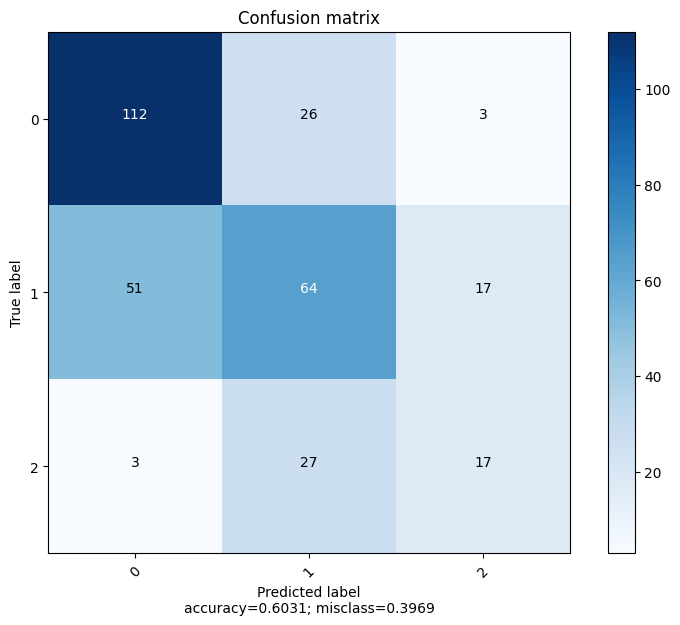

In [121]:
y_pred = model.predict(test_dataset.X_data,binary=binary)
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(cm)

#### Resposta

In [122]:
import torch.nn as nn
from tqdm.notebook import tqdm
import torch
import numpy as np
from metrics import *
from typing import Tuple, Dict, List

In [123]:
class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement. 
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print            
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss

In [124]:
def train_es(model: torch.nn.Module , train_loader: torch.utils.data.DataLoader, 
         val_set: Tuple[torch.Tensor, torch.Tensor], epochs: int, device: torch.device, 
         lr: float, binary: bool = True, skip: int = 1) -> Tuple[Dict[str, List[float]], torch.Tensor]:
    """
    Trains a Pytorch model on a given training data.
    Parameters:
    model (torch.nn.Module): The model to be trained
    train_loader (DataLoader): The training data in the form of a Pytorch DataLoader
    val_set (tuple): A tuple containing the validation data and labels
    epochs (int): The number of times the training data should be passed through the model
    device (str or torch.device): The device on which to perform the computations (e.g. 'cpu' or 'cuda')
    lr (float): The learning rate for the optimizer
    binary (bool): Boolean indicating whether the task is binary classification or not. Default: True
    skip (int): The number of epochs after which the training and validation results will be printed. Default: 1
    Returns:
    tuple: A tuple containing the training history and the predicted labels after training
    """

    early_stopping = EarlyStopping(patience=5,verbose=True)

    if binary:
        criterion = nn.BCEWithLogitsLoss()
    else:
        criterion = nn.CrossEntropyLoss()

    optimizer = torch.optim.SGD(model.parameters(), lr=lr)

    history = {'acc_train' : [], 'loss_train': [], 'acc_val': [], 'loss_val': []}

    for e in tqdm(range(1, epochs+1)):

        y_hat = np.array([])

        train_epoch_loss = 0
        train_epoch_acc = 0
        model.train()
        for X_train_batch, y_train_batch in train_loader:
            X, y = X_train_batch.to(device), y_train_batch.to(device)
            optimizer.zero_grad()
            
            y_pred = model(X)
            
            loss = criterion(y_pred, y)
            if binary:
                acc = binary_acc(y_pred,y)
            else:
                acc = accuracy(y_pred, y)
            
            loss.backward()
            optimizer.step()
            
            train_epoch_loss += loss.item()
            train_epoch_acc += acc.item()
            y_p = torch.argmax(y_pred, dim=1)
            y_hat = np.concatenate((y_hat, y_p))


        model.eval()
        _, val_loss, val_acc = evaluate_es(model, val_set, criterion, binary=binary)

        history['acc_train'].append(train_epoch_acc/len(train_loader))
        history['loss_train'].append(train_epoch_loss/len(train_loader))
        history['acc_val'].append(val_acc)
        history['loss_val'].append(val_loss)

        if e%skip == 0:
            print(f'Epoch {e+0:03}: | Train Loss: {train_epoch_loss/len(train_loader):.3f} | Val Loss: {val_loss:.4f} | Train Acc: {train_epoch_acc/len(train_loader):.4f}| Val Acc: {val_acc:.4f}')
        
        early_stopping(val_loss, model)
        if early_stopping.early_stop:
          print("Early stopping")
          break

    return history, y_hat

In [125]:
def evaluate_es(model: torch.nn.Module, val_set: Tuple[torch.tensor, torch.tensor], 
            criterion: torch.nn.Module, binary:bool =True) -> Tuple[torch.tensor, float, float]:
    """
    Evaluates a Pytorch model on a given dataset.
    Parameters:
    model (torch.nn.Module): The model to be evaluated
    data (tuple): A tuple containing the data and labels
    criterion (torch.nn.Module): The loss function to be used
    binary (bool): Boolean indicating whether the task is binary classification or not. Default: True
    Returns:
    tuple: A tuple containing predicted labels, loss, and accuracy
    """
    
    X = val_set.X_data
    y = val_set.y_data
    
    with torch.no_grad():
        y_pred = model(X)
    loss = criterion(y_pred, y)
    if binary:
        acc = binary_acc(y_pred, y)
    else:
        acc = accuracy(y_pred, y)
    y_pred = torch.argmax(y_pred, dim=1)

    return y_pred, loss.item(), acc.item()


In [126]:
history, y_hat = train_es(model, train_loader, val_dataset, epochs=250, lr=0.01, device=device, binary=binary)

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 0.756 | Val Loss: 0.7731 | Train Acc: 62.5625| Val Acc: 69.0000
Validation loss decreased (inf --> 0.773094).  Saving model ...
Epoch 002: | Train Loss: 0.756 | Val Loss: 0.7731 | Train Acc: 62.5625| Val Acc: 69.0000
Validation loss decreased (0.773094 --> 0.773081).  Saving model ...
Epoch 003: | Train Loss: 0.756 | Val Loss: 0.7731 | Train Acc: 62.4688| Val Acc: 69.0000
Validation loss decreased (0.773081 --> 0.773074).  Saving model ...
Epoch 004: | Train Loss: 0.756 | Val Loss: 0.7730 | Train Acc: 62.4688| Val Acc: 69.0000
Validation loss decreased (0.773074 --> 0.773038).  Saving model ...
Epoch 005: | Train Loss: 0.756 | Val Loss: 0.7730 | Train Acc: 62.4688| Val Acc: 69.0000
Validation loss decreased (0.773038 --> 0.773020).  Saving model ...
Epoch 006: | Train Loss: 0.756 | Val Loss: 0.7730 | Train Acc: 62.4688| Val Acc: 69.0000
Validation loss decreased (0.773020 --> 0.773000).  Saving model ...
Epoch 007: | Train Loss: 0.756 | Val Loss: 0.7730 | Train

              precision    recall  f1-score   support

           0       0.67      0.79      0.73       141
           1       0.55      0.48      0.51       132
           2       0.46      0.36      0.40        47

    accuracy                           0.60       320
   macro avg       0.56      0.55      0.55       320
weighted avg       0.59      0.60      0.59       320



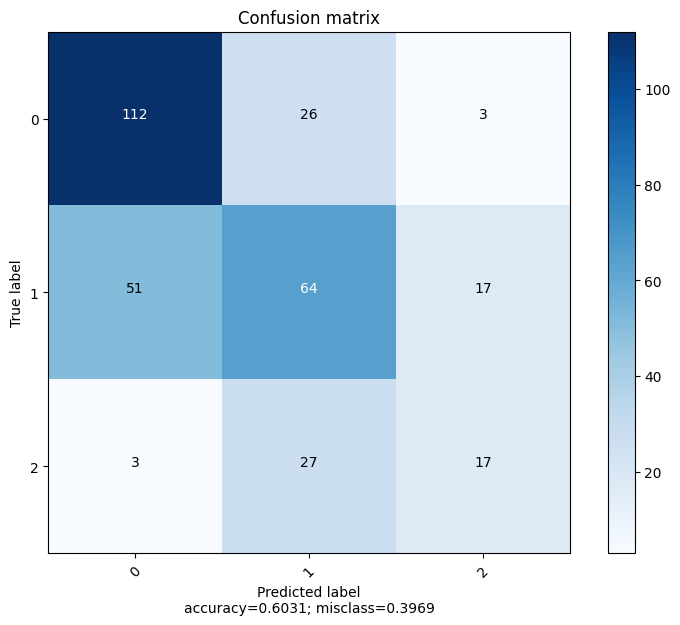

In [127]:
y_pred = model.predict(test_dataset.X_data,binary=binary)
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

plot_confusion_matrix(cm)

### 2)	Faça novos testes para avaliar o desempenho da Rede Neural no problema designado usando a técnica K-Fold (com K = 10). Comente o resultado obtido.

Dica: não é necessário utilizar a ferramenta KFold do scikit-learn para o desenvolvimento deste item. Uma alternativa <b> simples </b> é fazer um *for loop*, selecionando os índices em bloco. 

#### Rascunho

In [141]:
new_df = transform_data(dataset.iloc[:,:-1], normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [142]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

print('Multiclass classification')
n_output = encoder.classes_.shape[0]

Multiclass classification


In [143]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [144]:
#train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
#val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

#train_loader = DataLoader(dataset=train_dataset,batch_size=batch_size)
#val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

In [111]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')

In [129]:
lr = 0.01
epochs=250

In [145]:
X_train_dataset = []
Y_train_dataset = []

In [146]:
for x in range(0,11):
    #for y in range((x-1)*len(train_dataset)//10,x*len(train_dataset)//10):
    X_train_dataset.append(X_train[(x-1)*len(X_train)//10:x*len(X_train)//10])
    Y_train_dataset.append(y_train[(x-1)*len(y_train)//10:x*len(y_train)//10])
    #val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
    #val_loader = DataLoader(dataset=val_dataset, batch_size=1)
    #for y in range((x-1)*len(train_dataset)//10,x*len(train_dataset)//10):
    #  X_train2 = np.delete(X_train, y)

In [115]:
X_train_dataset = np.delete(X_train_dataset, 0, 0)
Y_train_dataset = np.delete(Y_train_dataset, 0, 0)

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


In [116]:
X_val = X_train_dataset[0]
y_val = Y_train_dataset[0]

In [117]:
X_val = X_train_dataset[0]
y_val = Y_train_dataset[0]
val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
#val_loader = DataLoader(dataset=val_dataset, batch_size=1)
X_train = np.delete(X_train_dataset, 0, 0)
Y_train = np.delete(Y_train_dataset, 0, 0)

In [118]:
Xtrain = np.concatenate((X_train_dataset[0],X_train_dataset[1]))

In [119]:
ytrain = np.concatenate((Y_train_dataset[0],Y_train_dataset[1]))

In [120]:
for z in range(2,len(Y_train_dataset)):
  ytrain = np.concatenate((ytrain,Y_train_dataset[z]))

In [121]:
for z in range(2,len(X_train_dataset)):
  Xtrain = np.concatenate((Xtrain,X_train_dataset[z]))

In [122]:
train_dataset = CustomDataset(torch.from_numpy(Xtrain).float(), torch.from_numpy(ytrain).long())
train_loader = DataLoader(dataset=train_dataset,batch_size=32)

In [140]:
from sklearn.metrics import accuracy_score

In [123]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')
history, y_hat = train(model, train_loader, val_dataset, epochs=epochs, lr=lr, device=device, binary=False)

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.058 | Val Loss: 1.0545 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 002: | Train Loss: 1.043 | Val Loss: 1.0371 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 003: | Train Loss: 1.030 | Val Loss: 1.0234 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 004: | Train Loss: 1.021 | Val Loss: 1.0126 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 005: | Train Loss: 1.014 | Val Loss: 1.0041 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 006: | Train Loss: 1.009 | Val Loss: 0.9974 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 007: | Train Loss: 1.005 | Val Loss: 0.9921 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 008: | Train Loss: 1.002 | Val Loss: 0.9879 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 009: | Train Loss: 1.000 | Val Loss: 0.9846 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 010: | Train Loss: 0.998 | Val Loss: 0.9818 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 011: | Train Loss: 0.997 | Val Loss: 0.9796 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 012: | Train Lo

In [147]:
acuracia=[]
for x in range(0,10):
  X_val = X_train_dataset[x]
  y_val = Y_train_dataset[x]
  val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
  #val_loader = DataLoader(dataset=val_dataset, batch_size=1)
  X_train = np.delete(X_train_dataset, x, 0)
  Y_train = np.delete(Y_train_dataset, x, 0)
  Xtrain = np.concatenate((X_train_dataset[0],X_train_dataset[1]))
  Ytrain = np.concatenate((Y_train_dataset[0],Y_train_dataset[1]))
  for z in range(2,len(X_train_dataset)):
    Xtrain = np.concatenate((Xtrain,X_train_dataset[z]))
  for z in range(2,len(Y_train_dataset)):
    Ytrain = np.concatenate((Ytrain,Y_train_dataset[z]))
  train_dataset = CustomDataset(torch.from_numpy(Xtrain).float(), torch.from_numpy(Ytrain).long())
  train_loader = DataLoader(dataset=train_dataset,batch_size=32)
  model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')
  history, y_hat = train(model, train_loader, val_dataset, epochs=epochs, lr=lr, device=device, binary=False)
  y_pred = model.predict(test_dataset.X_data,binary=False)
  acuracia.append(accuracy_score(y_test, y_pred))


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.063 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 002: | Train Loss: 1.048 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 003: | Train Loss: 1.036 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 004: | Train Loss: 1.028 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 005: | Train Loss: 1.021 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 006: | Train Loss: 1.015 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 007: | Train Loss: 1.011 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 008: | Train Loss: 1.007 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 009: | Train Loss: 1.004 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 010: | Train Loss: 1.002 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 011: | Train Loss: 1.000 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 012: | Train Loss: 0.998 | Val Loss: nan | Train Acc: 47.1500| Val Acc: nan
Epoch 013: | Tra

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.198 | Val Loss: 1.1607 | Train Acc: 29.7250| Val Acc: 42.0000
Epoch 002: | Train Loss: 1.151 | Val Loss: 1.1191 | Train Acc: 39.2750| Val Acc: 44.0000
Epoch 003: | Train Loss: 1.115 | Val Loss: 1.0875 | Train Acc: 39.6500| Val Acc: 44.0000
Epoch 004: | Train Loss: 1.087 | Val Loss: 1.0631 | Train Acc: 39.6500| Val Acc: 44.0000
Epoch 005: | Train Loss: 1.066 | Val Loss: 1.0440 | Train Acc: 39.6500| Val Acc: 44.0000
Epoch 006: | Train Loss: 1.049 | Val Loss: 1.0290 | Train Acc: 39.6500| Val Acc: 44.0000
Epoch 007: | Train Loss: 1.036 | Val Loss: 1.0172 | Train Acc: 39.8000| Val Acc: 44.0000
Epoch 008: | Train Loss: 1.026 | Val Loss: 1.0079 | Train Acc: 40.2750| Val Acc: 46.0000
Epoch 009: | Train Loss: 1.017 | Val Loss: 1.0005 | Train Acc: 43.4500| Val Acc: 47.0000
Epoch 010: | Train Loss: 1.011 | Val Loss: 0.9947 | Train Acc: 44.3750| Val Acc: 45.0000
Epoch 011: | Train Loss: 1.006 | Val Loss: 0.9899 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.025 | Val Loss: 1.0263 | Train Acc: 39.5250| Val Acc: 46.0000
Epoch 002: | Train Loss: 1.015 | Val Loss: 1.0189 | Train Acc: 46.4750| Val Acc: 51.0000
Epoch 003: | Train Loss: 1.009 | Val Loss: 1.0135 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 004: | Train Loss: 1.004 | Val Loss: 1.0094 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 005: | Train Loss: 1.000 | Val Loss: 1.0063 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 006: | Train Loss: 0.998 | Val Loss: 1.0039 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 007: | Train Loss: 0.995 | Val Loss: 1.0018 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 008: | Train Loss: 0.993 | Val Loss: 1.0002 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 009: | Train Loss: 0.992 | Val Loss: 0.9988 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 010: | Train Loss: 0.991 | Val Loss: 0.9977 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 011: | Train Loss: 0.989 | Val Loss: 0.9968 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.030 | Val Loss: 0.9851 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 002: | Train Loss: 1.022 | Val Loss: 0.9842 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 003: | Train Loss: 1.015 | Val Loss: 0.9844 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 004: | Train Loss: 1.010 | Val Loss: 0.9854 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 005: | Train Loss: 1.006 | Val Loss: 0.9869 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 006: | Train Loss: 1.003 | Val Loss: 0.9884 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 007: | Train Loss: 1.000 | Val Loss: 0.9900 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 008: | Train Loss: 0.998 | Val Loss: 0.9916 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 009: | Train Loss: 0.997 | Val Loss: 0.9931 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 010: | Train Loss: 0.995 | Val Loss: 0.9945 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 011: | Train Loss: 0.994 | Val Loss: 0.9958 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.044 | Val Loss: 1.0039 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 002: | Train Loss: 1.033 | Val Loss: 0.9932 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 003: | Train Loss: 1.025 | Val Loss: 0.9851 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 004: | Train Loss: 1.018 | Val Loss: 0.9788 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 005: | Train Loss: 1.013 | Val Loss: 0.9739 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 006: | Train Loss: 1.009 | Val Loss: 0.9701 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 007: | Train Loss: 1.006 | Val Loss: 0.9670 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 008: | Train Loss: 1.003 | Val Loss: 0.9645 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 009: | Train Loss: 1.001 | Val Loss: 0.9624 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 010: | Train Loss: 0.999 | Val Loss: 0.9607 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 011: | Train Loss: 0.998 | Val Loss: 0.9592 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.059 | Val Loss: 1.0304 | Train Acc: 39.6500| Val Acc: 45.0000
Epoch 002: | Train Loss: 1.040 | Val Loss: 1.0197 | Train Acc: 39.6500| Val Acc: 45.0000
Epoch 003: | Train Loss: 1.027 | Val Loss: 1.0127 | Train Acc: 39.6500| Val Acc: 45.0000
Epoch 004: | Train Loss: 1.018 | Val Loss: 1.0080 | Train Acc: 39.6500| Val Acc: 45.0000
Epoch 005: | Train Loss: 1.011 | Val Loss: 1.0050 | Train Acc: 39.6500| Val Acc: 45.0000
Epoch 006: | Train Loss: 1.006 | Val Loss: 1.0029 | Train Acc: 45.6000| Val Acc: 46.0000
Epoch 007: | Train Loss: 1.003 | Val Loss: 1.0014 | Train Acc: 46.0000| Val Acc: 45.0000
Epoch 008: | Train Loss: 1.000 | Val Loss: 1.0003 | Train Acc: 47.0000| Val Acc: 42.0000
Epoch 009: | Train Loss: 0.997 | Val Loss: 0.9994 | Train Acc: 47.0000| Val Acc: 41.0000
Epoch 010: | Train Loss: 0.996 | Val Loss: 0.9988 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 011: | Train Loss: 0.994 | Val Loss: 0.9983 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.078 | Val Loss: 1.0702 | Train Acc: 45.2500| Val Acc: 47.0000
Epoch 002: | Train Loss: 1.044 | Val Loss: 1.0539 | Train Acc: 50.1000| Val Acc: 46.0000
Epoch 003: | Train Loss: 1.022 | Val Loss: 1.0453 | Train Acc: 48.8500| Val Acc: 43.0000
Epoch 004: | Train Loss: 1.007 | Val Loss: 1.0407 | Train Acc: 47.1250| Val Acc: 41.0000
Epoch 005: | Train Loss: 0.998 | Val Loss: 1.0381 | Train Acc: 47.2000| Val Acc: 41.0000
Epoch 006: | Train Loss: 0.990 | Val Loss: 1.0358 | Train Acc: 47.2750| Val Acc: 41.0000
Epoch 007: | Train Loss: 0.985 | Val Loss: 1.0348 | Train Acc: 47.4500| Val Acc: 42.0000
Epoch 008: | Train Loss: 0.982 | Val Loss: 1.0343 | Train Acc: 47.6000| Val Acc: 42.0000
Epoch 009: | Train Loss: 0.979 | Val Loss: 1.0341 | Train Acc: 47.9000| Val Acc: 41.0000
Epoch 010: | Train Loss: 0.977 | Val Loss: 1.0339 | Train Acc: 48.0500| Val Acc: 42.0000
Epoch 011: | Train Loss: 0.975 | Val Loss: 1.0335 | Train Acc: 48.3500| Val Acc: 43.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.260 | Val Loss: 1.2203 | Train Acc: 13.2000| Val Acc: 13.0000
Epoch 002: | Train Loss: 1.197 | Val Loss: 1.1654 | Train Acc: 13.2000| Val Acc: 13.0000
Epoch 003: | Train Loss: 1.150 | Val Loss: 1.1243 | Train Acc: 13.2000| Val Acc: 13.0000
Epoch 004: | Train Loss: 1.114 | Val Loss: 1.0931 | Train Acc: 28.7750| Val Acc: 50.0000
Epoch 005: | Train Loss: 1.087 | Val Loss: 1.0696 | Train Acc: 47.1500| Val Acc: 50.0000
Epoch 006: | Train Loss: 1.067 | Val Loss: 1.0516 | Train Acc: 47.1500| Val Acc: 50.0000
Epoch 007: | Train Loss: 1.051 | Val Loss: 1.0378 | Train Acc: 47.1500| Val Acc: 50.0000
Epoch 008: | Train Loss: 1.039 | Val Loss: 1.0270 | Train Acc: 47.1500| Val Acc: 50.0000
Epoch 009: | Train Loss: 1.030 | Val Loss: 1.0187 | Train Acc: 47.1500| Val Acc: 50.0000
Epoch 010: | Train Loss: 1.022 | Val Loss: 1.0121 | Train Acc: 47.1500| Val Acc: 50.0000
Epoch 011: | Train Loss: 1.016 | Val Loss: 1.0068 | Train Acc: 47.1500| Val Acc: 50.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.118 | Val Loss: 1.0764 | Train Acc: 39.6500| Val Acc: 45.0000
Epoch 002: | Train Loss: 1.081 | Val Loss: 1.0504 | Train Acc: 39.6500| Val Acc: 45.0000
Epoch 003: | Train Loss: 1.056 | Val Loss: 1.0320 | Train Acc: 39.6500| Val Acc: 45.0000
Epoch 004: | Train Loss: 1.037 | Val Loss: 1.0187 | Train Acc: 39.8000| Val Acc: 45.0000
Epoch 005: | Train Loss: 1.025 | Val Loss: 1.0090 | Train Acc: 41.3750| Val Acc: 49.0000
Epoch 006: | Train Loss: 1.016 | Val Loss: 1.0021 | Train Acc: 45.7500| Val Acc: 57.0000
Epoch 007: | Train Loss: 1.009 | Val Loss: 0.9970 | Train Acc: 43.0500| Val Acc: 43.0000
Epoch 008: | Train Loss: 1.004 | Val Loss: 0.9931 | Train Acc: 45.3250| Val Acc: 38.0000
Epoch 009: | Train Loss: 1.000 | Val Loss: 0.9901 | Train Acc: 46.3000| Val Acc: 41.0000
Epoch 010: | Train Loss: 0.997 | Val Loss: 0.9878 | Train Acc: 47.2250| Val Acc: 43.0000
Epoch 011: | Train Loss: 0.995 | Val Loss: 0.9860 | Train Acc: 47.3750| Val Acc: 43.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.132 | Val Loss: 1.1118 | Train Acc: 14.6000| Val Acc: 23.0000
Epoch 002: | Train Loss: 1.093 | Val Loss: 1.0783 | Train Acc: 34.9000| Val Acc: 40.0000
Epoch 003: | Train Loss: 1.066 | Val Loss: 1.0555 | Train Acc: 43.6750| Val Acc: 50.0000
Epoch 004: | Train Loss: 1.049 | Val Loss: 1.0395 | Train Acc: 43.8250| Val Acc: 45.0000
Epoch 005: | Train Loss: 1.036 | Val Loss: 1.0278 | Train Acc: 43.4750| Val Acc: 41.0000
Epoch 006: | Train Loss: 1.026 | Val Loss: 1.0190 | Train Acc: 44.1000| Val Acc: 41.0000
Epoch 007: | Train Loss: 1.019 | Val Loss: 1.0121 | Train Acc: 45.1000| Val Acc: 44.0000
Epoch 008: | Train Loss: 1.013 | Val Loss: 1.0067 | Train Acc: 45.4750| Val Acc: 45.0000
Epoch 009: | Train Loss: 1.009 | Val Loss: 1.0023 | Train Acc: 46.0750| Val Acc: 45.0000
Epoch 010: | Train Loss: 1.005 | Val Loss: 0.9988 | Train Acc: 46.6750| Val Acc: 45.0000
Epoch 011: | Train Loss: 1.003 | Val Loss: 0.9961 | Train Acc: 46.8250| Val Acc: 46.0000
Epoch 012: | Train Lo

In [148]:
acuracia

[0.56875,
 0.59375,
 0.578125,
 0.56875,
 0.5875,
 0.59375,
 0.575,
 0.575,
 0.578125,
 0.55]

#### Resposta

A primeira questao foi transformar os dados já normalizado de acordo como foi definido os dados

In [163]:
new_df = transform_data(dataset.iloc[:,:-1], normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [164]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

print('Multiclass classification')
n_output = encoder.classes_.shape[0]

Multiclass classification


Em seguida foi feita a divisâo de treino e teste 

In [165]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [166]:
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

Nesse momento foi dividida a base de treino em K-Fold definidos

In [167]:
X_train_dataset = []
Y_train_dataset = []

In [168]:
for x in range(0,11):
    X_train_dataset.append(X_train[(x-1)*len(X_train)//10:x*len(X_train)//10])
    Y_train_dataset.append(y_train[(x-1)*len(y_train)//10:x*len(y_train)//10])

In [169]:
X_train_dataset = np.delete(X_train_dataset, 0, 0)
Y_train_dataset = np.delete(Y_train_dataset, 0, 0)

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:5030: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asarray(arr)


Em seguida foi criada um loop para conseguir separar a base e rodar o treinamento entre 1 e 10 Folds rodando por cada parte dos valores a seguir 

In [170]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

In [174]:
acuracia = []
precision = []
f1score = []
recall = []
folds = []
for x in range(0,10):
  X_val = X_train_dataset[x]
  y_val = Y_train_dataset[x]
  val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
  #val_loader = DataLoader(dataset=val_dataset, batch_size=1)
  X_train = np.delete(X_train_dataset, x, 0)
  Y_train = np.delete(Y_train_dataset, x, 0)
  Xtrain = np.concatenate((X_train_dataset[0],X_train_dataset[1]))
  Ytrain = np.concatenate((Y_train_dataset[0],Y_train_dataset[1]))
  for z in range(2,len(X_train_dataset)):
    Xtrain = np.concatenate((Xtrain,X_train_dataset[z]))
  for z in range(2,len(Y_train_dataset)):
    Ytrain = np.concatenate((Ytrain,Y_train_dataset[z]))
  train_dataset = CustomDataset(torch.from_numpy(Xtrain).float(), torch.from_numpy(Ytrain).long())
  train_loader = DataLoader(dataset=train_dataset,batch_size=32)
  model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')
  history, y_hat = train(model, train_loader, val_dataset, epochs=epochs, lr=lr, device=device, binary=False)
  y_pred = model.predict(test_dataset.X_data,binary=False)
  folds.append(x)
  acuracia.append(accuracy_score(y_test, y_pred))
  precision.append(precision_score(y_test, y_pred,average='weighted'))
  f1score.append(f1_score(y_test, y_pred,average='weighted'))
  recall.append(recall_score(y_test, y_pred,average='weighted'))

resultado = dict(folds = folds,
                   accuracy = acuracia,
                   precision = precision,
                   f1score = f1score,
                   recall = recall)
resultado_df = pd.DataFrame(data=resultado)

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.091 | Val Loss: 1.0644 | Train Acc: 35.0000| Val Acc: 39.0000
Epoch 002: | Train Loss: 1.055 | Val Loss: 1.0340 | Train Acc: 38.7500| Val Acc: 39.0000
Epoch 003: | Train Loss: 1.032 | Val Loss: 1.0139 | Train Acc: 43.4750| Val Acc: 43.0000
Epoch 004: | Train Loss: 1.017 | Val Loss: 1.0005 | Train Acc: 47.1750| Val Acc: 45.0000
Epoch 005: | Train Loss: 1.008 | Val Loss: 0.9915 | Train Acc: 47.1000| Val Acc: 44.0000
Epoch 006: | Train Loss: 1.002 | Val Loss: 0.9853 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 007: | Train Loss: 0.998 | Val Loss: 0.9807 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 008: | Train Loss: 0.995 | Val Loss: 0.9774 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 009: | Train Loss: 0.993 | Val Loss: 0.9748 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 010: | Train Loss: 0.991 | Val Loss: 0.9728 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 011: | Train Loss: 0.990 | Val Loss: 0.9711 | Train Acc: 47.1500| Val Acc: 45.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.115 | Val Loss: 1.0741 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 002: | Train Loss: 1.077 | Val Loss: 1.0489 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 003: | Train Loss: 1.050 | Val Loss: 1.0327 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 004: | Train Loss: 1.031 | Val Loss: 1.0224 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 005: | Train Loss: 1.019 | Val Loss: 1.0161 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 006: | Train Loss: 1.010 | Val Loss: 1.0122 | Train Acc: 47.1500| Val Acc: 51.0000
Epoch 007: | Train Loss: 1.005 | Val Loss: 1.0098 | Train Acc: 47.2250| Val Acc: 51.0000
Epoch 008: | Train Loss: 1.001 | Val Loss: 1.0083 | Train Acc: 47.2250| Val Acc: 51.0000
Epoch 009: | Train Loss: 0.998 | Val Loss: 1.0073 | Train Acc: 47.2250| Val Acc: 51.0000
Epoch 010: | Train Loss: 0.996 | Val Loss: 1.0066 | Train Acc: 47.2250| Val Acc: 51.0000
Epoch 011: | Train Loss: 0.995 | Val Loss: 1.0061 | Train Acc: 47.2250| Val Acc: 51.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.130 | Val Loss: 1.0498 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 002: | Train Loss: 1.100 | Val Loss: 1.0332 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 003: | Train Loss: 1.076 | Val Loss: 1.0214 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 004: | Train Loss: 1.057 | Val Loss: 1.0133 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 005: | Train Loss: 1.043 | Val Loss: 1.0079 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 006: | Train Loss: 1.031 | Val Loss: 1.0045 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 007: | Train Loss: 1.022 | Val Loss: 1.0026 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 008: | Train Loss: 1.015 | Val Loss: 1.0017 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 009: | Train Loss: 1.010 | Val Loss: 1.0015 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 010: | Train Loss: 1.006 | Val Loss: 1.0017 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 011: | Train Loss: 1.002 | Val Loss: 1.0022 | Train Acc: 47.1500| Val Acc: 56.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.124 | Val Loss: 1.0946 | Train Acc: 25.3500| Val Acc: 54.0000
Epoch 002: | Train Loss: 1.094 | Val Loss: 1.0669 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 003: | Train Loss: 1.072 | Val Loss: 1.0458 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 004: | Train Loss: 1.055 | Val Loss: 1.0296 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 005: | Train Loss: 1.042 | Val Loss: 1.0167 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 006: | Train Loss: 1.032 | Val Loss: 1.0063 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 007: | Train Loss: 1.024 | Val Loss: 0.9979 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 008: | Train Loss: 1.018 | Val Loss: 0.9910 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 009: | Train Loss: 1.013 | Val Loss: 0.9853 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 010: | Train Loss: 1.009 | Val Loss: 0.9806 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 011: | Train Loss: 1.005 | Val Loss: 0.9766 | Train Acc: 47.1500| Val Acc: 55.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.053 | Val Loss: 1.0451 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 002: | Train Loss: 1.028 | Val Loss: 1.0267 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 003: | Train Loss: 1.012 | Val Loss: 1.0155 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 004: | Train Loss: 1.003 | Val Loss: 1.0085 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 005: | Train Loss: 0.997 | Val Loss: 1.0040 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 006: | Train Loss: 0.993 | Val Loss: 1.0011 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 007: | Train Loss: 0.990 | Val Loss: 0.9991 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 008: | Train Loss: 0.988 | Val Loss: 0.9977 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 009: | Train Loss: 0.987 | Val Loss: 0.9966 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 010: | Train Loss: 0.986 | Val Loss: 0.9958 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 011: | Train Loss: 0.985 | Val Loss: 0.9952 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.072 | Val Loss: 1.0838 | Train Acc: 47.0750| Val Acc: 41.0000
Epoch 002: | Train Loss: 1.056 | Val Loss: 1.0742 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 003: | Train Loss: 1.043 | Val Loss: 1.0670 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 004: | Train Loss: 1.033 | Val Loss: 1.0617 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 005: | Train Loss: 1.026 | Val Loss: 1.0578 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 006: | Train Loss: 1.019 | Val Loss: 1.0549 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 007: | Train Loss: 1.014 | Val Loss: 1.0529 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 008: | Train Loss: 1.010 | Val Loss: 1.0514 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 009: | Train Loss: 1.007 | Val Loss: 1.0504 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 010: | Train Loss: 1.004 | Val Loss: 1.0498 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 011: | Train Loss: 1.002 | Val Loss: 1.0494 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.114 | Val Loss: 1.0912 | Train Acc: 34.3000| Val Acc: 37.0000
Epoch 002: | Train Loss: 1.068 | Val Loss: 1.0562 | Train Acc: 39.8500| Val Acc: 37.0000
Epoch 003: | Train Loss: 1.043 | Val Loss: 1.0348 | Train Acc: 42.2500| Val Acc: 43.0000
Epoch 004: | Train Loss: 1.027 | Val Loss: 1.0200 | Train Acc: 46.2750| Val Acc: 46.0000
Epoch 005: | Train Loss: 1.016 | Val Loss: 1.0091 | Train Acc: 47.5250| Val Acc: 50.0000
Epoch 006: | Train Loss: 1.007 | Val Loss: 1.0009 | Train Acc: 50.0250| Val Acc: 50.0000
Epoch 007: | Train Loss: 1.001 | Val Loss: 0.9948 | Train Acc: 50.0500| Val Acc: 48.0000
Epoch 008: | Train Loss: 0.997 | Val Loss: 0.9901 | Train Acc: 48.9500| Val Acc: 49.0000
Epoch 009: | Train Loss: 0.993 | Val Loss: 0.9865 | Train Acc: 48.8750| Val Acc: 50.0000
Epoch 010: | Train Loss: 0.991 | Val Loss: 0.9837 | Train Acc: 48.4250| Val Acc: 50.0000
Epoch 011: | Train Loss: 0.988 | Val Loss: 0.9815 | Train Acc: 48.1750| Val Acc: 50.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.141 | Val Loss: 1.1163 | Train Acc: 13.2000| Val Acc: 12.0000
Epoch 002: | Train Loss: 1.102 | Val Loss: 1.0864 | Train Acc: 31.3500| Val Acc: 41.0000
Epoch 003: | Train Loss: 1.076 | Val Loss: 1.0650 | Train Acc: 41.1250| Val Acc: 41.0000
Epoch 004: | Train Loss: 1.057 | Val Loss: 1.0487 | Train Acc: 46.0500| Val Acc: 42.0000
Epoch 005: | Train Loss: 1.043 | Val Loss: 1.0362 | Train Acc: 47.0000| Val Acc: 43.0000
Epoch 006: | Train Loss: 1.032 | Val Loss: 1.0265 | Train Acc: 47.1500| Val Acc: 43.0000
Epoch 007: | Train Loss: 1.023 | Val Loss: 1.0189 | Train Acc: 47.1500| Val Acc: 43.0000
Epoch 008: | Train Loss: 1.017 | Val Loss: 1.0128 | Train Acc: 47.1500| Val Acc: 43.0000
Epoch 009: | Train Loss: 1.012 | Val Loss: 1.0079 | Train Acc: 47.1500| Val Acc: 43.0000
Epoch 010: | Train Loss: 1.007 | Val Loss: 1.0039 | Train Acc: 47.1500| Val Acc: 43.0000
Epoch 011: | Train Loss: 1.004 | Val Loss: 1.0005 | Train Acc: 47.1500| Val Acc: 43.0000
Epoch 012: | Train Lo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.043 | Val Loss: 1.0307 | Train Acc: 39.6500| Val Acc: 40.0000
Epoch 002: | Train Loss: 1.032 | Val Loss: 1.0204 | Train Acc: 39.6500| Val Acc: 40.0000
Epoch 003: | Train Loss: 1.023 | Val Loss: 1.0122 | Train Acc: 39.6500| Val Acc: 40.0000
Epoch 004: | Train Loss: 1.016 | Val Loss: 1.0056 | Train Acc: 39.6500| Val Acc: 40.0000
Epoch 005: | Train Loss: 1.011 | Val Loss: 1.0003 | Train Acc: 44.8250| Val Acc: 53.0000
Epoch 006: | Train Loss: 1.006 | Val Loss: 0.9960 | Train Acc: 49.7250| Val Acc: 55.0000
Epoch 007: | Train Loss: 1.003 | Val Loss: 0.9924 | Train Acc: 49.8250| Val Acc: 55.0000
Epoch 008: | Train Loss: 1.000 | Val Loss: 0.9895 | Train Acc: 49.6500| Val Acc: 55.0000
Epoch 009: | Train Loss: 0.998 | Val Loss: 0.9870 | Train Acc: 49.2250| Val Acc: 55.0000
Epoch 010: | Train Loss: 0.996 | Val Loss: 0.9848 | Train Acc: 48.8250| Val Acc: 54.0000
Epoch 011: | Train Loss: 0.994 | Val Loss: 0.9829 | Train Acc: 48.7250| Val Acc: 54.0000
Epoch 012: | Train Lo

  0%|          | 0/250 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.170 | Val Loss: 1.1076 | Train Acc: 39.6500| Val Acc: 48.0000
Epoch 002: | Train Loss: 1.123 | Val Loss: 1.0717 | Train Acc: 39.6500| Val Acc: 48.0000
Epoch 003: | Train Loss: 1.089 | Val Loss: 1.0453 | Train Acc: 39.6500| Val Acc: 48.0000
Epoch 004: | Train Loss: 1.063 | Val Loss: 1.0259 | Train Acc: 39.6500| Val Acc: 48.0000
Epoch 005: | Train Loss: 1.044 | Val Loss: 1.0117 | Train Acc: 39.6500| Val Acc: 48.0000
Epoch 006: | Train Loss: 1.030 | Val Loss: 1.0012 | Train Acc: 39.8500| Val Acc: 48.0000
Epoch 007: | Train Loss: 1.019 | Val Loss: 0.9935 | Train Acc: 40.5250| Val Acc: 48.0000
Epoch 008: | Train Loss: 1.012 | Val Loss: 0.9878 | Train Acc: 44.7250| Val Acc: 46.0000
Epoch 009: | Train Loss: 1.006 | Val Loss: 0.9835 | Train Acc: 47.1750| Val Acc: 41.0000
Epoch 010: | Train Loss: 1.002 | Val Loss: 0.9803 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 011: | Train Loss: 0.999 | Val Loss: 0.9777 | Train Acc: 47.1500| Val Acc: 41.0000
Epoch 012: | Train Lo

In [175]:
resultado_df

,folds,accuracy,precision,f1score,recall
0,0,0.584375,0.570050,0.570610,0.584375
1,1,0.581250,0.568059,0.563579,0.581250
2,2,0.587500,0.576490,0.567755,0.587500
3,3,0.584375,0.568352,0.564976,0.584375
4,4,0.578125,0.559025,0.562658,0.578125
5,5,0.578125,0.574847,0.550285,0.578125
6,6,0.584375,0.498660,0.538125,0.584375
7,7,0.581250,0.491655,0.532134,0.581250
8,8,0.584375,0.578560,0.551655,0.584375
9,9,0.584375,0.569428,0.569154,0.584375


In [176]:
np.mean(acuracia)

0.5828125

Com a utiliação dos folds houve uma grande queda nas métricas utilizadas, parte dessa queda acredito ser por conta dos poucos dados utilizados principalmente quando dividimos o mesmo em 10, portanto a utilização do K-Fold não foi benéfica para o modelo

### 3)	Faça análises e novas implementações que você julgue importante para o seu trabalho. Não esqueça de explicar a motivação da análise realizada. 

#### Rascunho

#### Resposta

O melhor resultado obtido pelos teste feita foi através da base normalizada com 200 épocas.
Para efetuar um melhor teste vai ser feito uma divisâo com 10% do teste para que tenhamos um maior valor de treinamento a fim de conseguir um maior valor de treinamento da base

In [193]:
new_df = transform_data(dataset.iloc[:,:-1], normalize=True)
new_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,target
0,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0
1,0.283186,0.520548,0.00,0.116438,0.143573,0.338028,0.215548,0.494126,0.362205,0.209581,0.215385,0
2,0.283186,0.438356,0.04,0.095890,0.133556,0.197183,0.169611,0.508811,0.409449,0.191617,0.215385,0
3,0.584071,0.109589,0.56,0.068493,0.105175,0.225352,0.190813,0.582232,0.330709,0.149701,0.215385,1
4,0.247788,0.397260,0.00,0.068493,0.106845,0.140845,0.098940,0.567548,0.606299,0.137725,0.153846,0


In [194]:
X = new_df.values[:,:-1].astype('float')
target = new_df.values[:,-1]

encoder = LabelEncoder()
y = encoder.fit_transform(target)

n_input = X.shape[1]

print('Multiclass classification')
n_output = encoder.classes_.shape[0]

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.1,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.1,random_state=42)

Multiclass classification


In [195]:
train_dataset = CustomDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_dataset = CustomDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = CustomDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

train_loader = DataLoader(dataset=train_dataset,batch_size=32)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

In [196]:
model = NeuralNetwork(n_input = n_input, n_output=n_output,output_activation='sigmoid')
history, y_hat = train(model, train_loader, val_dataset, epochs=200, lr=lr, device=device, binary=False)

  0%|          | 0/200 [00:00<?, ?it/s]

Epoch 001: | Train Loss: 1.218 | Val Loss: 1.2133 | Train Acc: 13.9512| Val Acc: 9.0000
Epoch 002: | Train Loss: 1.164 | Val Loss: 1.1540 | Train Acc: 13.9512| Val Acc: 9.0000
Epoch 003: | Train Loss: 1.124 | Val Loss: 1.1074 | Train Acc: 14.0488| Val Acc: 11.0000
Epoch 004: | Train Loss: 1.093 | Val Loss: 1.0705 | Train Acc: 36.2439| Val Acc: 51.0000
Epoch 005: | Train Loss: 1.070 | Val Loss: 1.0408 | Train Acc: 43.8049| Val Acc: 58.0000
Epoch 006: | Train Loss: 1.052 | Val Loss: 1.0164 | Train Acc: 44.1951| Val Acc: 58.0000
Epoch 007: | Train Loss: 1.037 | Val Loss: 0.9971 | Train Acc: 44.4634| Val Acc: 58.0000
Epoch 008: | Train Loss: 1.026 | Val Loss: 0.9819 | Train Acc: 44.7073| Val Acc: 58.0000
Epoch 009: | Train Loss: 1.018 | Val Loss: 0.9700 | Train Acc: 45.0000| Val Acc: 58.0000
Epoch 010: | Train Loss: 1.012 | Val Loss: 0.9608 | Train Acc: 45.2683| Val Acc: 59.0000
Epoch 011: | Train Loss: 1.007 | Val Loss: 0.9534 | Train Acc: 45.2683| Val Acc: 59.0000
Epoch 012: | Train Loss

In [197]:
y_pred = model.predict(test_dataset.X_data,binary=False)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.64      0.75      0.69        72
           1       0.49      0.56      0.52        66
           2       0.00      0.00      0.00        22

    accuracy                           0.57       160
   macro avg       0.38      0.44      0.40       160
weighted avg       0.49      0.57      0.53       160



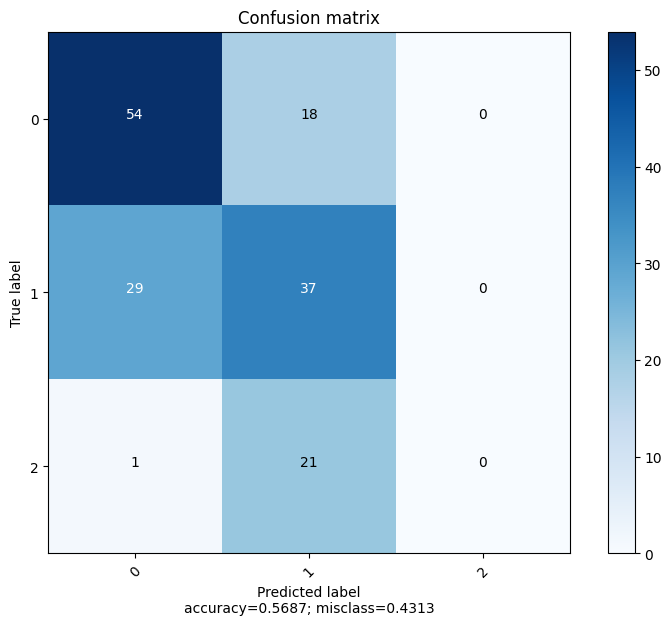

In [198]:
  print(classification_report(y_test, y_pred))

  cm = confusion_matrix(y_test, y_pred)

  plot_confusion_matrix(cm)

Entretanto o aumento da base de treinamento não resultou em uma melhora da assertividade dos dados pois não foi levado em consideração a classe 2.
Um melhora que poderia ser feito na base é compor as classes do target com o mesmo valor para que pudesse ter uma melhor diferenciação entre as classes